# Covid19 Data Analysis

<img src="Covid-19-curves-graphic-social-v3.gif">

Source: [Siouxsie Wiles](https://thespinoff.co.nz/society/09-03-2020/the-three-phases-of-covid-19-and-how-we-can-make-it-manageable/)

## Background
The White House Office of Science and Technology Policy (OSTP) pulled together a coalition research groups and companies (including Kaggle) to prepare the COVID-19 Open Research Dataset (CORD-19) to attempt to address key open scientific questions on COVID-19. Those questions are drawn from National Academies of Sciences, Engineering, and Medicine’s (NASEM) and the World Health Organization (WHO).

## The Challenge
Kaggle is launching a companion COVID-19 forecasting challenges to help answer a subset of the NASEM/WHO questions. 

While the challenge involves forecasting confirmed cases and fatalities between April 2 and May 14 by region, the primary goal isn't only to produce accurate forecasts. It’s also to identify factors that appear to impact the transmission rate of COVID-19.

As the data becomes available, Kaggle will update the leaderboard with live results based on data made available from the Johns Hopkins University Center for Systems Science and Engineering (JHU CSSE).

## Analysis
In this challenge, I will be analyzing the open-source data from different contributors on Kaggle to answer these critical questions:

- **What do we know about non-pharmaceutical interventions?** Ex: quarantine, cancelling large gatherings, widespread testing, etc.)

- **What is known about transmission, incubation, and environmental stability?** Ex: Data on temperature, humidity and wind speed by region.

- **What do we know about COVID-19 risk factors?** Ex: Percentage of the population that smokes, numbers of death by lung diseses or numbers of ICU for the patients in a country.

- **When should we expect the number of infected cases will start to stabilize and decrease?** 

- **What would be the maximum number of cases in N days?**

In addition, I will predict the cumulative number of confirmed COVID19 cases as well as fatal cases in **184 countries** across the world for future dates **(ranging from April 2 - May 14)**.

**Disclaimer from Kaggle:** We understand this is a serious situation, and in no way want to trivialize the human impact this crisis is causing by predicting fatalities. Our goal is to provide better methods for estimates that can assist medical and governmental institutions to prepare and adjust as pandemics unfold.


## About

### COVID-19 (Corona Virus Disease 2019)
- Caused by a SARS-COV-2 corona virus.
- First identified in Wuhan, Hubei, China. The earliest reported symptoms was detected in November 2019.
- On 30 January the WHO declared the outbreak to be a Public Health Emergency of International Concern
- Until today, nearly 1 million people around the world are confirmed to be positive with Covid-19 by [Worldometer live tracking](https://www.worldometers.info/coronavirus/)


### Data:

- [Novel Coronavirus (COVID-19) Cases, provided by JHU CSSE](https://github.com/CSSEGISandData/COVID-19)

- [COVID19 Global Forecasting (Week 2)](https://www.kaggle.com/c/covid19-global-forecasting-week-2/data)

- [COVID-19 Complete Dataset (Updated every 24hrs)](https://www.kaggle.com/imdevskp/corona-virus-report)

- [COVID19 Demographic Data](https://www.kaggle.com/koryto/countryinfo#covid19countryinfo.csv)

- [World Population Data](https://www.kaggle.com/anjum48/covid19-population-data)

- [Weather Data](https://www.kaggle.com/noaa/gsod)

- [Additiional Weather Data](https://www.kaggle.com/winterpierre91/covid19-global-weather-data#temperature_dataframe.csv)

## Table of content

### 1) [Data Exploratory Analysis](#eda)
  - [Number of cases around the world](#world)
  - [Days since first outbreak](#first_outbreak)
  - [Deep dive into confirmed, fatal and recover cases](#confirm_fatal)
  - [Statistics of top 3 COVID19 Infected Countries](#top3_countries)
  - [Statistics for each 3 continents - Europe, Asia, North America](#continents)
  - [Understand the affect of weather on COVID19 transmission and fatalities](#temp)
  - [Understand the affect of demographic on COVID19 transmission and fatalities](#demo)
  - [What's happened after the first quarantine of top 3 impacted countries by Covid-19?](#quarantine)
  
### 2) [SEIR Model](#SEIR) 
What's logistic curve or SEIR model and how they are related to predicting the pandemic?

- [Logistic Curve](#logistic_curve)
- [SEIR Model break-down](#SEIR_model)


### 3) [Prediction](#prediction)

For prediciton purpose, I will try mainly 3 predictive models (Random Forest, Multilinear Regression and Bayesian Ridge Regression) for each type of data, which I eventually assembled all different variables together to feed in the prediction models as well. 

So far, the Random Forest Model with Weather Variables is having the best Public Score on Kaggle. However, I will continue to improve on the model performance in the next couple of days.

- [Forecast with Original Dataset](#original)
 - [Random Forest Model](#original_rf)
 - [Multilinear Regression](#original_lin)
 - [Bayesian Ridge Regression](#original_br)
- [Forecast with Weather features](#weather_predict)
 - [Random Forest Model](#weather_rf)
 - [Multilinear Regression](#weather_lin)
 - [Bayesian Ridge Regression](#weather_br)
- [Forecast with additional feature - distance from the first outbreak of the continent](#distance)
 - [Random Forest Model](#distance_rf)
 - [Multilinear Regression](#distance_lin)
 - [Bayesian Ridge Regression](#distance_br)
- [Forecast with Demographic features](#demo_predict)
 - [Random Forest Model](#demo_rf)
 - [Multilinear Regression](#demo_lin)
 - [Bayesian Ridge Regression](#demo_br)
- [Forecast with all additional features above](#all_predict)
 - [Random Forest Model](#all_rf)
 - [Multilinear Regression](#all_lin)
 - [Bayesian Ridge Regression](#all_br)
 
### 4 ) [Conclusion](#conclusion)


### Load Packages

In [1]:
### Load packages

import pandas as pd
import seaborn as sns
import numpy as np
import numpy
import matplotlib.pyplot as plt
from matplotlib import style
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn import svm
%matplotlib inline

sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
sns.set_palette("husl")


#Preprocessing
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

#metrics
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, make_scorer

#feature selection
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn import model_selection

#Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn import datasets
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestRegressor

#Regression
from sklearn.linear_model import LogisticRegression, BayesianRidge, LinearRegression
from sklearn import metrics
import statsmodels.api as sm

#logistic curve
from scipy.optimize import curve_fit

#LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

#seed
import random

# Normalizing continuous variables
from sklearn.preprocessing import MinMaxScaler


# Visualization

## Bokeh
from bokeh.plotting import output_notebook, figure, show
from bokeh.models import ColumnDataSource, Div, Select, Button, ColorBar, CustomJS
from bokeh.layouts import row, column, layout
from bokeh.transform import cumsum, linear_cmap
from bokeh.palettes import Blues8, Spectral3
from bokeh.plotting import figure, output_file, show

## Plotly
from plotly.offline import iplot
from plotly import tools
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as py
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)
import chart_studio
import chart_studio.plotly as py
import plotly.io as pio

from matplotlib import dates
import plotly.graph_objects as go

# Time series
from fbprophet import Prophet
import datetime
from datetime import datetime

# Google BigQuery
from google.cloud import bigquery

#import cdist
from scipy.spatial.distance import cdist

# to solve SEIR
from scipy.integrate import solve_ivp

#others
from pathlib import Path
import os
from tqdm.notebook import tqdm
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_log_error, mean_squared_error
from matplotlib import dates
import plotly.graph_objects as go
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline



In [2]:
#plotly setup
username = 'giang.nguyen86' # your username
api_key = 'nUNuZWL4gYVy99dUueiP' # your api key - go to profile > settings > regenerate key
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)


### Load Data

#### Train dataset from Kaggle

In [3]:
### Load in the data from Kaggle Week 2

train = pd.read_csv("covid19-global-forecasting-week-4/train.csv",parse_dates=['Date'])
                    
train.tail()

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
27226,35651,NaN,Zimbabwe,2020-04-13,17.0,3.0
27227,35652,NaN,Zimbabwe,2020-04-14,17.0,3.0
27228,35653,NaN,Zimbabwe,2020-04-15,23.0,3.0
27229,35654,NaN,Zimbabwe,2020-04-16,23.0,3.0
27230,35655,NaN,Zimbabwe,2020-04-17,24.0,3.0


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27231 entries, 0 to 27230
Data columns (total 6 columns):
Id                27231 non-null int64
Province_State    11571 non-null object
Country_Region    27231 non-null object
Date              27231 non-null datetime64[ns]
ConfirmedCases    27231 non-null float64
Fatalities        27231 non-null float64
dtypes: datetime64[ns](1), float64(2), int64(1), object(2)
memory usage: 1.2+ MB


In [232]:
len(train.Country_Region.unique())

184

#### Test set from Kaggle

In [5]:
# Test dataset from Kaggle

test = pd.read_csv("covid19-global-forecasting-week-4/test.csv",parse_dates=['Date'])
                    
test.tail()


,ForecastId,Province_State,Country_Region,Date
13454,13455,NaN,Zimbabwe,2020-05-10
13455,13456,NaN,Zimbabwe,2020-05-11
13456,13457,NaN,Zimbabwe,2020-05-12
13457,13458,NaN,Zimbabwe,2020-05-13
13458,13459,NaN,Zimbabwe,2020-05-14


#### Submission File from Kaggle

In [6]:
submit = pd.read_csv("covid19-global-forecasting-week-4/submission.csv")
                     
submit.head()

,ForecastId,ConfirmedCases,Fatalities
0,1,1,1
1,2,1,1
2,3,1,1
3,4,1,1
4,5,1,1


#### Complete dataset that include Geographic Data

In [7]:
#read the complete data set

complete_data = pd.read_csv('corona-virus-report/covid_19_clean_complete.csv', parse_dates=['Date'])

complete_data = complete_data.rename(columns = {'Province/State': 'Province_State', 'Country/Region': 'Country_Region'})

complete_data['Active'] = complete_data['Confirmed'] - complete_data['Deaths'] - complete_data['Recovered']

complete_data.sort_values(by=['Date','Confirmed'], ascending=False).head()


INFO:numexpr.utils:NumExpr defaulting to 8 threads.


,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
22757,NaN,US,37.0902,-95.7129,2020-04-17,699706,36773,58545,604388
22733,NaN,Spain,40.0000,-4.0000,2020-04-17,190839,20002,74797,96040
22669,NaN,Italy,43.0000,12.0000,2020-04-17,172434,22745,42727,106962
22648,NaN,France,46.2276,2.2137,2020-04-17,147969,18681,34420,94868
22652,NaN,Germany,51.0000,9.0000,2020-04-17,141397,4352,83114,53931


In [8]:
complete_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22794 entries, 0 to 22793
Data columns (total 9 columns):
Province_State    6960 non-null object
Country_Region    22794 non-null object
Lat               22794 non-null float64
Long              22794 non-null float64
Date              22794 non-null datetime64[ns]
Confirmed         22794 non-null int64
Deaths            22794 non-null int64
Recovered         22794 non-null int64
Active            22794 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(4), object(2)
memory usage: 1.6+ MB


#### Demographic Data

Special thanks to [My Koryto](https://www.kaggle.com/koryto) for the contribution of the data.

**Dictionary**

- Population (2020)
- Density: The number of people who lives per square meter. (2020)
- Median age (2020)
- Urban population: the % of the population who lives in urban areas. (2020)
- Hospital beds per 1,000 people
- Forced quarantine policy initial date: I believe that a couple of weeks after this specific date, we can assume there would be a reduction of the infection rate. (updated on a daily basis)
- School closure policy initial date: Same as (6). (updated on a daily basis)
- Public places (bars, restaurants, movie theatres, etc.) closure policy initial date (updated on a daily basis)
- The maximum amount of people allowed in gatherings and the initial date of the policy (updated on a daily basis)
- Non-essential house leaving - initial date of the restriction (updated on a daily basis)
- Sex ratio grouped by age groups (amount of males per female). (2020)
- Lung disease death rate per 100k people, separated by sex. (2020)
- % of smokers within the population: The higher this number is, the higher the fatalities number would be. (2019)
- Amount of COVID detection test made per day: for about 50 countries
- GDP-nominal (2019)
- Health expenses in international USD (2019, 2017, 2015)
- Health expenses divided by population (2020 - population), (2019, 2017, 2015 - health expenses)
- Average amount of children per woman (2017)
- First patient detection date
- Total confirmed cases (updated on a daily basis)
- Total active cases (updated on a daily basis)
- New confirmed cases (updated on a daily basis)
- Total deaths (updated on a daily basis)
- New deaths (updated on a daily basis)
- Total recovered (updated on a daily basis)
- Amount of patients in critical situation (updated on a daily basis)
- Total cases / 1 million population (updated on a daily basis)
- Total deaths / 1 million population (updated on a daily basis)


In [9]:
#read the demographic data

demo_data = pd.read_csv('countryinfo/covid19countryinfo.csv')

demo_data['pop']=demo_data['pop'].str.replace(',', '').astype('float')

demo_data['healthexp']=demo_data['healthexp'].str.replace(',', '').astype('float')


demo_data.head()

,region,country,alpha3code,alpha2code,pop,tests,testpop,density,medianage,urbanpop,...,newdeaths2,newdeaths3,recovered,critical30,critical31,critical1,critical2,critical3,casediv1m,deathdiv1m
0,NaN,Afghanistan,AFG,AF,38928346.0,NaN,NaN,60.0,18.0,25.0,...,NaN,NaN,10,NaN,NaN,NaN,NaN,NaN,7,0.2
1,NaN,Albania,ALB,AL,2877797.0,NaN,NaN,105.0,36.0,63.0,...,1.0,NaN,89,7,8,7,7,7,106,6.0
2,NaN,Algeria,DZA,DZ,43851044.0,NaN,NaN,18.0,29.0,73.0,...,NaN,NaN,61,NaN,NaN,NaN,NaN,NaN,22,2.0
3,NaN,Andorra,AND,AD,77265.0,NaN,NaN,164.0,45.0,88.0,...,1.0,1.0,16,10,10,12,12,12,"5,682",207.0
4,NaN,Antigua and Barbuda,ATG,AG,97929.0,NaN,NaN,223.0,34.0,26.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92,NaN


Special thanks to [Datasaurus](https://www.kaggle.com/anjum48/covid19-population-data) for the Population data source.

In [10]:
pop_info = pd.read_csv('countryinfo/population_data.csv')

pop_info.head()

,Name,Population,Type
0,Alabama,4888000.0,Province/State
1,Alaska,737438.0,Province/State
2,Alberta,4371000.0,Province/State
3,Anhui,62000000.0,Province/State
4,Arizona,7172000.0,Province/State


#### Weather Data

Data was retrievied following the amazing work by [Davide Bonin](https://www.kaggle.com/davidbnn92/weather-data/#data)

I created my own version and the data can be found [here](https://www.kaggle.com/giginghn/weather-features)

**Dictionary**

- **temp**: temperature for the day in degrees Fahrenheit to tenths. Missing = 9999.9
- **max**: Maximum temperature reported during the day in Fahrenheit to tenths--time of max temp report varies by country and region, so this will sometimes not be the max for the calendar day. Missing = 9999.9
- **min**: Minimum temperature reported during the day in Fahrenheit to tenths--time of min temp report varies by country and region, so this will sometimes not be the min for the calendar day. Missing = 9999.9
- **stp**: Mean station pressure for the day in millibars to tenths. Missing = 9999.9
- **wdsp**: Mean wind speed for the day in knots to tenths. Missing = 999.9
- **prcp**: Total precipitation (rain and/or melted snow) reported during the day in inches and hundredths; will usually not end with the midnight observation--i.e., may include latter part of previous day. .00 indicates no measurable precipitation (includes a trace). Missing = 99.9
- **fog**: Indicators (1 = yes, 0 = no/not reported) for the occurrence during the day

In [11]:
# Weather data
weather_data = pd.read_csv("weather/training_data_with_weather_info_week_4.csv", parse_dates=['Date'])
weather_test = pd.read_csv("weather/testing_data_with_weather_info_week_4.csv", parse_dates=['Date'])


In [12]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27231 entries, 0 to 27230
Data columns (total 18 columns):
Id                    27231 non-null int64
Id.1                  27231 non-null int64
Province_State        11571 non-null object
Country_Region        27231 non-null object
Date                  27231 non-null datetime64[ns]
ConfirmedCases        27231 non-null float64
Fatalities            27231 non-null float64
country+province      27231 non-null object
Lat                   27231 non-null float64
Long                  27231 non-null float64
day_from_jan_first    27231 non-null int64
temp                  27231 non-null float64
min                   27231 non-null float64
max                   27231 non-null float64
stp                   27231 non-null float64
wdsp                  27231 non-null float64
prcp                  27231 non-null float64
fog                   27231 non-null int64
dtypes: datetime64[ns](1), float64(10), int64(4), object(3)
memory usage: 3.7+ MB


In [13]:

weather_data.head()


,Id,Id.1,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,country+province,Lat,Long,day_from_jan_first,temp,min,max,stp,wdsp,prcp,fog
0,0,1,NaN,Afghanistan,2020-01-22,0.0,0.0,Afghanistan-,33.0,65.0,22,42.6,33.6,54.9,999.9,9.4,0.00,0
1,1,2,NaN,Afghanistan,2020-01-23,0.0,0.0,Afghanistan-,33.0,65.0,23,42.0,32.7,55.9,999.9,14.9,99.99,1
2,2,3,NaN,Afghanistan,2020-01-24,0.0,0.0,Afghanistan-,33.0,65.0,24,40.1,36.9,43.2,999.9,10.4,0.17,1
3,3,4,NaN,Afghanistan,2020-01-25,0.0,0.0,Afghanistan-,33.0,65.0,25,46.0,37.9,56.3,999.9,6.1,0.57,1
4,4,5,NaN,Afghanistan,2020-01-26,0.0,0.0,Afghanistan-,33.0,65.0,26,42.8,36.1,53.1,999.9,10.8,0.00,1


In [14]:

weather_data = weather_data.replace(9999.9,np.NaN)

weather_data = weather_data.replace(999.9,np.NaN)

weather_data = weather_data.replace(99.99,np.NaN)

weather_data.head()


,Id,Id.1,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,country+province,Lat,Long,day_from_jan_first,temp,min,max,stp,wdsp,prcp,fog
0,0,1,NaN,Afghanistan,2020-01-22,0.0,0.0,Afghanistan-,33.0,65.0,22,42.6,33.6,54.9,NaN,9.4,0.00,0
1,1,2,NaN,Afghanistan,2020-01-23,0.0,0.0,Afghanistan-,33.0,65.0,23,42.0,32.7,55.9,NaN,14.9,NaN,1
2,2,3,NaN,Afghanistan,2020-01-24,0.0,0.0,Afghanistan-,33.0,65.0,24,40.1,36.9,43.2,NaN,10.4,0.17,1
3,3,4,NaN,Afghanistan,2020-01-25,0.0,0.0,Afghanistan-,33.0,65.0,25,46.0,37.9,56.3,NaN,6.1,0.57,1
4,4,5,NaN,Afghanistan,2020-01-26,0.0,0.0,Afghanistan-,33.0,65.0,26,42.8,36.1,53.1,NaN,10.8,0.00,1


In [15]:
#interpolate missing value with linear method

weather_data['stp'] = weather_data['stp'].interpolate(method ='linear', limit_direction ='both') 
weather_data['wdsp'] = weather_data['wdsp'].interpolate(method ='linear', limit_direction ='both') 
weather_data['prcp'] = weather_data['prcp'].interpolate(method ='linear', limit_direction ='both') 

weather_data.sort_values(['Date']).tail()


,Id,Id.1,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,country+province,Lat,Long,day_from_jan_first,temp,min,max,stp,wdsp,prcp,fog
12266,16046,16047,NaN,India,2020-04-17,14352.0,486.0,India-,21.000000,78.000000,108,93.7,74.7,109.2,6.846591,0.0,0.00,0
14963,19580,19581,NaN,Mauritania,2020-04-17,7.0,1.0,Mauritania-,21.007900,10.940800,108,87.9,72.1,100.6,957.563429,0.0,0.00,0
20966,27446,27447,Arkansas,US,2020-04-17,1695.0,37.0,US-Arkansas,34.969700,-92.373100,108,44.4,41.4,47.3,11.500000,3.3,0.00,0
12179,15932,15933,NaN,Iceland,2020-04-17,1754.0,9.0,Iceland-,64.963100,-19.020800,108,44.2,41.9,47.5,19.600000,11.7,0.03,0
27230,35654,35655,NaN,Zimbabwe,2020-04-17,24.0,3.0,Zimbabwe-,-17.829167,31.052222,108,85.0,69.1,95.4,854.500000,3.8,0.00,0


**Additional Source: Humidity and Sun Hours**

Special thanks to [@winterpierre](https://www.kaggle.com/winterpierre91/covid19-global-weather-data#temperature_dataframe.csv) for the additional weather data.

The data contains average temperature, hours of sunlight, percent humidity, and wind speed in the capital city of 156 countries. The date ranges from 22/1/2020 to 21/3/2020

In [16]:
## From @winterpierre source

weather_addition = pd.read_csv("weather/temperature_dataframe.csv", parse_dates=['date'])

#rename column
weather_addition.columns = ['Unnamed: 0', 'Id', 'Province_State', 'Country_Region', 'lat', 'long', 'Date',
       'ConfirmedCases', 'Fatalities', 'capital', 'humidity', 'sunHour', 'tempC',
       'windspeedKmph']

#fix the name US for consistency
weather_addition = weather_addition.replace('USA','US')

weather_addition.head()


,Unnamed: 0,Id,Province_State,Country_Region,lat,long,Date,ConfirmedCases,Fatalities,capital,humidity,sunHour,tempC,windspeedKmph
0,0,1,NaN,Afghanistan,33.0,65.0,2020-01-22,0.0,0.0,Kabul,65.0,8.7,-1.0,8.0
1,1,2,NaN,Afghanistan,33.0,65.0,2020-01-23,0.0,0.0,Kabul,59.0,8.7,-3.0,8.0
2,2,3,NaN,Afghanistan,33.0,65.0,2020-01-24,0.0,0.0,Kabul,71.0,7.1,0.0,7.0
3,3,4,NaN,Afghanistan,33.0,65.0,2020-01-25,0.0,0.0,Kabul,79.0,8.7,0.0,7.0
4,4,5,NaN,Afghanistan,33.0,65.0,2020-01-26,0.0,0.0,Kabul,64.0,8.7,-1.0,8.0


### Shelter In Place information

In [17]:

lockdown = pd.read_csv('lockdown/countryLockdowndates.csv', parse_dates=['Date'])

lockdown = lockdown.replace(pd.to_datetime('2020-11-03'),pd.to_datetime('2020-03-11'))


lockdown.head()


,Country/Region,Province,Date,Type,Reference
0,Afghanistan,NaN,2020-03-24,Full,https://www.thestatesman.com/world/afghan-govt...
1,Albania,NaN,2020-08-03,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
2,Algeria,NaN,2020-03-24,Full,https://www.garda.com/crisis24/news-alerts/325...
3,Andorra,NaN,2020-03-16,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
4,Angola,NaN,2020-03-24,Full,https://en.wikipedia.org/wiki/2020_coronavirus...


In [18]:

high_risk_eu = ['Germany','Spain','Italy','France']

lockdown1 = lockdown.loc[lockdown['Country/Region'].isin(high_risk_eu)==True]

lockdown1.sort_values(['Date'])


,Country/Region,Province,Date,Type,Reference
143,Italy,NaN,2020-03-11,Full,https://www.businessinsider.com/countries-on-l...
217,Spain,NaN,2020-03-14,Full,https://www.businessinsider.com/countries-on-l...
120,France,NaN,2020-03-16,Full,https://www.businessinsider.com/countries-on-l...
114,France,Martinique,2020-03-20,Partial,https://en.wikipedia.org/wiki/2020_coronavirus...
124,Germany,NaN,2020-03-20,Full,https://www.politico.eu/article/german-state-o...
112,France,French Polynesia,2020-03-27,Partial,https://en.wikipedia.org/wiki/2020_coronavirus...
111,France,French Guiana,NaT,None,NaN
113,France,Guadeloupe,NaT,None,NaN
115,France,Mayotte,NaT,None,NaN
116,France,New Caledonia,NaT,None,NaN


In [19]:
high_risk_us = ['US']

lockdown2 = lockdown.loc[lockdown['Country/Region'].isin(high_risk_us)==True]

lockdown2.sort_values(['Date'])


,Country/Region,Province,Date,Type,Reference
275,US,Nevada,2020-02-04,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
266,US,Maine,2020-02-04,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
285,US,Pennsylvania,2020-02-04,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
291,US,Texas,2020-02-04,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
255,US,Florida,2020-02-04,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
271,US,Mississippi,2020-03-04,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
286,US,Puerto Rico,2020-03-13,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
250,US,California,2020-03-19,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
260,US,Illinois,2020-03-21,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
277,US,New Jersey,2020-03-21,Full,https://en.wikipedia.org/wiki/2020_coronavirus...


In [20]:
high_risk_us = ['Iran','Turkey','Russia','India','Korea, South']

lockdown3 = lockdown.loc[lockdown['Country/Region'].isin(high_risk_us)==True]

lockdown3


,Country/Region,Province,Date,Type,Reference
137,India,NaN,2020-03-24,Full,https://www.businessinsider.com/countries-on-l...
139,Iran,NaN,2020-03-15,Full,https://www.dailymail.co.uk/news/article-81099...
150,"Korea, South",NaN,2020-02-23,Full,https://en.wikipedia.org/wiki/2020_coronavirus...
201,Russia,NaN,2020-03-27,Full,https://www.independent.co.uk/news/world/europ...
231,Turkey,NaN,2020-03-23,Full,https://en.wikipedia.org/wiki/2020_coronavirus...


### Number of tests conducted

In [21]:
test_conduct = pd.read_csv('test_conducted/Tests_Conducted_31Mar2020.csv')

test_conduct.head()

,Country or region,Tests,Positive,As of,Tests/ million,Positive/ thousands,Ref.,Source_1,Source_2
0,Argentina,2847,589.0,27-Mar,63,207.0,cite_note-1,https://www.argentina.gob.ar/sites/default/fil...,
1,Armenia,1580,265.0,25-Mar,535,168.0,cite_note-2,https://ncdc.am/coronavirus/confirmed-cases-by...,
2,Australia,245623,4559.0,31-Mar,9670,19.0,cite_note-3,https://twitter.com/Gajafar/status/12448971705...,
3,Austria,46441,8536.0,29-Mar,5217,184.0,cite_note-4,https://www.sozialministerium.at/Informationen...,
4,Azerbaijan,30000,273.0,30-Mar,3031,9.0,cite_note-5,https://koronavirusinfo.az/az%C9%99rbaycanda-c...,


### Cleaning Data

In [22]:
# case 
case = ['Confirmed', 'Deaths', 'Recovered', 'Active']

# Formula: Active Case = Confirmed - Deaths - Recovered
complete_data['Active'] = complete_data['Confirmed'] - complete_data['Deaths'] - complete_data['Recovered']

# impute missing values 
complete_data[['Province_State']] = complete_data[['Province_State']].fillna('')
complete_data[case] = complete_data[case].fillna(0)

complete_data.sort_values(by=['Date','Confirmed'], ascending=False).head()


,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
22757,,US,37.0902,-95.7129,2020-04-17,699706,36773,58545,604388
22733,,Spain,40.0000,-4.0000,2020-04-17,190839,20002,74797,96040
22669,,Italy,43.0000,12.0000,2020-04-17,172434,22745,42727,106962
22648,,France,46.2276,2.2137,2020-04-17,147969,18681,34420,94868
22652,,Germany,51.0000,9.0000,2020-04-17,141397,4352,83114,53931


In [23]:
complete_data.sort_values(by=['Date'], ascending=False).tail()

,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
170,,New Zealand,-40.9006,174.8860,2020-01-22,0,0,0,0
169,,Netherlands,52.1326,5.2913,2020-01-22,0,0,0,0
168,Sint Maarten,Netherlands,18.0425,-63.0548,2020-01-22,0,0,0,0
167,Curacao,Netherlands,12.1696,-68.9900,2020-01-22,0,0,0,0
0,,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0


## 1) Exploratory Data Analysis

<a id='eda'></a>

#### In this section, I will present some interactive visualizations for us to understand the big picture of our current situation in COVID-19 pandemic. 

### Number of cases around the world

<a id='world'></a>


In [24]:
map_covid = train.groupby(['Date', 'Country_Region'])['ConfirmedCases'].sum().reset_index()
map_covid['Date'] = map_covid['Date'].dt.strftime('%m/%d/%Y')
map_covid['size'] = map_covid['ConfirmedCases'].pow(0.3) * 3.5

fig = px.scatter_geo(map_covid, locations="Country_Region", locationmode='country names', 
                     color="ConfirmedCases", size='size', hover_name="Country_Region", 
                     range_color=[1,100],
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Confirmed Cases Around the Globe', color_continuous_scale="tealrose")
fig.show()


In [25]:
regions =pd.DataFrame()

regions['Country'] = map_covid["Country_Region"]
regions['Confirmed Cases'] = map_covid["ConfirmedCases"]

fig = px.choropleth(regions, locations='Country',
                    locationmode='country names',
                    color="Confirmed Cases",color_continuous_scale="tealrose")

fig.update_layout(title="COVID19 Confirmed Cases Globally")

fig.show()


In [26]:
#py.plot(fig, filename = 'COVID19: Confirmed Cases Globally', auto_open=True)


### What's the current situation?

In [27]:
# sum of all Confirmed cases by country as of March 26
sum_confirm = pd.DataFrame(complete_data.loc[complete_data['Date']==complete_data['Date'].max()].groupby(
    ['Country_Region'])['Confirmed'].sum()).reset_index()

# sum of all Death cases by country as of March 26
sum_death = pd.DataFrame(complete_data.loc[complete_data['Date']==complete_data['Date'].max()].groupby(
    ['Country_Region'])['Deaths'].sum()).reset_index()

# sum of all Recovered cases by country as of March 26
sum_recover = pd.DataFrame(complete_data.loc[complete_data['Date']==complete_data['Date'].max()].groupby(
    ['Country_Region'])['Recovered'].sum()).reset_index()

# sum of all Active cases by country as of March 26
sum_active = pd.DataFrame(complete_data.loc[complete_data['Date']==complete_data['Date'].max()].groupby(
    ['Country_Region'])['Active'].sum()).reset_index()


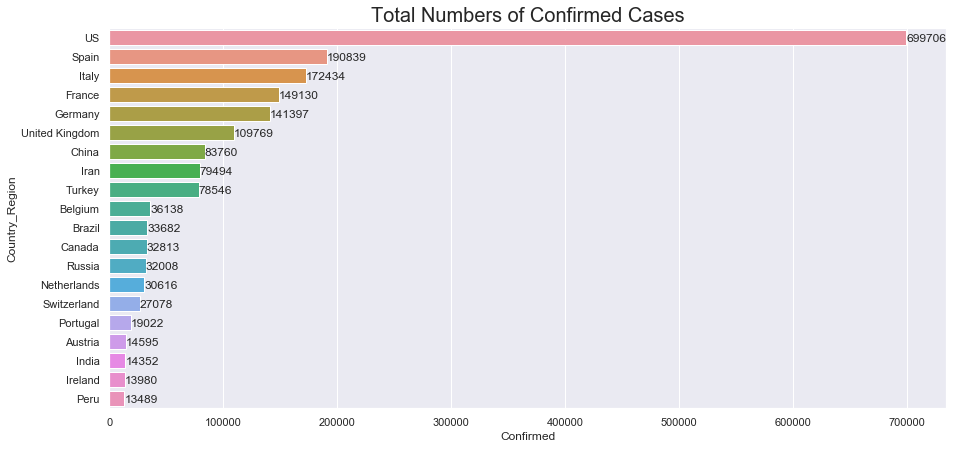

In [28]:
sns.set(rc={'figure.figsize':(15, 7)})

top20_confirm = sum_confirm.sort_values(by=['Confirmed'], ascending=False).head(20)

plot1 = sns.barplot(x="Confirmed",y="Country_Region", data=top20_confirm)

plt.title("Total Numbers of Confirmed Cases",fontsize=20)

for p in plot1.patches:
    width = p.get_width()
    plot1.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")

In [29]:
top20_confirm['Country_Region'].unique()

array(['US', 'Spain', 'Italy', 'France', 'Germany', 'United Kingdom',
       'China', 'Iran', 'Turkey', 'Belgium', 'Brazil', 'Canada', 'Russia',
       'Netherlands', 'Switzerland', 'Portugal', 'Austria', 'India',
       'Ireland', 'Peru'], dtype=object)

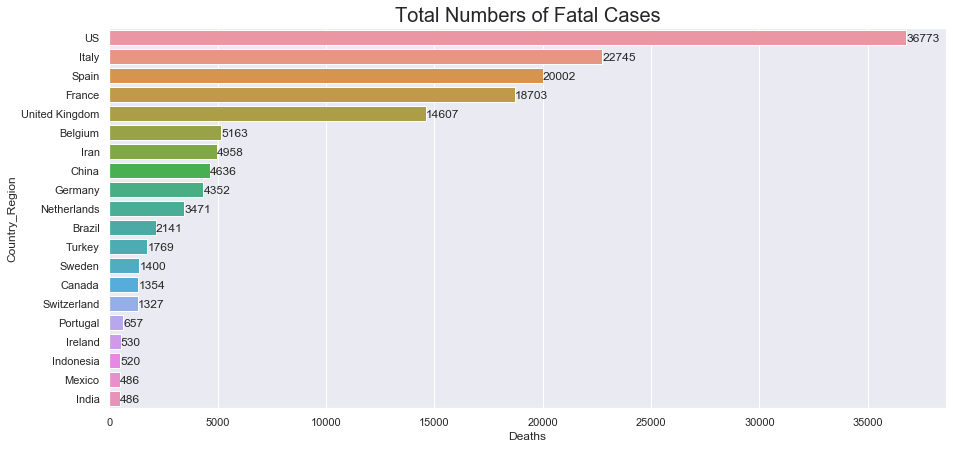

In [30]:

top20_death = sum_death.sort_values(by=['Deaths'], ascending=False).head(20)

plot2 = sns.barplot(x="Deaths",y="Country_Region", data=top20_death)

plt.title("Total Numbers of Fatal Cases",fontsize=20)

for p in plot2.patches:
    width = p.get_width()
    plot2.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")

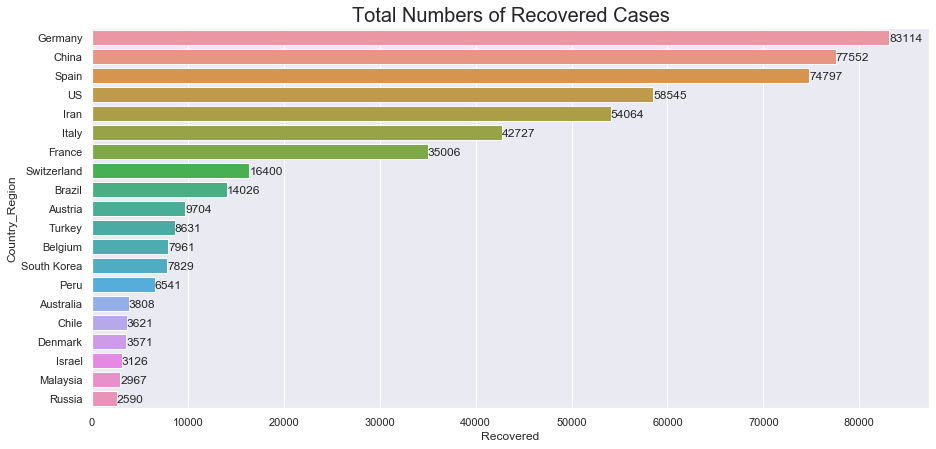

In [31]:
top20_recover = sum_recover.sort_values(by=['Recovered'], ascending=False).head(20)

plot3 = sns.barplot(x="Recovered",y="Country_Region", data=top20_recover)

plt.title("Total Numbers of Recovered Cases",fontsize=20)

for p in plot3.patches:
    width = p.get_width()
    plot3.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")

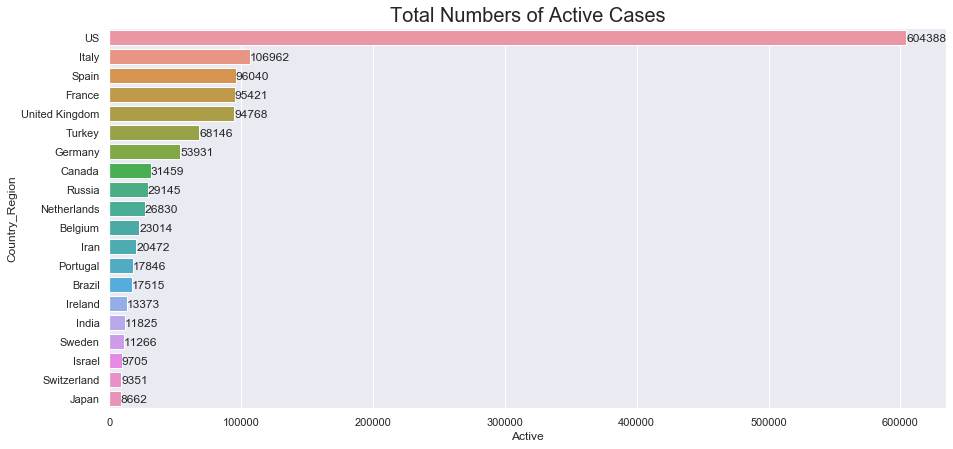

In [32]:
top20_active = sum_active.sort_values(by=['Active'], ascending=False).head(20)

plot4 = sns.barplot(x="Active",y="Country_Region", data=top20_active)

plt.title("Total Numbers of Active Cases",fontsize=20)

for p in plot4.patches:
    width = p.get_width()
    plot4.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")

### How long since the first outbreak?

<a id='first_outbreak'></a>



In [33]:
### Compute day first outbreak for each country
complete_data_first = train.copy()

countries_array = complete_data_first['Country_Region'].unique()

complete_data_first_outbreak = pd.DataFrame()

for i in countries_array:
    # get relevant data 
    day_first_outbreak = complete_data_first.loc[complete_data_first['Country_Region']==i]
    
    date_outbreak = day_first_outbreak.loc[day_first_outbreak['ConfirmedCases']>0]['Date'].min()
    
    #Calculate days since first outbreak happened
    day_first_outbreak['days_since_first_outbreak'] = (day_first_outbreak['Date'] 
                                                       - date_outbreak).astype('timedelta64[D]')
    
    #impute the negative days with 0
    day_first_outbreak['days_since_first_outbreak'][day_first_outbreak['days_since_first_outbreak']<0] = 0 
   
    complete_data_first_outbreak = complete_data_first_outbreak.append(day_first_outbreak,ignore_index=True)
    


In [34]:

complete_data_first_outbreak.head()


,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,days_since_first_outbreak
0,1,NaN,Afghanistan,2020-01-22,0.0,0.0,0.0
1,2,NaN,Afghanistan,2020-01-23,0.0,0.0,0.0
2,3,NaN,Afghanistan,2020-01-24,0.0,0.0,0.0
3,4,NaN,Afghanistan,2020-01-25,0.0,0.0,0.0
4,5,NaN,Afghanistan,2020-01-26,0.0,0.0,0.0


Text(0.5, 1.0, 'Total numbers of cases since first outbreak in top 10 countries')

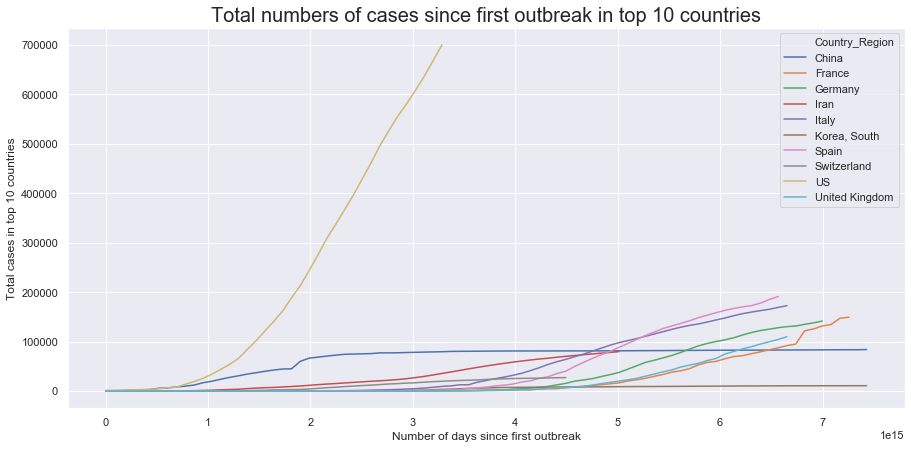

In [35]:
top20_confirm_first = complete_data_first_outbreak.loc[
    complete_data_first_outbreak['Country_Region'].isin(
        ['US', 'China', 'Italy', 'Spain', 'Germany', 'France', 'Iran',
       'United Kingdom', 'Switzerland', 'Korea, South'])==True]

top20_confirm_first = top20_confirm_first.groupby(['Country_Region','days_since_first_outbreak'])['ConfirmedCases'].sum().reset_index()

top20_confirm_first['days_since_first_outbreak'] = pd.to_timedelta(
    top20_confirm_first['days_since_first_outbreak'], unit='D')

sns.lineplot(data=top20_confirm_first, x="days_since_first_outbreak", y="ConfirmedCases", hue="Country_Region")

plt.ylabel("Total cases in top 10 countries")

plt.xlabel("Number of days since first outbreak")


plt.title("Total numbers of cases since first outbreak in top 10 countries",fontsize=20)



#### We can see that both China and Korea have hit the inflection point and flattened their curve for epidemic outbreak.

#### If we look closely at Italy, U.S. and Spain, they are increasing the infected cases with an exponential growth.

### Number of confirmed, fatal and recovered cases over time

<a id='confirm_fatal'></a>


#### Breakdown by Confirm and Fatal cases

Text(0.5, 1.0, 'Total numbers of Cases')

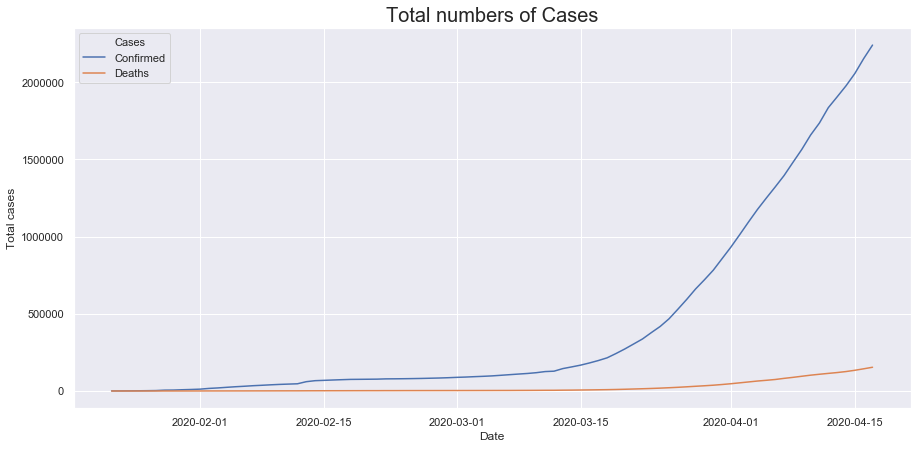

In [36]:

time_sum = complete_data.groupby('Date')['Date', 'Confirmed', 'Deaths'].sum().reset_index()

time_sum = pd.melt(time_sum, id_vars=['Date'], value_vars=['Confirmed','Deaths'])

time_sum = time_sum.rename(columns={"value": "total", "variable": "Cases"})

sns.lineplot(data=time_sum, x="Date", y="total", hue="Cases")

plt.ylabel("Total cases")

plt.title("Total numbers of Cases",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Confirmed on log scale')

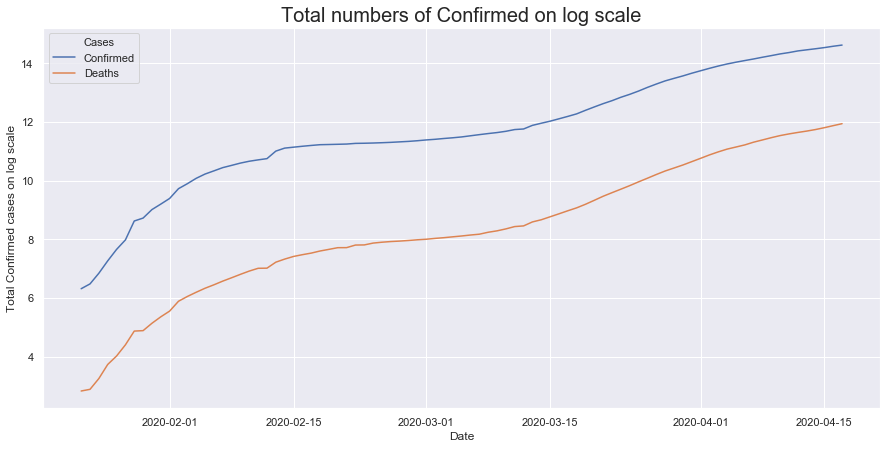

In [37]:
sns.set(rc={'figure.figsize':(15, 7)})

time_log = complete_data.groupby('Date')['Date', 'Confirmed', 'Deaths'].sum().reset_index()

time_log["Confirmed"] = np.log(time_log["Confirmed"])

time_log["Deaths"] = np.log(time_log["Deaths"])

time_log = pd.melt(time_log, id_vars=['Date'], value_vars=['Confirmed','Deaths'])

time_log = time_log.rename(columns={"value": "total", "variable": "Cases"})

sns.lineplot(data=time_log, x="Date", y="total", hue="Cases")

plt.ylabel("Total Confirmed cases on log scale")

plt.title("Total numbers of Confirmed on log scale",fontsize=20)


#### We can see that the curve was about to flatten out during mid-February, however, the cases continued to rised abruptly on Feb 10. 

### Let's break down in top 3 countries to see where the spike happened

<a id='top3_countries'></a>


### China

Text(0.5, 1.0, 'Total numbers of Cases in China')

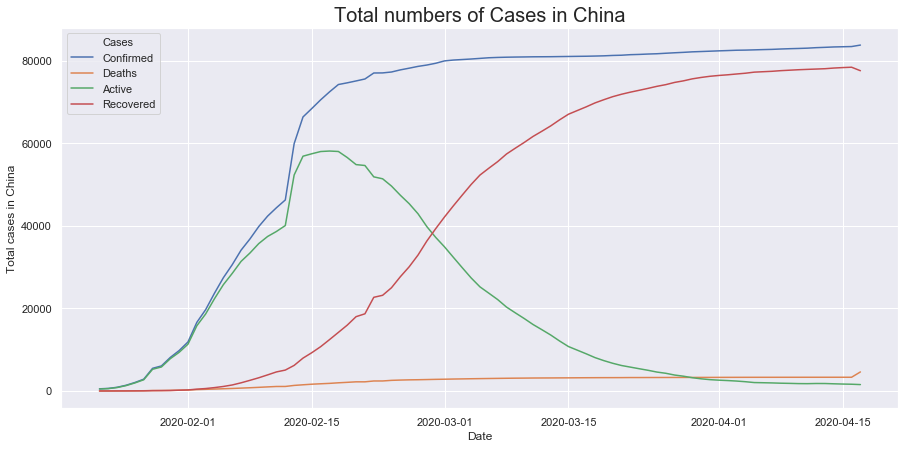

In [38]:
china_sum = complete_data.loc[complete_data['Country_Region']=="China"].groupby('Date')['Date', 'Confirmed','Deaths','Active','Recovered'].sum().reset_index()

china_sum = pd.melt(china_sum, id_vars=['Date'], value_vars=['Confirmed','Deaths','Active','Recovered'])

china_sum = china_sum.rename(columns={"value": "total", "variable": "Cases"})

sns.lineplot(data=china_sum, x="Date", y="total", hue="Cases")

plt.ylabel("Total cases in China")

plt.title("Total numbers of Cases in China",fontsize=20)


### Italy

#### We can see the total number of active casses in China has gone down in mid-Feb, so the spike that we saw earlier has to be from other regions.

Text(0.5, 1.0, 'Total numbers of Cases in Italy')

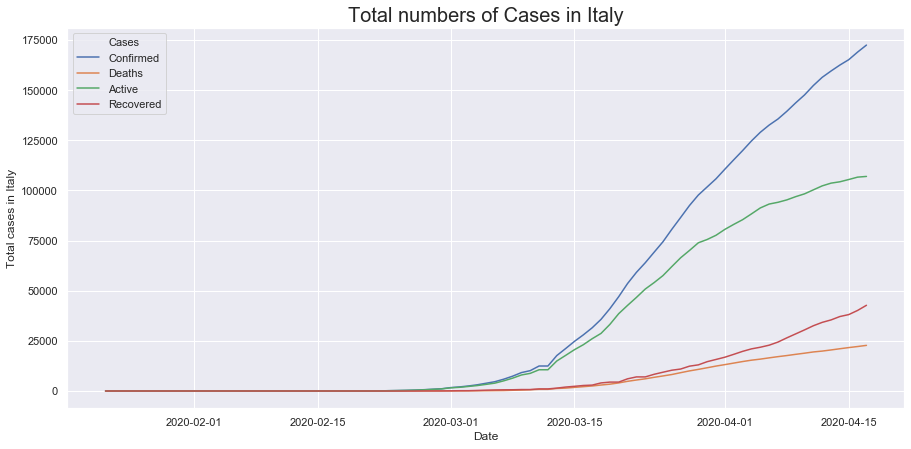

In [39]:
italy_sum = complete_data.loc[complete_data['Country_Region']=="Italy"].groupby('Date')['Date', 'Confirmed','Deaths','Active','Recovered'].sum().reset_index()

italy_sum = pd.melt(italy_sum, id_vars=['Date'], value_vars=['Confirmed','Deaths','Active','Recovered'])

italy_sum = italy_sum.rename(columns={"value": "total", "variable": "Cases"})

sns.lineplot(data=italy_sum, x="Date", y="total", hue="Cases")

plt.ylabel("Total cases in Italy")

plt.title("Total numbers of Cases in Italy",fontsize=20)


### Spain

Text(0.5, 1.0, 'Total numbers of Cases in Spain')

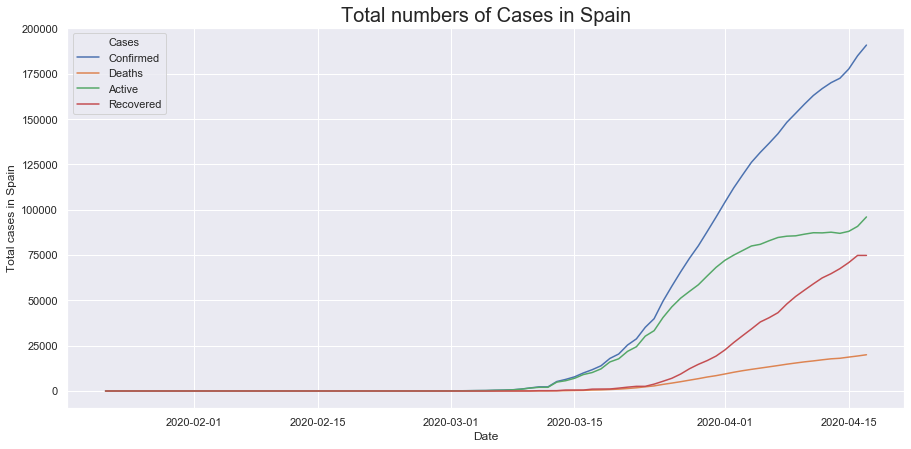

In [40]:
spain_sum = complete_data.loc[complete_data['Country_Region']=="Spain"].groupby('Date')['Date', 'Confirmed','Deaths','Active','Recovered'].sum().reset_index()

spain_sum = pd.melt(spain_sum, id_vars=['Date'], value_vars=['Confirmed','Deaths','Active','Recovered'])

spain_sum = spain_sum.rename(columns={"value": "total", "variable": "Cases"})

sns.lineplot(data=spain_sum, x="Date", y="total", hue="Cases")

plt.ylabel("Total cases in Spain")

plt.title("Total numbers of Cases in Spain",fontsize=20)


### US

Text(0.5, 1.0, 'Total numbers of Cases in the U.S.')

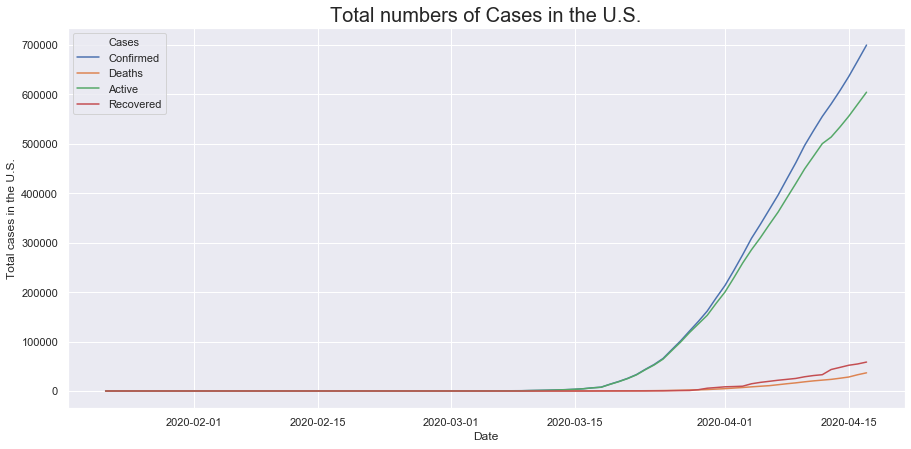

In [41]:
us_sum = complete_data.loc[complete_data['Country_Region']=="US"].groupby('Date')['Date', 'Confirmed','Deaths','Active','Recovered'].sum().reset_index()

us_sum = pd.melt(us_sum, id_vars=['Date'], value_vars=['Confirmed','Deaths','Active','Recovered'])

us_sum = us_sum.rename(columns={"value": "total", "variable": "Cases"})

sns.lineplot(data=us_sum, x="Date", y="total", hue="Cases")

plt.ylabel("Total cases in the U.S.")

plt.title("Total numbers of Cases in the U.S.",fontsize=20)


#### The outbreak started in Italy in mid-Feb and in the U.S. from beginning of March.

### Other countries

Text(0.5, 1.0, 'Total numbers of Cases in other countries')

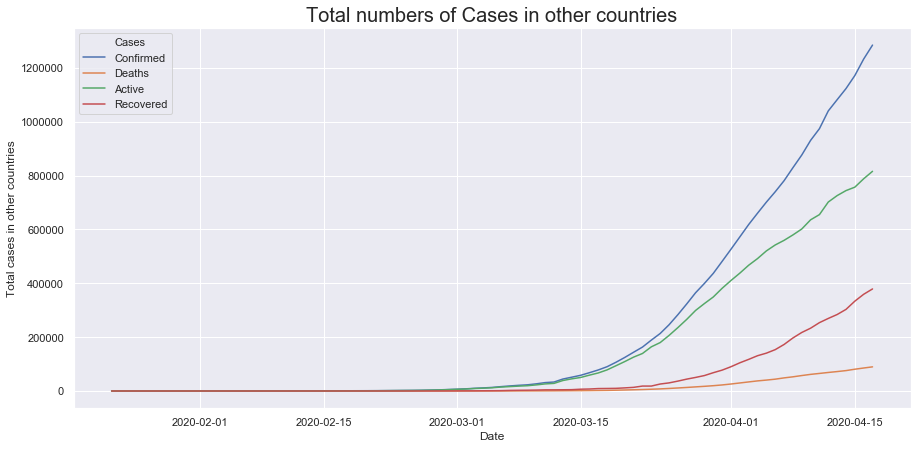

In [42]:
#Other countries

other_sum = complete_data.loc[complete_data['Country_Region'].isin(["Italy","China","US"])==False]

other_sum = other_sum.groupby('Date')['Date', 'Confirmed','Deaths','Active','Recovered'].sum().reset_index()

other_sum = pd.melt(other_sum, id_vars=['Date'], value_vars=['Confirmed','Deaths','Active','Recovered'])

other_sum = other_sum.rename(columns={"value": "total", "variable": "Cases"})

sns.lineplot(data=other_sum, x="Date", y="total", hue="Cases")

plt.ylabel("Total cases in other countries")

plt.title("Total numbers of Cases in other countries",fontsize=20)


#### The rest of the World combined is also seeing a steady increase in confirmed cases over time.

### Which country has the first infected case?

<a id='continents'></a>


### Let's look at all Europe countries


In [43]:
# Countries that are in Europe

europe = ['Austria','Italy','Belgium','Latvia','Bulgaria','Lithuania','Croatia','Luxembourg',
          'Cyprus','Malta','Czechia','Netherlands','Denmark','Poland','Estonia','Portugal',
          'Finland','Romania','France','Slovakia','Germany','Slovenia','Greece','Spain',
          'Hungary','Sweden','Ireland','Switzerland','United Kingdom']

europe_sum = complete_data.loc[complete_data['Country_Region'].isin(europe)==True]

europe_sum.loc[europe_sum['Confirmed']>0].sort_values('Date').head(1)


,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
640,,France,46.2276,2.2137,2020-01-24,2,0,0,2


#### It's clear that the outbreak began in **France**.

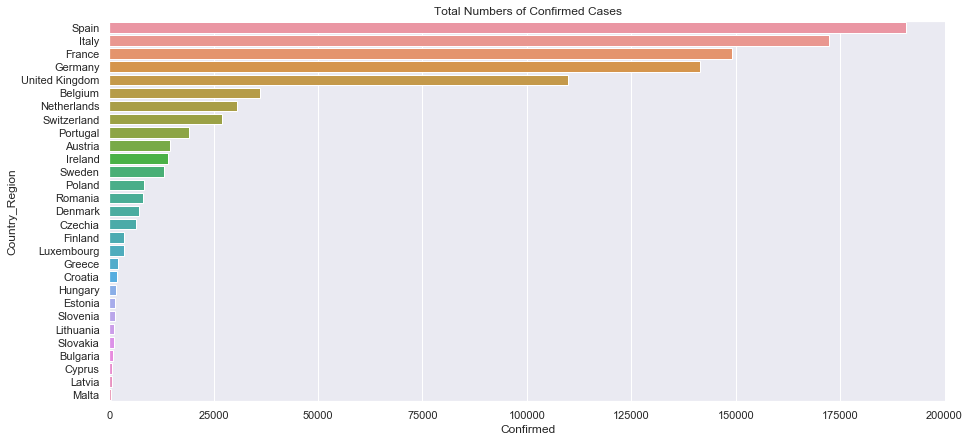

In [44]:
#Plot out the total cases by each country
europe_sum = europe_sum.loc[complete_data['Date']==complete_data['Date'].max()].groupby(
    'Country_Region')['Country_Region', 'Confirmed'].sum().reset_index().sort_values('Confirmed',ascending=False)

plot5 = sns.barplot(x="Confirmed",y="Country_Region", data=europe_sum)

plt.title("Total Numbers of Confirmed Cases")

for p in plot1.patches:
    width = p.get_width()
    plot1.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")


### Let's look at the top 10 Europe countries with outbreaks in a timeline

#### Confirmed Cases

Text(0.5, 1.0, 'Total numbers of Cases in Europe countries')

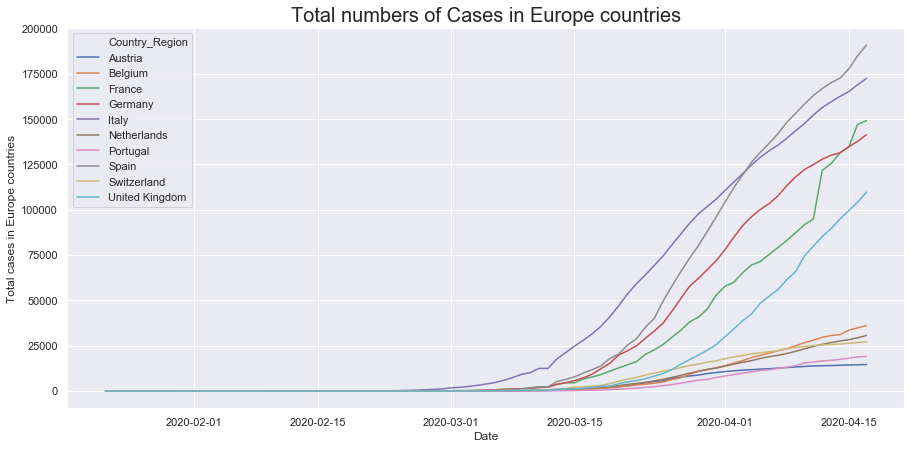

In [45]:
top10_eu_sum = complete_data.loc[complete_data['Country_Region'].isin(['Italy','Spain','Germany',
                                                                      'France','United Kingdom',
                                                                      'Switzerland','Netherlands','Austria',
                                                                      'Belgium','Portugal'])==True]

top10_eu_sum1 = top10_eu_sum.groupby(['Country_Region','Date'])['Confirmed'].sum().reset_index()

sns.lineplot(data=top10_eu_sum1, x="Date", y="Confirmed", hue="Country_Region")

plt.ylabel("Total cases in Europe countries")

plt.title("Total numbers of Cases in Europe countries",fontsize=20)


#### Fatality Rate

Text(0.5, 1.0, 'Fatality Rate  in Europe countries')

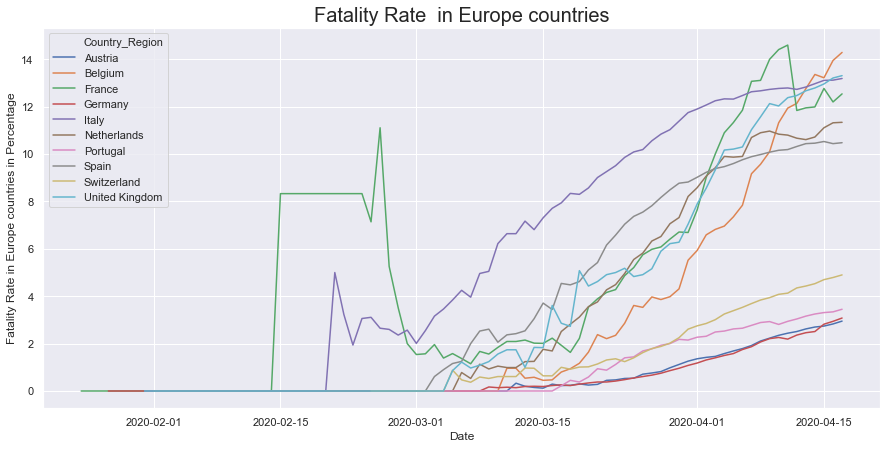

In [46]:
top10_eu_sum2 = top10_eu_sum.groupby(['Country_Region','Date'])['Confirmed','Deaths'].sum().reset_index()

top10_eu_sum2['Fatal_Rate'] = round((top10_eu_sum2['Deaths']/top10_eu_sum2['Confirmed'])*100,2)

sns.lineplot(data=top10_eu_sum2, x="Date", y="Fatal_Rate", hue="Country_Region")

plt.ylabel("Fatality Rate in Europe countries in Percentage")

plt.title("Fatality Rate  in Europe countries",fontsize=20)

#### Recovery Rate

Text(0.5, 1.0, 'Recovery Rate  in Europe countries')

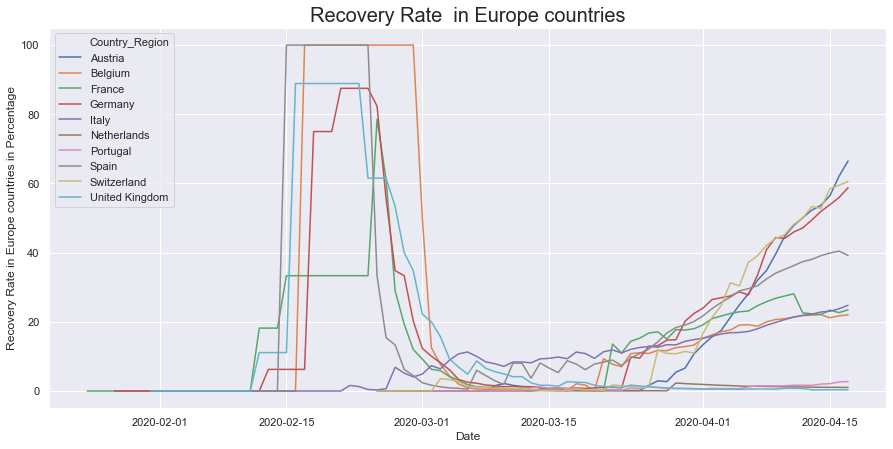

In [47]:
top10_eu_sum3 = top10_eu_sum.groupby(['Country_Region','Date'])['Confirmed','Recovered'].sum().reset_index()

top10_eu_sum3['Recover_Rate'] = round((top10_eu_sum3['Recovered']/top10_eu_sum3['Confirmed'])*100,2)

sns.lineplot(data=top10_eu_sum3, x="Date", y="Recover_Rate", hue="Country_Region")

plt.ylabel("Recovery Rate in Europe countries in Percentage")

plt.title("Recovery Rate  in Europe countries",fontsize=20)

As the number of infected cases rise, the number of recovery cases began to drop, this means that we need to supress the cases below the healthcare capacity so that we can prepare, stock enough supplies and have sufficient numbers of healthcare workers to serve the patients.

### Let's look at the North America countries and the U.S.

In [48]:
north_america = ['Antigua and Barbuda','Bahamas','Barbados','Belize','Canada','Costa Rica','Cuba','El Salvador',
                 'Grenada','Guatemala','Haití','Honduras','Jamaica','Mexico','Nicaragua','Panama',
                 'Saint Kitts and Nevis','Saint Lucia','Saint Vincent and the Grenadines','Trinidad and Tobago','US']

na_region_sum = complete_data.loc[complete_data['Country_Region'].isin(north_america)==True]

na_region_sum.loc[na_region_sum['Confirmed']>0].sort_values('Date').head(1)


,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
225,,US,37.0902,-95.7129,2020-01-22,1,0,0,1


#### The first case began from the **U.S.**

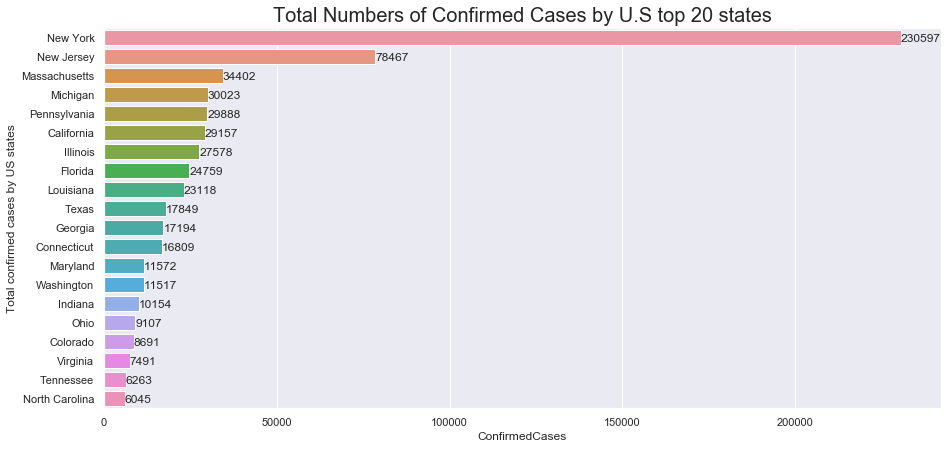

In [49]:
# plot the total of US
us_region_sum = train.loc[train['Country_Region'] == "US"]

us_region_sum1 = us_region_sum.loc[us_region_sum['Date']==train['Date'].max()].groupby(
    ['Province_State'])['ConfirmedCases'].sum().reset_index().sort_values('ConfirmedCases',ascending=False).head(20)

plot6 = sns.barplot(x="ConfirmedCases",y="Province_State", data=us_region_sum1)

plt.ylabel("Total confirmed cases by US states")

plt.title("Total Numbers of Confirmed Cases by U.S top 20 states",fontsize=20)

for p in plot6.patches:
    width = p.get_width()
    plot6.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")
    




Text(0.5, 1.0, 'Total numbers of Confirmed Cases in by top 10 states')

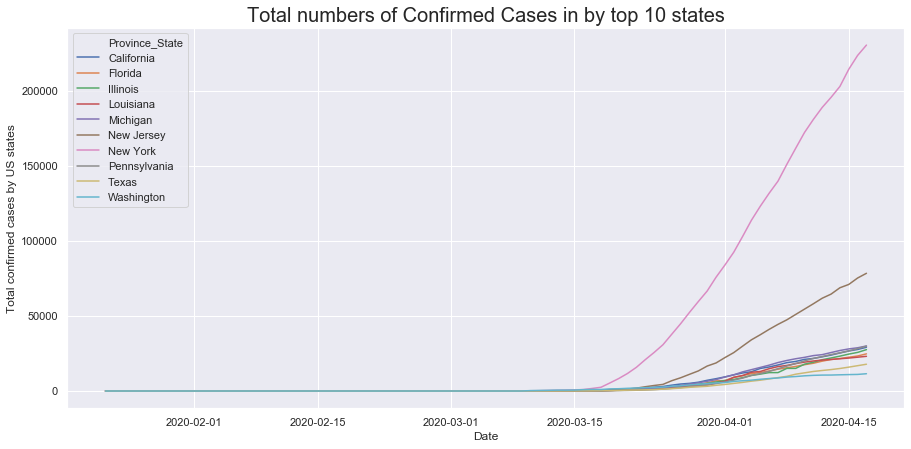

In [50]:
top10_us_sum = us_region_sum.loc[us_region_sum['Province_State'].isin(['New York','New Jersey','Washington',
                                                                      'California','Michigan',
                                                                      'Illinois','Florida','Louisiana',
                                                                      'Pennsylvania','Texas'])==True]


top10_us_sum1 = top10_us_sum.groupby(
    ['Province_State','Date'])['ConfirmedCases'].sum().reset_index()
    
sns.lineplot(data=top10_us_sum1, x="Date", y="ConfirmedCases", hue="Province_State")

plt.ylabel("Total confirmed cases by US states")

plt.title("Total numbers of Confirmed Cases in by top 10 states",fontsize=20)


#### We can see that the outbreak started from Washington state on March 9th and the strike leveled up from there.

#### Fatality Rate

Text(0.5, 1.0, 'Fatality Rate by top 10 states')

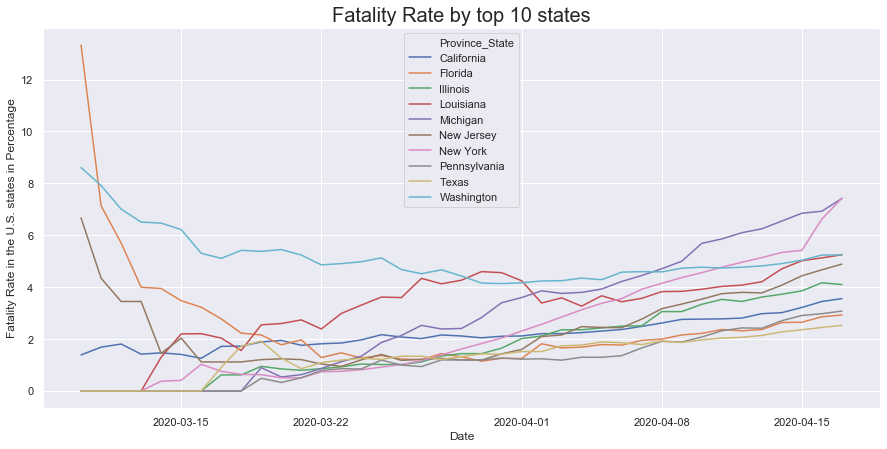

In [51]:
top10_us_sum2 = top10_us_sum.groupby(['Province_State','Date'])['ConfirmedCases','Fatalities'].sum().reset_index()

top10_us_sum2['Fatal_Rate'] = round((top10_us_sum2['Fatalities']/top10_us_sum2['ConfirmedCases'])*100,2)

sns.lineplot(data=top10_us_sum2, x="Date", y="Fatal_Rate", hue="Province_State")

plt.ylabel("Fatality Rate in the U.S. states in Percentage")

plt.title("Fatality Rate by top 10 states",fontsize=20)

#### On a positive side, even though New York is the most contagious state, the fatality rate is still considered small compared to Washington and Lousiana states.

#### Recovery Rate

Text(0.5, 1.0, 'Recovery Rate by top 10 states')

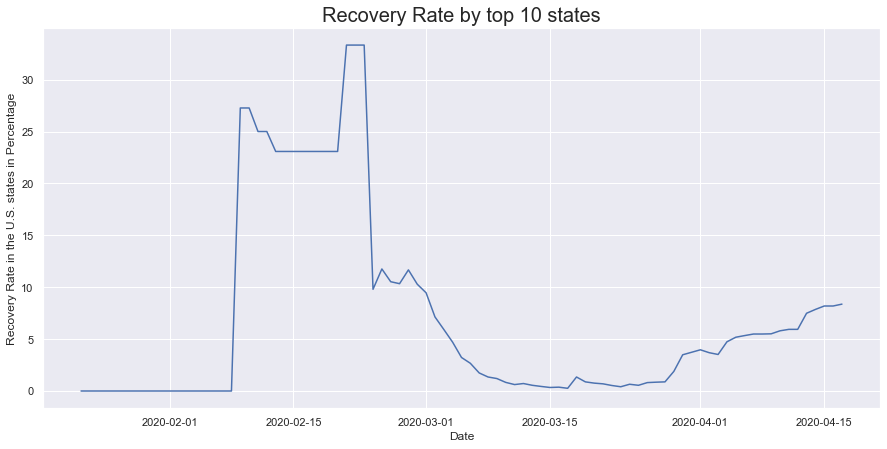

In [52]:
top10_us_sum3 = complete_data.loc[complete_data['Country_Region']=='US'].groupby(
    'Date')['Confirmed','Recovered'].sum().reset_index()

top10_us_sum3['Recover_Rate'] = round((top10_us_sum3['Recovered']/top10_us_sum3['Confirmed'])*100,2)

sns.lineplot(data=top10_us_sum3, x="Date", y="Recover_Rate")

plt.ylabel("Recovery Rate in the U.S. states in Percentage")

plt.title("Recovery Rate by top 10 states",fontsize=20)

In [53]:
round(top10_us_sum3['Recover_Rate'].mean(),2)

7.05

#### Similar to the cases we saw earlier in European countries, as the number of infected cases rise, the number of recovery cases began to drop. This means that we need to supress the cases below the healthcare capacity so that we can prepare, stock enough supplies and have sufficient numbers of healthcare workers to serve the patients.

### Let's look into Asia countries

####  In Asia, China is the first case of the outbreak

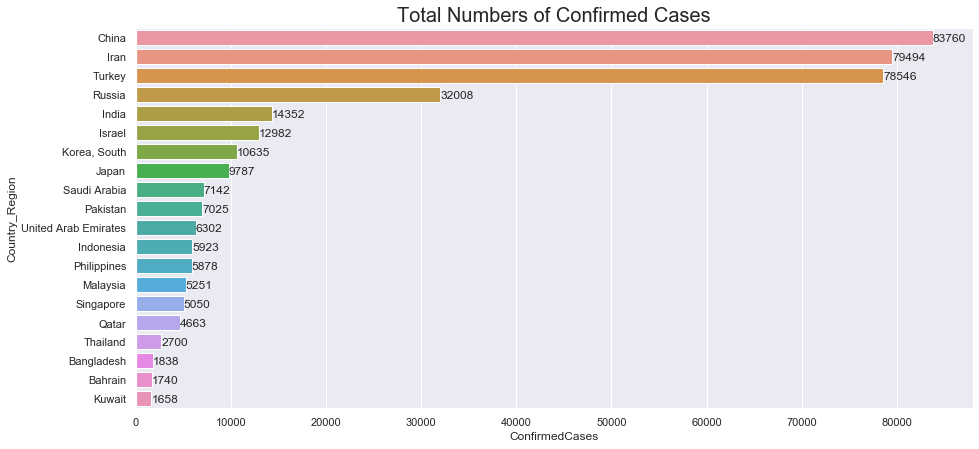

In [54]:

asia = ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei', 
        'Cambodia', 'China', 'Timor-Leste', 'Georgia', 'India', 'Indonesia', 'Iran', 'Iraq', 
        'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Lebanon', 
        'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'Oman', 'Pakistan', 
        'Philippines', 'Qatar', 'Russia', 'Saudi Arabia', 'Singapore', 'Korea, South', 'Sri Lanka', 
        'Syria', 'Taiwan', 'Tajikistan', 'Thailand', 'Turkey', 'Turkmenistan', 'United Arab Emirates', 
        'Uzbekistan', 'Vietnam', 'Yemen']

asia_sum = train.loc[train['Country_Region'].isin(asia)==True]

asia_sum1 = asia_sum.loc[asia_sum['Date']==train['Date'].max()].groupby(
    'Country_Region')['Country_Region', 'ConfirmedCases'].sum().reset_index().sort_values(
    'ConfirmedCases',ascending=False).head(20)

plot7 = sns.barplot(x="ConfirmedCases",y="Country_Region", data=asia_sum1)

plt.title("Total Numbers of Confirmed Cases",fontsize=20)

for p in plot7.patches:
    width = p.get_width()
    plot7.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")




Text(0.5, 1.0, 'Total numbers of Confirmed Cases in by Asia countries - excluding China')

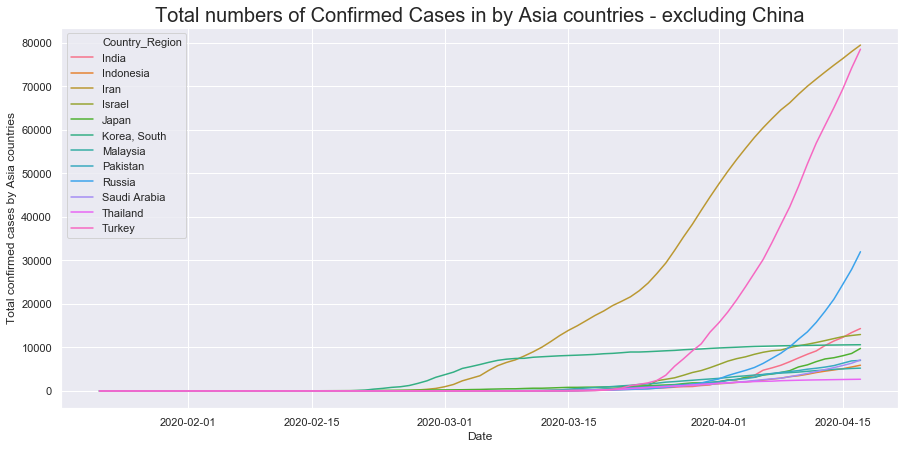

In [55]:
#Let's plot them in a timeline but excluding China

top10_asia_sum1 = asia_sum.loc[asia_sum['Country_Region'].isin(['Korea, South','Iran','Turkey','Israel',
                                                               'Malaysia','Japan','Pakistan',
                                                               'Thailand','Saudi Arabia','Indonesia',
                                                              'Russia','India'])==True]


top10_asia_sum1 = top10_asia_sum1.groupby(
    ['Country_Region','Date'])['ConfirmedCases'].sum().reset_index()
    
sns.lineplot(data=top10_asia_sum1, x="Date", y="ConfirmedCases", hue="Country_Region")

plt.ylabel("Total confirmed cases by Asia countries")

plt.title("Total numbers of Confirmed Cases in by Asia countries - excluding China",fontsize=20)


#### Even though Korea has flattened the curve, Iran continues to be the rise.

Text(0.5, 1.0, 'Total numbers of Confirmed Cases in by Asia countries - excluding China, Korea and Iran')

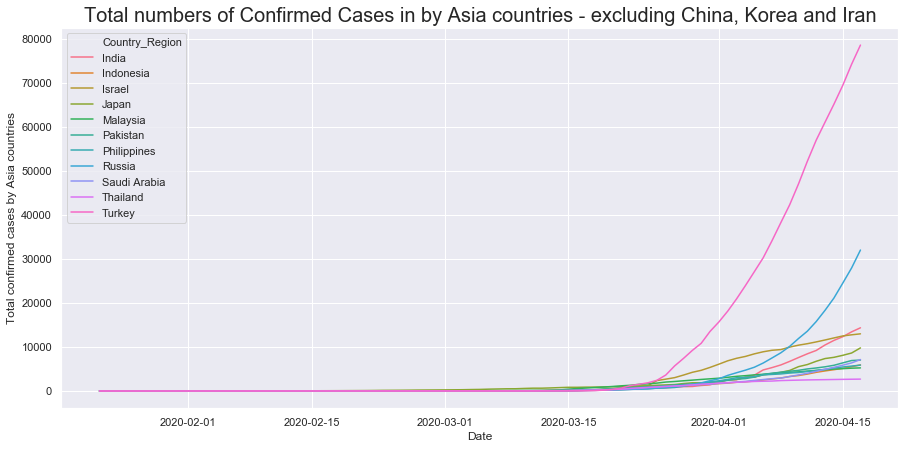

In [56]:
#excluding Iran, Korea and China

top10_asia_sum2 = asia_sum.loc[asia_sum['Country_Region'].isin(['Turkey','Israel',
                                                               'Malaysia','Japan','Pakistan',
                                                               'Thailand','Saudi Arabia','Indonesia',
                                                              'Russia','India','Philippines'])==True]


top10_asia_sum2 = top10_asia_sum2.groupby(
    ['Country_Region','Date'])['ConfirmedCases'].sum().reset_index()
    
sns.lineplot(data=top10_asia_sum2, x="Date", y="ConfirmedCases", hue="Country_Region")

plt.ylabel("Total confirmed cases by Asia countries")

plt.title("Total numbers of Confirmed Cases in by Asia countries - excluding China, Korea and Iran",fontsize=20)

#### Fatality Rate

Text(0.5, 1.0, 'Fatality Rate in Asia countries - excluding China and Iran')

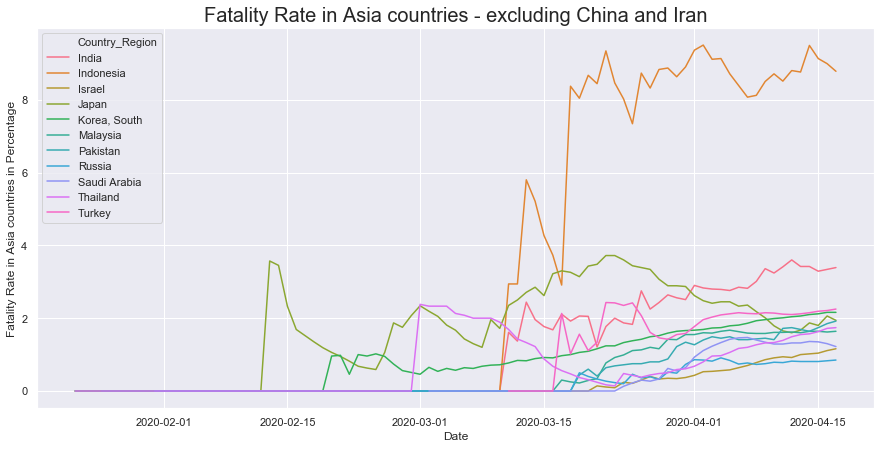

In [57]:

top10_asia_sum3 = asia_sum.loc[asia_sum['Country_Region'].isin(['Korea, South','Turkey','Israel',
                                                               'Malaysia','Japan','Pakistan',
                                                               'Thailand','Saudi Arabia','Indonesia',
                                                              'Russia','India'])==True]


top10_asia_sum3 = top10_asia_sum3.groupby(
    ['Country_Region','Date'])['ConfirmedCases','Fatalities'].sum().reset_index()

top10_asia_sum3['Fatal_Rate'] = round((top10_asia_sum3['Fatalities']/top10_asia_sum3['ConfirmedCases'])*100,2)
    
sns.lineplot(data=top10_asia_sum3, x="Date", y="Fatal_Rate", hue="Country_Region")

plt.ylabel("Fatality Rate in Asia countries in Percentage")

plt.title("Fatality Rate in Asia countries - excluding China and Iran",fontsize=20)

#### Recovery Rate

Text(0.5, 1.0, 'Recovery Rate  in Europe countries')

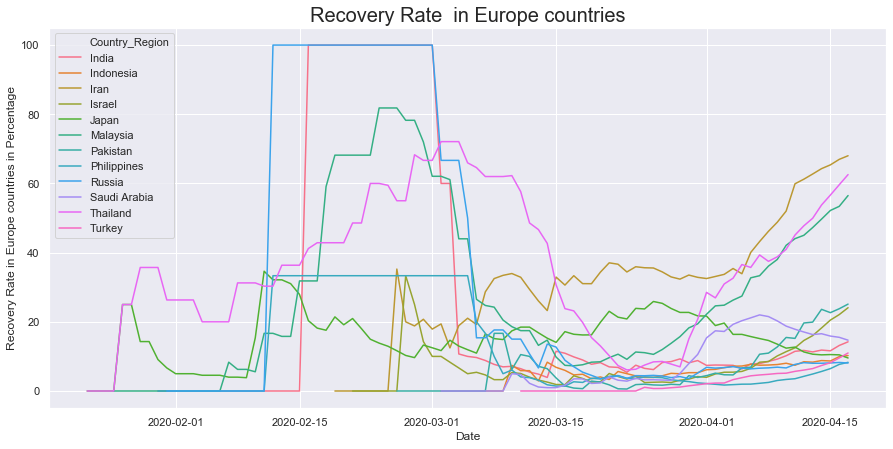

In [58]:

top10_asia_sum4 = complete_data.loc[complete_data['Country_Region'].isin(['Korea, South','Iran','Turkey','Israel',
                                                               'Malaysia','Japan','Pakistan',
                                                               'Thailand','Saudi Arabia','Indonesia',
                                                              'Russia','India','Philippines'])==True]

top10_asia_sum4 = top10_asia_sum4.groupby(['Country_Region','Date'])['Confirmed','Recovered'].sum().reset_index()

top10_asia_sum4['Recover_Rate'] = round((top10_asia_sum4['Recovered']/top10_asia_sum4['Confirmed'])*100,2)

sns.lineplot(data=top10_asia_sum4, x="Date", y="Recover_Rate", hue="Country_Region")

plt.ylabel("Recovery Rate in Europe countries in Percentage")

plt.title("Recovery Rate  in Europe countries",fontsize=20)

While Iran, Japan and Malaysia are having the good sign of recovery, Thailand's recovery rate is decreasing.

## Weather

<a id='temp'></a>

#### In this section, I will break down by temperature (in Fahranheit), wind speed, humidity and sun hours to analyze and find their impact on the transmission rate accordingly.



### Temperature by Country over time

In [59]:

temp_covid = weather_data.groupby(['Date', 'Country_Region'])['temp'].mean().reset_index()
temp_covid['Date'] = pd.to_datetime(temp_covid['Date'])
map_covid['Date'] = pd.to_datetime(map_covid['Date'])

#merge with the confirmed cases for size changing
temp_covid = pd.merge(temp_covid, map_covid, on=['Date','Country_Region'],how='left')

temp_covid['Date'] = temp_covid['Date'].dt.strftime('%m/%d/%Y')

fig_temp = px.scatter_geo(temp_covid, locations="Country_Region", locationmode='country names', 
                     color="temp", size='size', hover_name="Country_Region", 
                     range_color=[1,100],
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Temperature according to the number of Confirmed Cases Around the Globe', 
                     color_continuous_scale="tealrose")
fig_temp.show()


- **Note**: The color represents the temperature levels and the size of the circle stands for the number of Covid-19 Cases

#### This looks like the outbreak mostly widespreads in the region where the average temperature in Fahranheit is around 40 to 60 degrees.

### Windspeed by Country over time

In [60]:
wdsp_covid = weather_data.groupby(['Date', 'Country_Region'])['wdsp'].max().reset_index()
wdsp_covid['Date'] = pd.to_datetime(wdsp_covid['Date'])

#merge with the confirmed cases for size changing
wdsp_covid = pd.merge(wdsp_covid, map_covid, on=['Date','Country_Region'],how='left')

wdsp_covid['Date'] = wdsp_covid['Date'].dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(wdsp_covid, locations="Country_Region", locationmode='country names', 
                     color="wdsp", size='size', hover_name="Country_Region", 
                     range_color=[1,100],
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Windspeed according to the number of Confirmed Cases Around the Globe', 
                     color_continuous_scale="tealrose")
fig.show()


- **Note**: The color represents the strength of the wind and the size of the circle represents the number of Covid-19 Cases


#### According to the graph, the outbreak mostly widespreads in the region where the windspeed is around 40-50 miles/hour 

### Precipitation by Country over time

In [61]:
prcp_covid = weather_data.groupby(['Date', 'Country_Region'])['prcp'].max().reset_index()
prcp_covid['Date'] = pd.to_datetime(prcp_covid['Date'])

#merge with the confirmed cases for size changing
prcp_covid = pd.merge(prcp_covid, map_covid, on=['Date','Country_Region'],how='left')

prcp_covid['Date'] = prcp_covid['Date'].dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(prcp_covid, locations="Country_Region", locationmode='country names', 
                     color="prcp", size='size', hover_name="Country_Region", 
                     range_color=[1,100],
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Precipitation according to the number of Confirmed Cases Around the Globe', 
                     color_continuous_scale="tealrose")
fig.show()


- **Note**: The color represents the volume of precipitation and the size of the circle represents the number of Covid-19 Cases


#### According to the graph, the outbreak does not differ much by precipitation.


### Humidity by Country over time

In [62]:
humid_covid = weather_addition.groupby(['Date', 'Country_Region'])['humidity'].mean().reset_index()
humid_covid['Date'] = pd.to_datetime(humid_covid['Date'])

#merge with the confirmed cases for size changing
humid_covid = pd.merge(humid_covid, map_covid, on=['Date','Country_Region'],how='left')
humid_covid = humid_covid.dropna()

humid_covid['Date'] = humid_covid['Date'].dt.strftime('%m/%d/%Y')

fig_humid = px.scatter_geo(humid_covid, locations="Country_Region", locationmode='country names', 
                     color="humidity", size='size', hover_name="Country_Region", 
                     range_color=[1,100],
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Humidity according to the number of Confirmed Cases Around the Globe', 
                     color_continuous_scale="tealrose")
fig_humid.show()


In [63]:
#pio.write_html(fig, file="COVID-19-humidity-Confirmed-Cases-Around-the-Globe.html", auto_open=True)
#py.plot(fig_humid, filename = 'COVID-19: Humidity-Around-the-Globe', auto_open=True)



- **Note**: The color represents the humidity level and the size of the circle shows the number of Covid-19 Cases

#### It seems that higher humidity implies higher number of outbreak.

### Sun Hour by Country over time


In [64]:
sun_covid = weather_addition.groupby(['Date', 'Country_Region'])['sunHour'].mean().reset_index()
sun_covid['Date'] = pd.to_datetime(sun_covid['Date'])

#merge with the confirmed cases for size changing
sun_covid = pd.merge(sun_covid, map_covid, on=['Date','Country_Region'],how='left')
sun_covid = sun_covid.dropna()

sun_covid['Date'] = sun_covid['Date'].dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(sun_covid, locations="Country_Region", locationmode='country names', 
                     color="sunHour", size='size', hover_name="Country_Region", 
                     range_color=[1,100],
                     projection="natural earth", animation_frame="Date", 
                     title='COVID-19: Humidity according to the number of Confirmed Cases Around the Globe', 
                     color_continuous_scale="tealrose")
fig.show()


- **Note**: The color represents the hours of the sun and the size of the circle displays the number of Covid-19 Cases

#### The hours of the sun seem to not correlate with the number of outbreak since they are around 20 hours for almost every country.


### Correlation Matrix

In [65]:
#join the dataframe

temp_covid1 = pd.merge(temp_covid, wdsp_covid[['Date','Country_Region','wdsp']], 
                             on=['Date','Country_Region'],how='left')
temp_covid1 = pd.merge(temp_covid1, prcp_covid[['Date','Country_Region','prcp']], 
                             on=['Date','Country_Region'],how='left')
temp_covid1 = pd.merge(temp_covid1, humid_covid[['Date','Country_Region','humidity']], 
                             on=['Date','Country_Region'],how='left')
temp_covid1 = pd.merge(temp_covid1, sun_covid[['Date','Country_Region','sunHour']], 
                             on=['Date','Country_Region'],how='left')

temp_covid1 = temp_covid1.dropna()

temp_covid1.tail()

,Date,Country_Region,temp,ConfirmedCases,size,wdsp,prcp,humidity,sunHour
11032,03/21/2020,Uruguay,80.3,110.0,14.337910,7.1,0.0,50.0,11.6
11033,03/21/2020,Uzbekistan,49.9,43.0,10.817044,10.9,0.0,63.0,6.1
11034,03/21/2020,Venezuela,90.8,70.0,12.519802,11.5,0.0,75.0,8.8
11035,03/21/2020,Vietnam,81.1,94.0,13.677490,5.5,0.0,81.0,8.9
11038,03/21/2020,Zambia,71.3,2.0,4.309005,7.1,0.0,85.0,7.4


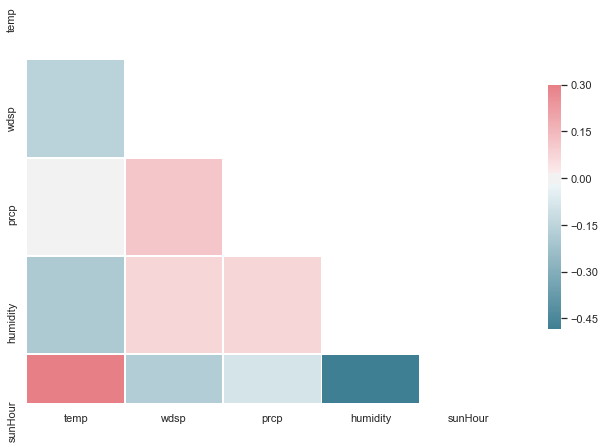

In [66]:
temp_covid2 = temp_covid1[['temp','wdsp','prcp','humidity','sunHour']]

corr = temp_covid2.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

sns.set(style="white")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})



Sun hour have high correlation with temperature (positive) and humidity (negative). Therefore, we will not include sunHour in the linear regression model.

### Linear Regression Model

In [67]:
#construct the Multilinear regression model
X =  temp_covid1[['temp','wdsp','humidity']]
y = temp_covid1['ConfirmedCases']

# Note the difference in argument order
model = sm.OLS(y, X).fit()

#model summary
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:         ConfirmedCases   R-squared (uncentered):                   0.032
Model:                            OLS   Adj. R-squared (uncentered):              0.032
Method:                 Least Squares   F-statistic:                              90.14
Date:                Sun, 19 Apr 2020   Prob (F-statistic):                    2.24e-57
Time:                        15:32:45   Log-Likelihood:                         -81437.
No. Observations:                8100   AIC:                                  1.629e+05
Df Residuals:                    8097   BIC:                                  1.629e+05
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
temp           6.5731      2.233      2.943      0.003       2.195      10.951
wdsp         177.6127     11.921     14.899      0.000     154.245     200.981
humidity     -17.2253      2.290     -7.522      0.000     -21.714     -12.736
==============================================================================
Omnibus:                    13844.599   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          8474961.243
Skew:                          12.106   Prob(JB):                         0.00
Kurtosis:                     159.604   Cond. No.                         17.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### According to the multilinear regression model, temperature, windspeed and humiditiy have statistically significant impact on the number of Covid-19 transmissions overall.

#### Particular,
- When temperature increase by 1 degree, the number of infected cases will decrease approximately 7 cases. 
- Similarly, when windspeed increase by 1 mile/hour, the number of confirmed cases will increase by 178.
- Finally, if the humidity level goes up by 1 unit, there will be nearly a decrease in 17 Covid cases.

#### China

In [68]:
china_temp = temp_covid1.loc[temp_covid1['Country_Region']=='China']

#construct the OLS model
X =  china_temp[['temp', 'wdsp', 'humidity']]
y = china_temp['ConfirmedCases']

# Note the difference in argument order
model = sm.OLS(y, X).fit()

#predictions = model.predict(X) # make the predictions by the model

model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:         ConfirmedCases   R-squared (uncentered):                   0.887
Model:                            OLS   Adj. R-squared (uncentered):              0.881
Method:                 Least Squares   F-statistic:                              148.7
Date:                Sun, 19 Apr 2020   Prob (F-statistic):                    6.44e-27
Time:                        15:32:45   Log-Likelihood:                         -683.63
No. Observations:                  60   AIC:                                      1373.
Df Residuals:                      57   BIC:                                      1380.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
temp        2018.8588    211.900      9.527      0.000    1594.537    2443.180
wdsp        -847.0428    679.222     -1.247      0.217   -2207.161     513.075
humidity    -443.4039    165.311     -2.682      0.010    -774.434    -112.374
==============================================================================
Omnibus:                        4.173   Durbin-Watson:                   0.180
Prob(Omnibus):                  0.124   Jarque-Bera (JB):                3.269
Skew:                          -0.446   Prob(JB):                        0.195
Kurtosis:                       2.284   Cond. No.                         15.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Similar to the general pattern, the high humidity level also significantly decrease the number of Covid-19 infected cases. However, for the case in China, the windspeed does not have significant effect on transmission.


#### Italy

In [69]:
italy_temp = temp_covid1.loc[temp_covid1['Country_Region']=='Italy']

#construct the OLS model
X =  italy_temp[['temp', 'wdsp', 'humidity']]
y = italy_temp['ConfirmedCases']

# Note the difference in argument order
model = sm.OLS(y, X).fit()

#predictions = model.predict(X) # make the predictions by the model

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:         ConfirmedCases   R-squared (uncentered):                   0.509
Model:                            OLS   Adj. R-squared (uncentered):              0.483
Method:                 Least Squares   F-statistic:                              19.66
Date:                Sun, 19 Apr 2020   Prob (F-statistic):                    7.12e-09
Time:                        15:32:45   Log-Likelihood:                         -636.83
No. Observations:                  60   AIC:                                      1280.
Df Residuals:                      57   BIC:                                      1286.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
temp        1013.9301    162.065      6.256      0.000     689.400    1338.460
wdsp        -210.6405    415.692     -0.507      0.614   -1043.050     621.769
humidity    -636.2547    119.012     -5.346      0.000    -874.572    -397.937
==============================================================================
Omnibus:                       13.447   Durbin-Watson:                   0.329
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               14.645
Skew:                           1.018   Prob(JB):                     0.000660
Kurtosis:                       4.310   Cond. No.                         26.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Same with China, given everything constant, the high level of humidity significantly impact on the decrease of infected cases.

#### Spain

In [70]:
spain_temp = temp_covid1.loc[temp_covid1['Country_Region']=='Spain']

#construct the OLS model
X =  spain_temp[['temp', 'wdsp', 'humidity']]
y = spain_temp['ConfirmedCases']

# Note the difference in argument order
model = sm.OLS(y, X).fit()

#predictions = model.predict(X) # make the predictions by the model

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:         ConfirmedCases   R-squared (uncentered):                   0.335
Model:                            OLS   Adj. R-squared (uncentered):              0.300
Method:                 Least Squares   F-statistic:                              9.552
Date:                Sun, 19 Apr 2020   Prob (F-statistic):                    3.31e-05
Time:                        15:32:45   Log-Likelihood:                         -591.94
No. Observations:                  60   AIC:                                      1190.
Df Residuals:                      57   BIC:                                      1196.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
temp        -152.2179     60.845     -2.502      0.015    -274.057     -30.379
wdsp        1009.8192    245.381      4.115      0.000     518.453    1501.186
humidity      82.5637     42.215      1.956      0.055      -1.970     167.097
==============================================================================
Omnibus:                       44.860   Durbin-Watson:                   0.294
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              158.021
Skew:                           2.173   Prob(JB):                     4.86e-35
Kurtosis:                       9.658   Cond. No.                         36.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Spain is different from other countries' pattern that we observe before. The number of infected cases in Spain are negatively impacted asw windspeed and humidity increase. 

#### While temperature increase, it significantly decreases the number of infected cases in Spain.


#### US

In [71]:

us_temp = temp_covid1.loc[temp_covid1['Country_Region']=='US']

#construct the OLS model
X =  us_temp[['temp','wdsp', 'humidity']]
y = us_temp['ConfirmedCases']

# Note the difference in argument order
model = sm.OLS(y, X).fit()

#predictions = model.predict(X) # make the predictions by the model

model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:         ConfirmedCases   R-squared (uncentered):                   0.275
Model:                            OLS   Adj. R-squared (uncentered):              0.237
Method:                 Least Squares   F-statistic:                              7.201
Date:                Sun, 19 Apr 2020   Prob (F-statistic):                    0.000351
Time:                        15:32:45   Log-Likelihood:                         -583.21
No. Observations:                  60   AIC:                                      1172.
Df Residuals:                      57   BIC:                                      1179.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
temp         326.1420     95.941      3.399      0.001     134.023     518.261
wdsp        -535.2054    167.860     -3.188      0.002    -871.338    -199.072
humidity     -41.1765     39.787     -1.035      0.305    -120.848      38.495
==============================================================================
Omnibus:                       72.365   Durbin-Watson:                   0.279
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              586.399
Skew:                           3.491   Prob(JB):                    4.63e-128
Kurtosis:                      16.631   Cond. No.                         29.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### In contrast with China and Italy, strong wind speed shows statistically significant impact on the confirmed cases. In essence, the number of cases decrease by nearly 535 people when the wind speed increases by 1 mile/hour. High humidity also decreases the number of transmission by 41 cases.

#### However, the high temperature in the US seems to make it worse for covid-19 transmission.

#### This is only approximate estimate of the linear coefficients, since the U.S. has 50 states and the weather conditions may vary for different areas.

### Demographic Data

<a id='demo'></a>


In [72]:
#Combine US states to only US 
demo_data1 = demo_data.replace(['Alabama', 'Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware',
             'Florida','Georgia','Hawaii','Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana',
             'Maine','Maryland','Massachusetts','Michigan','Minnesota','Mississippi','Missouri','Montana','Nebraska',
             'Nevada','New Hampshire','New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota',
             'Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina','South Dakota', 'Tennessee',
             'Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming','San Franciso',
             'GeorgiaUS', 'Atlanta', 'Honolulu', 'Washington DC'], 'US')

demo_data1.head()


,region,country,alpha3code,alpha2code,pop,tests,testpop,density,medianage,urbanpop,...,newdeaths2,newdeaths3,recovered,critical30,critical31,critical1,critical2,critical3,casediv1m,deathdiv1m
0,NaN,Afghanistan,AFG,AF,38928346.0,NaN,NaN,60.0,18.0,25.0,...,NaN,NaN,10,NaN,NaN,NaN,NaN,NaN,7,0.2
1,NaN,Albania,ALB,AL,2877797.0,NaN,NaN,105.0,36.0,63.0,...,1.0,NaN,89,7,8,7,7,7,106,6.0
2,NaN,Algeria,DZA,DZ,43851044.0,NaN,NaN,18.0,29.0,73.0,...,NaN,NaN,61,NaN,NaN,NaN,NaN,NaN,22,2.0
3,NaN,Andorra,AND,AD,77265.0,NaN,NaN,164.0,45.0,88.0,...,1.0,1.0,16,10,10,12,12,12,"5,682",207.0
4,NaN,Antigua and Barbuda,ATG,AG,97929.0,NaN,NaN,223.0,34.0,26.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92,NaN


#### Populations by top 20 countries with COVID19 outbreak

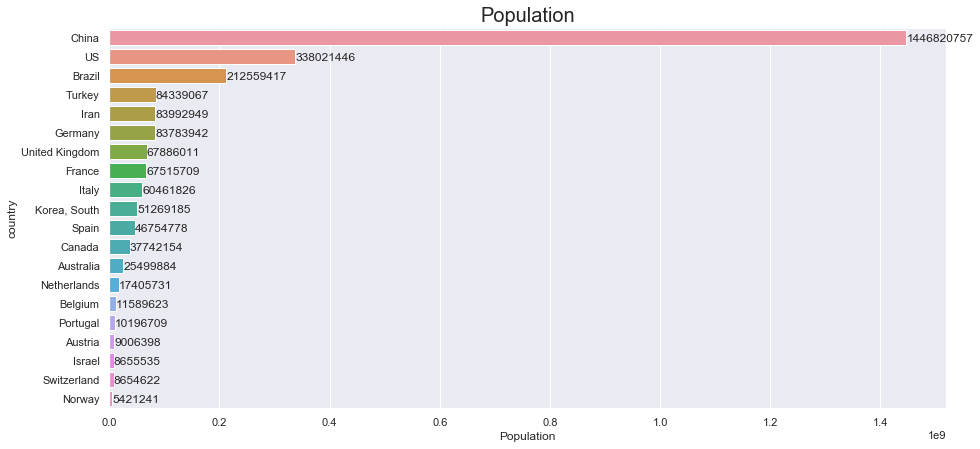

In [73]:

demo_data_pop = demo_data1.groupby(['country'])['country','pop'].sum().reset_index().sort_values('pop',ascending=False)

demo_data_pop = demo_data_pop.loc[demo_data_pop['country'].isin(['US', 'Italy', 'China', 'Spain', 'Germany', 'France', 'Iran',
       'United Kingdom', 'Switzerland', 'Netherlands', 'Belgium',
       'Korea, South', 'Turkey', 'Austria', 'Canada', 'Portugal', 'Norway',
       'Brazil', 'Israel', 'Australia'])==True]

sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
sns.set(rc={'figure.figsize':(15, 7)})

plot_pop=sns.barplot(x="pop",y="country", data=demo_data_pop)

plt.xlabel("Population")

plt.title("Population",fontsize=20)

for p in plot_pop.patches:
    width = p.get_width()
    plot_pop.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")
    

#### Top 20 countries with number of COVID19 tests


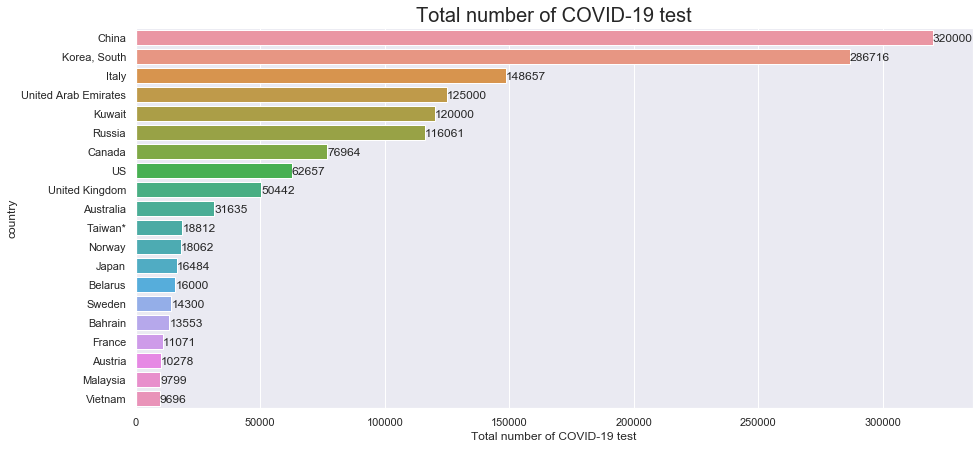

In [74]:

demo_data2 = demo_data1.sort_values('tests',ascending=False).head(20)

plot10 = sns.barplot(x="tests",y="country", data=demo_data2)

plt.xlabel("Total number of COVID-19 test")

plt.title("Total number of COVID-19 test",fontsize=20)

for p in plot10.patches:
    width = p.get_width()
    plot10.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")

#### Beside China, South Korea is the top 2 country that have the highest number of COVID tests per day. Introducing widespread testing and contact tracing before quarantine or 'shelter in place' ban, the country has curb the COVID-19 spread signficantly by widespread testing only within a month.

Further reading: https://www.sciencemag.org/news/2020/03/coronavirus-cases-have-dropped-sharply-south-korea-whats-secret-its-success

#### Top 20 countries with the amount of hospital bed per 1,000 people

Text(0.5, 1.0, 'Amount of hospital bed per 1,000 people')

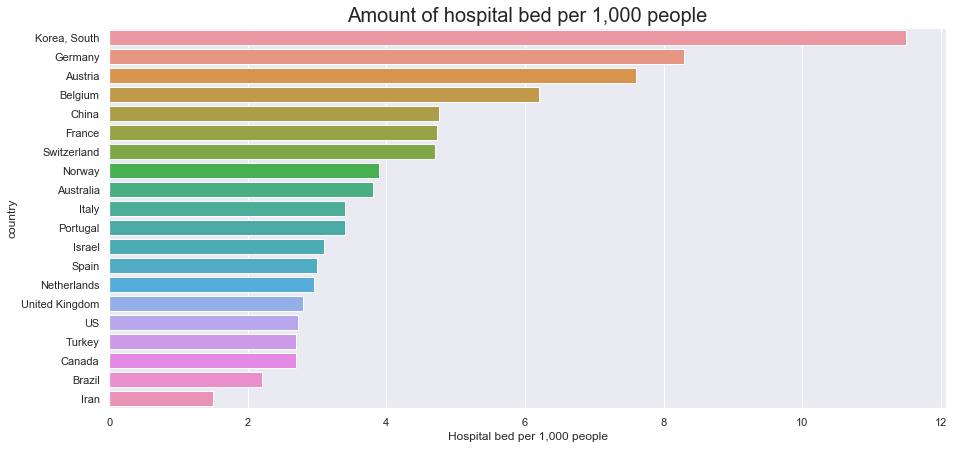

In [75]:

demo_data3 = demo_data1.groupby(['country'])['country',
                                           'hospibed'].mean().reset_index().sort_values('hospibed',ascending=False)

demo_data3 = demo_data3.loc[demo_data3['country'].isin(['US', 'Italy', 'China', 'Spain', 'Germany', 'France', 'Iran',
       'United Kingdom', 'Switzerland', 'Netherlands', 'Belgium',
       'Korea, South', 'Turkey', 'Austria', 'Canada', 'Portugal', 'Norway',
       'Brazil', 'Israel', 'Australia'])==True]

plot11 = sns.barplot(x="hospibed",y="country", data=demo_data3)

plt.xlabel("Hospital bed per 1,000 people")

plt.title("Amount of hospital bed per 1,000 people",fontsize=20)


#### Among the top severe country by Covid-19, South Korea and Germany are among their counterparts to mitigate the death rate. This becomes clear when they are the top 2 countries with amount of ICU beds per 1K patients to effectively support healthcare workers save thousand of patients' lives.

#### Median Age by top 20 countries with COVID19 outbreak

Text(0.5, 1.0, 'Median Age by Country')

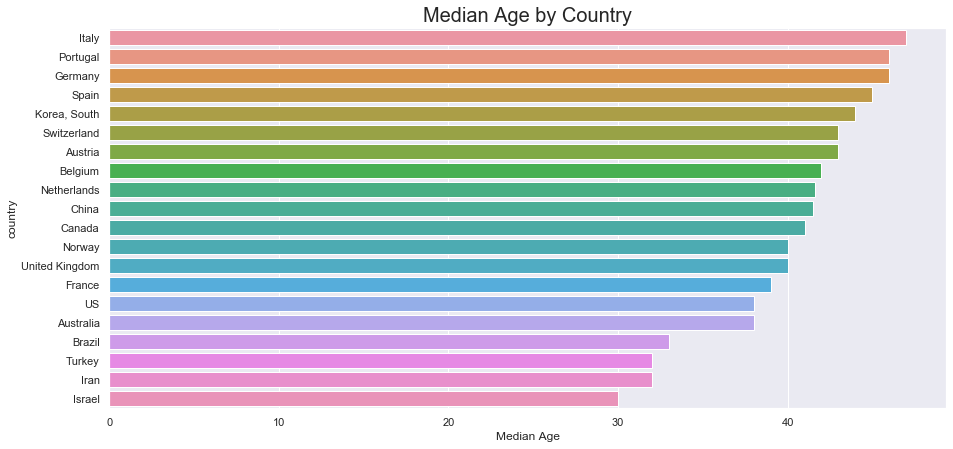

In [76]:
demo_data9 = demo_data1.groupby(['country'])['country',
                                           'medianage'].median().reset_index().sort_values('medianage',ascending=False)

demo_data9 = demo_data9.loc[demo_data9['country'].isin(['US', 'Italy', 'China', 'Spain', 'Germany', 'France', 'Iran',
       'United Kingdom', 'Switzerland', 'Netherlands', 'Belgium',
       'Korea, South', 'Turkey', 'Austria', 'Canada', 'Portugal', 'Norway',
       'Brazil', 'Israel', 'Australia'])==True]

plot13 = sns.barplot(x="medianage",y="country", data=demo_data9)

plt.xlabel("Median Age")

plt.title("Median Age by Country",fontsize=20)

#### People whose ages are above 65 are the most vulnerable towards coronavirus. Italy and Spain are among the top 5 countries with highest median age (above 40 years old) and, at the same time, with the highest number of fatal rate by Covid-19.

#### Density by top 20 countries with COVID19 outbreak

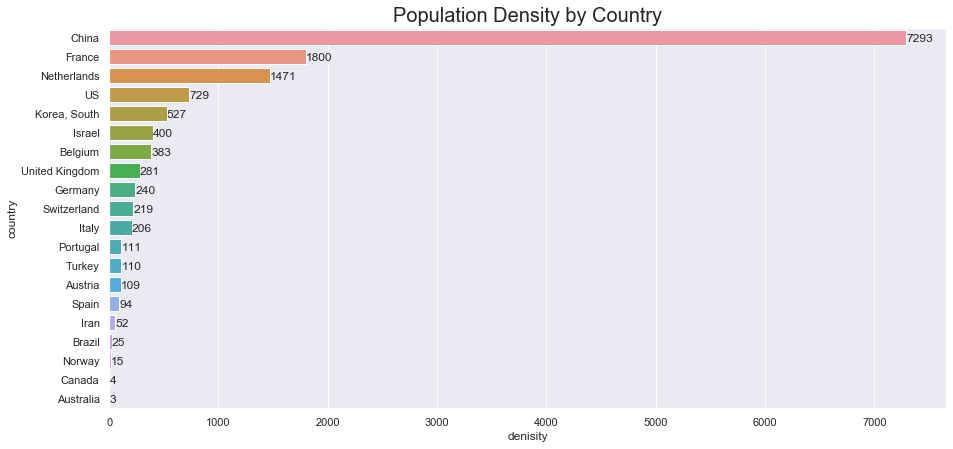

In [77]:
demo_data4 = demo_data1.groupby(['country'])['country',
                                           'density'].sum().reset_index().sort_values('density',ascending=False)

demo_data4 = demo_data4.loc[demo_data4['country'].isin(['US', 'Italy', 'China', 'Spain', 'Germany', 'France', 'Iran',
       'United Kingdom', 'Switzerland', 'Netherlands', 'Belgium',
       'Korea, South', 'Turkey', 'Austria', 'Canada', 'Portugal', 'Norway',
       'Brazil', 'Israel', 'Australia'])==True]

plot12 = sns.barplot(x="density",y="country", data=demo_data4)

plt.xlabel("denisity")

plt.title("Population Density by Country",fontsize=20)

for p in plot12.patches:
    width = p.get_width()
    plot12.text(width + 1.5  ,
            p.get_y()+p.get_height()/2. + 0.2,
            '{:1.0f}'.format(width),
            ha="left")
    

#### Population with higher density can also relate to the transmission rate of Covid-19. As we can see, China, France, US and South Korea are the top country with high population density.


#### Death rate from lung diseases per 100k people by top 20 countries with COVID19 outbreak

Text(0.5, 1.0, 'Death rate from lung diseases per 100k people by Country')

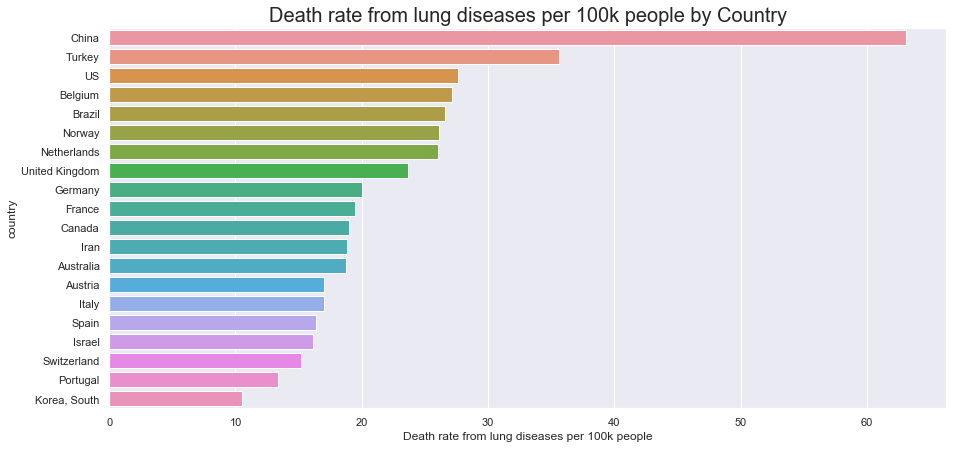

In [78]:
demo_data7 = demo_data1.groupby(['country'])['country',
                                           'lung'].mean().reset_index().sort_values('lung',ascending=False)

demo_data7 = demo_data7.loc[demo_data7['country'].isin(['US', 'Italy', 'China', 'Spain', 'Germany', 'France', 'Iran',
       'United Kingdom', 'Switzerland', 'Netherlands', 'Belgium',
       'Korea, South', 'Turkey', 'Austria', 'Canada', 'Portugal', 'Norway',
       'Brazil', 'Israel', 'Australia'])==True]

plot14 = sns.barplot(x="lung",y="country", data=demo_data7)

plt.xlabel("Death rate from lung diseases per 100k people")

plt.title("Death rate from lung diseases per 100k people by Country",fontsize=20)


#### In later [section](#demo_understand), I will examine the relationship between the death rate by lung diseases with fatal and infected rate by Covid-19.

#### Even though that lung diseases may not directly impact on the number of confirmed and death cases, we need more investigation to understand if it correlate to worsening the health condition with people who are positive with Covid-19 in any possible ways.

Text(0.5, 1.0, 'Number of smokers by Country')

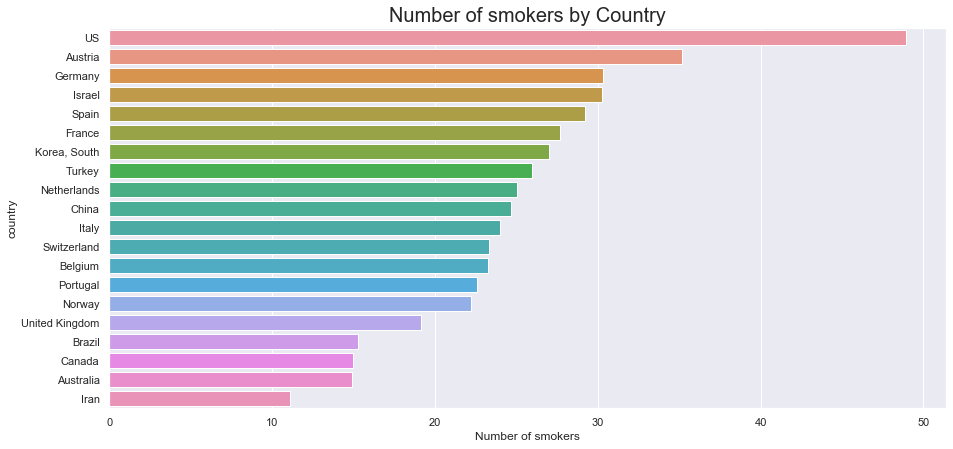

In [79]:
demo_data11 = demo_data1.groupby(['country'])['country',
                                           'smokers'].sum().reset_index().sort_values('smokers',ascending=False)

demo_data11 = demo_data11.loc[demo_data11['country'].isin(['US', 'Italy', 'China', 'Spain', 'Germany', 'France', 'Iran',
       'United Kingdom', 'Switzerland', 'Netherlands', 'Belgium',
       'Korea, South', 'Turkey', 'Austria', 'Canada', 'Portugal', 'Norway',
       'Brazil', 'Israel', 'Australia'])==True]

plot111 = sns.barplot(x="smokers",y="country", data=demo_data11)

plt.xlabel("Number of smokers")

plt.title("Number of smokers by Country",fontsize=20)

#### In later [section](#demo_understand), I found that the high number of smokers relates with the number of confirmed cases for Covid-19. However, more scientific research is needed to be conducted in order to draw the final conclusion.


<img src="Epidemic Curve of the Confirmed Cases of Coronavirus Disease 2019 (COVID-19).png">

Source: [Journal of the American Medical Association](https://jamanetwork.com/journals/jama/fullarticle/2762130)


#### Nearly after 20 days, the number of actual outbreak decreased signifcantly.


#### However, after approximately 15 days of quarantine, school shutdowns, and travel bans, the number of cases in Italy and U.S. continue to rise exponentially. This may due to the fact that China had acted fast as soon as a few cases were detected, but this was not the case for Italy and the U.S.

## 2) SEIR Model

<a id='SEIR'></a>


Special thanks to: [funkyboy](https://www.kaggle.com/super13579/covid-19-global-forecast-seir-visualize) and [Daner Ferhadi](https://www.kaggle.com/dferhadi/logistic-curve-fitting-global-covid-19-confirmed)

#### Reference:

- [Exponential Growth - 3Blue1Brown](https://www.youtube.com/watch?v=Kas0tIxDvrg&t=3s)
- [Compartmental Model in Epidemiology](https://en.wikipedia.org/wiki/Compartmental_models_in_epidemiology#The_SEIR_model)
- [Epidemic Calculator](http://gabgoh.github.io/COVID/index.html)

## What's logistic curve or SEIR model and how they are related to predicting the pandemic?

## Logistic Curve

<a id='logistic_curve'></a>


- The spread of an epidemic can be modeled using a logistic curve rather than an exponential curve. 

- The growth can start exponentially, however, it must slow down after some point called the **inflection point**.  The inflection point is essentially the midpoint of the spread. 

In the next few sections, we will model the number of Covid-19 cases using a logistic curve. But first, let's briefly walk through the equation for the curve and the plot of the curve.


<img src="log-curve.png">


Source: [3Blue1Brown](https://www.youtube.com/watch?v=Kas0tIxDvrg&t=3s)



### We can already see China and Korea epidemic follwed this curve

Text(0.5, 1.0, 'Total numbers of Cases in China')

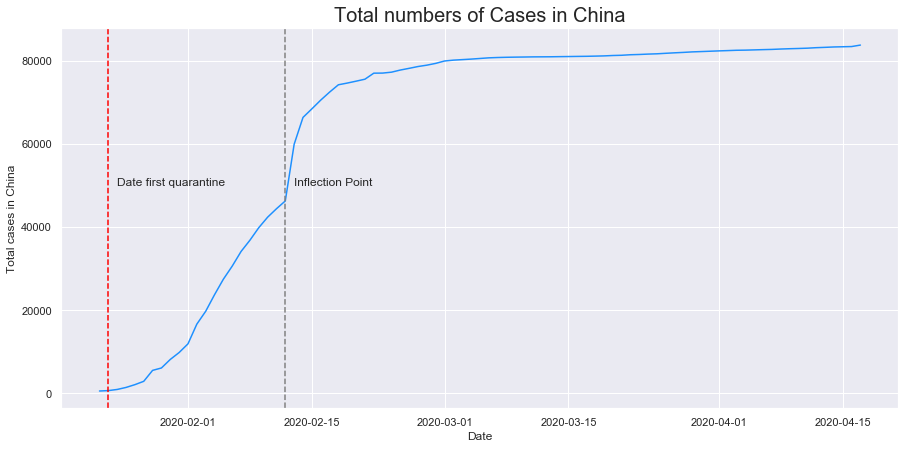

In [80]:
china_sum = complete_data.loc[complete_data['Country_Region']=="China"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

china_sum = pd.melt(china_sum, id_vars=['Date'], value_vars=['Confirmed'])

china_sum = china_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=china_sum, x="Date", y="total", color="dodgerblue")

ax.axvline(pd.to_datetime('2020-01-23'), color="red", linestyle="--")

ax.axvline(pd.to_datetime('2020-02-12'), color="gray", linestyle="--")

ax.annotate("Date first quarantine", xy=(pd.to_datetime('2020-01-24'), 50000))

ax.annotate("Inflection Point", xy=(pd.to_datetime('2020-02-13'), 50000))

plt.ylabel("Total cases in China")

plt.title("Total numbers of Cases in China",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Cases in South Korea')

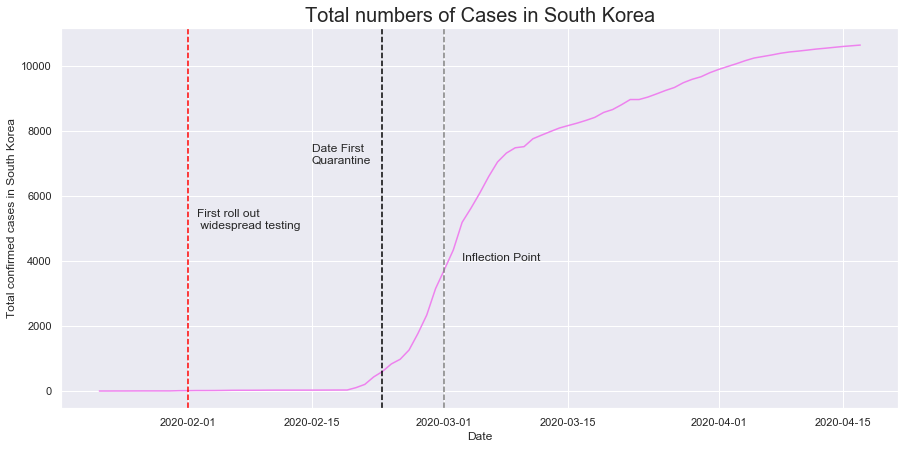

In [81]:
korea_sum = complete_data.loc[complete_data['Country_Region']=="South Korea"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

korea_sum = pd.melt(korea_sum, id_vars=['Date'], value_vars=['Confirmed'])

korea_sum = korea_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=korea_sum, x="Date", y="total", color="violet")

ax.axvline(pd.to_datetime('2020-02-23'), color="black", linestyle="--")

ax.axvline(pd.to_datetime('2020-03-01'), color="gray", linestyle="--")

ax.axvline(pd.to_datetime('2020-02-01'), color="red", linestyle="--")

ax.annotate("First roll out \n widespread testing", xy=(pd.to_datetime('2020-02-02'), 5000))

ax.annotate("Date First \nQuarantine", xy=(pd.to_datetime('2020-02-15'), 7000))

ax.annotate("Inflection Point", xy=(pd.to_datetime('2020-03-03'), 4000))

plt.ylabel("Total confirmed cases in South Korea")

plt.title("Total numbers of Cases in South Korea",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Cases in Italy')

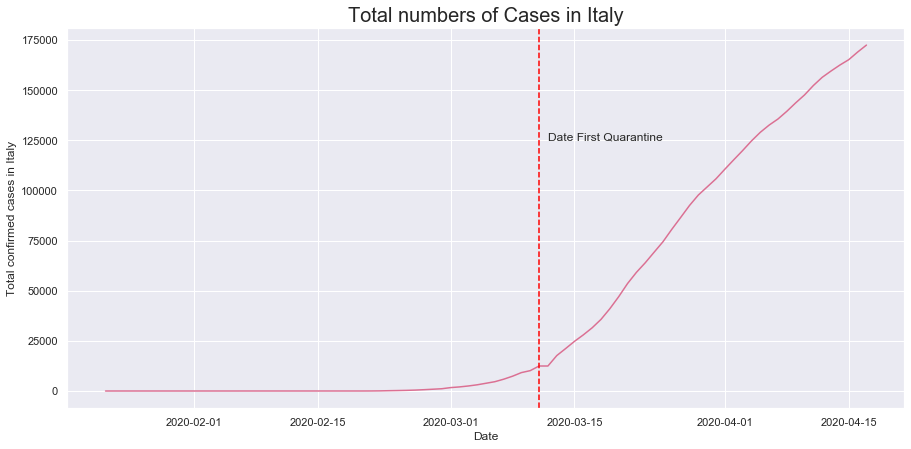

In [82]:
italy_sum = complete_data.loc[complete_data['Country_Region']=="Italy"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

italy_sum = pd.melt(italy_sum, id_vars=['Date'], value_vars=['Confirmed'])

italy_sum = italy_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=italy_sum, x="Date", y="total", color="palevioletred")

ax.axvline(pd.to_datetime('2020-03-11'), color="red", linestyle="--")

ax.annotate("Date First Quarantine", xy=(pd.to_datetime('2020-03-12'), 125000))

plt.ylabel("Total confirmed cases in Italy")

plt.title("Total numbers of Cases in Italy",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Cases in Spain')

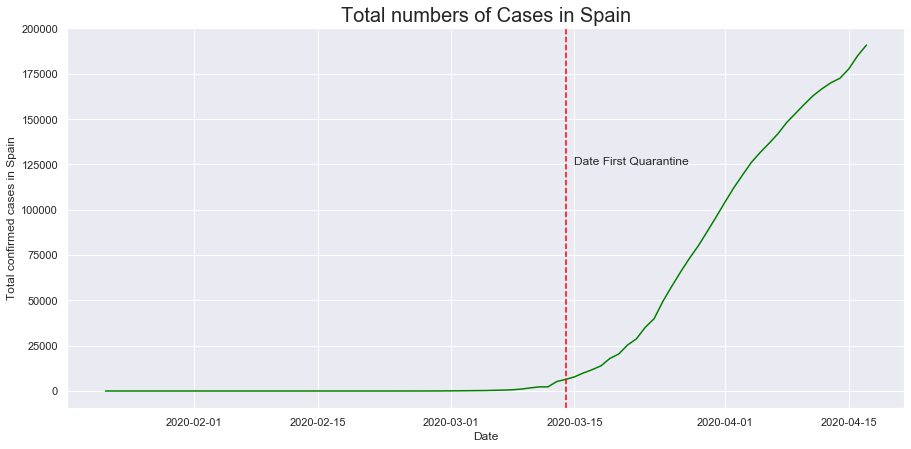

In [83]:
spain_sum = complete_data.loc[complete_data['Country_Region']=="Spain"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

spain_sum = pd.melt(spain_sum, id_vars=['Date'], value_vars=['Confirmed'])

spain_sum = spain_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=spain_sum, x="Date", y="total", color="green")

ax.axvline(pd.to_datetime('2020-03-14'), color="red", linestyle="--")

ax.annotate("Date First Quarantine", xy=(pd.to_datetime('2020-03-15'), 125000))

plt.ylabel("Total confirmed cases in Spain")

plt.title("Total numbers of Cases in Spain",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Cases in France')

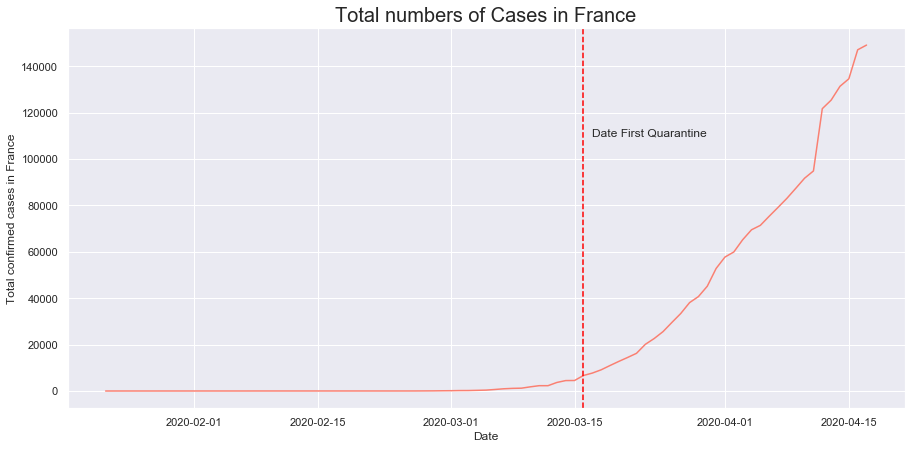

In [84]:
france_sum = complete_data.loc[complete_data['Country_Region']=="France"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

france_sum = pd.melt(france_sum, id_vars=['Date'], value_vars=['Confirmed'])

france_sum = france_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=france_sum, x="Date", y="total", color="salmon")

ax.axvline(pd.to_datetime('2020-03-16'), color="red", linestyle="--")

ax.annotate("Date First Quarantine", xy=(pd.to_datetime('2020-03-17'), 110000))

plt.ylabel("Total confirmed cases in France")

plt.title("Total numbers of Cases in France",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Cases in Germany')

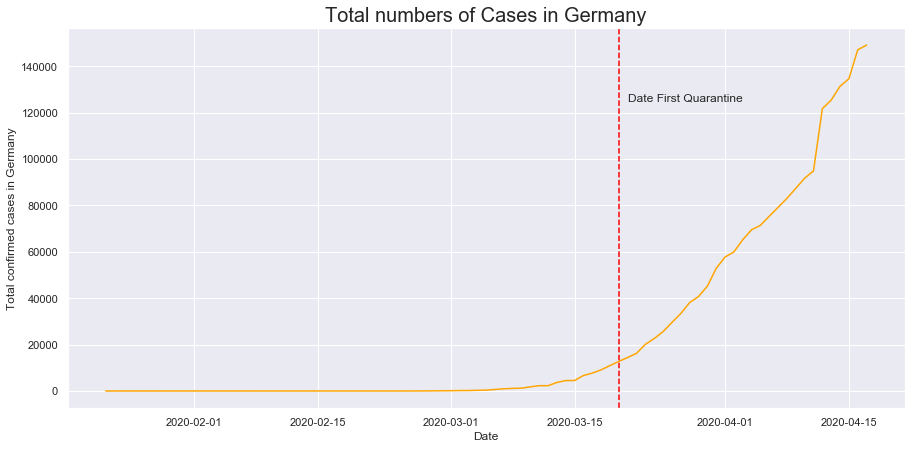

In [85]:
germany_sum = complete_data.loc[complete_data['Country_Region']=="Germany"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

germany_sum = pd.melt(germany_sum, id_vars=['Date'], value_vars=['Confirmed'])

germany_sum = france_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=germany_sum, x="Date", y="total", color="orange")

ax.axvline(pd.to_datetime('2020-03-20'), color="red", linestyle="--")

ax.annotate("Date First Quarantine", xy=(pd.to_datetime('2020-03-21'), 125000))

plt.ylabel("Total confirmed cases in Germany")

plt.title("Total numbers of Cases in Germany",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Cases in Iran')

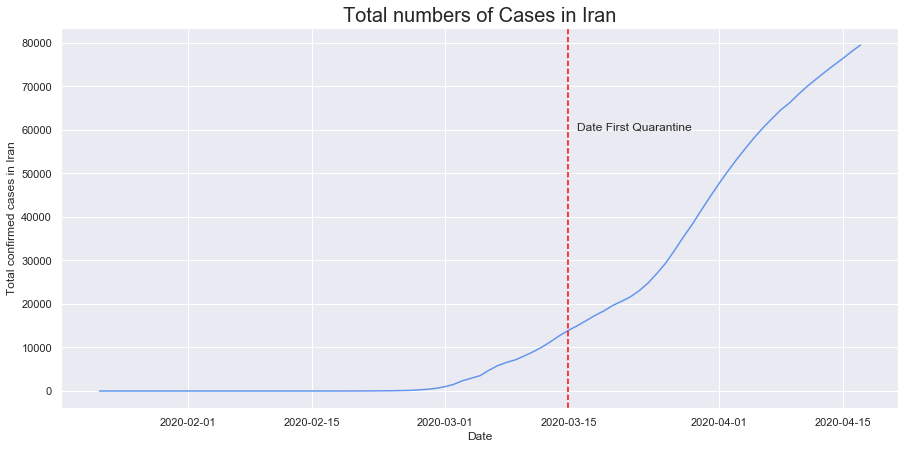

In [86]:
iran_sum = complete_data.loc[complete_data['Country_Region']=="Iran"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

iran_sum = pd.melt(iran_sum, id_vars=['Date'], value_vars=['Confirmed'])

iran_sum = iran_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=iran_sum, x="Date", y="total", color="cornflowerblue")

ax.axvline(pd.to_datetime('2020-03-15'), color="red", linestyle="--")

ax.annotate("Date First Quarantine", xy=(pd.to_datetime('2020-03-16'), 60000))

plt.ylabel("Total confirmed cases in Iran")

plt.title("Total numbers of Cases in Iran",fontsize=20)


Text(0.5, 1.0, 'Total numbers of Cases in the U.S.')

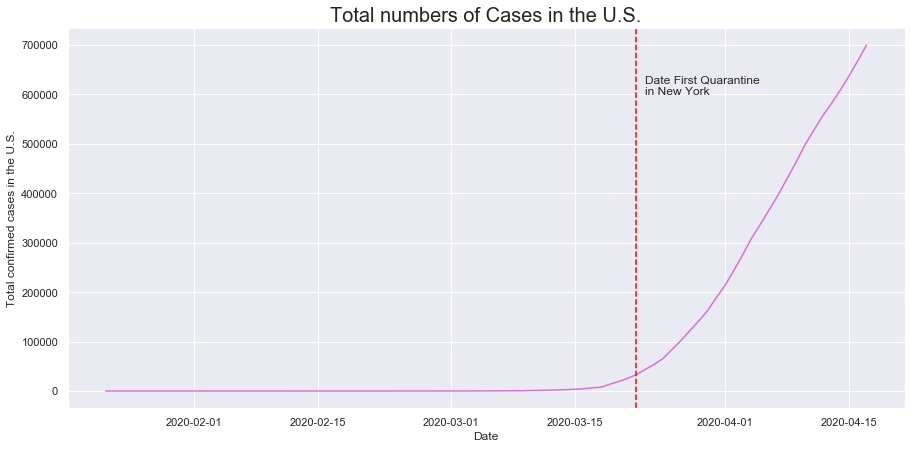

In [87]:
us_sum = complete_data.loc[complete_data['Country_Region']=="US"].groupby('Date')['Date', 'Confirmed'].sum().reset_index()

us_sum = pd.melt(us_sum, id_vars=['Date'], value_vars=['Confirmed'])

us_sum = us_sum.rename(columns={"value": "total", "variable": "Cases"})

ax=sns.lineplot(data=us_sum, x="Date", y="total", color="orchid")

ax.axvline(pd.to_datetime('2020-03-22'), color="red", linestyle="--")

ax.annotate("Date First Quarantine \nin New York", xy=(pd.to_datetime('2020-03-23'), 600000))

plt.ylabel("Total confirmed cases in the U.S.")

plt.title("Total numbers of Cases in the U.S.",fontsize=20)


We won't go into details about the math, but a general understanding would be sufficient:

### Logistic Function

A **logistic function** or **logistic curve** is an equation of the form: 

$f(x) = \frac{N}{1 + e^{-k(x-x_0)}}$

#### where

- N = the curve's maximum value
- $x_0$ = the inflection point
- k = growth rate of the curve

Reference: https://en.wikipedia.org/wiki/Logistic_function

### Put the function in the current pandemic

There are 4 important factors in our model:
- Growth Factor
- Growth Ratio
- Growth Rate
- 2nd Derivative

We will use these growth metrics to gain insight into which countries may have already hit their inflection points. For example, **if a country's growth factor has stabilized around 1.0 then this can be a sign that that country has reached it's inflection point**. 

We will then fit the logistic curve to the number of confirmed cases for each country. This will help us predict whether a country has hit their inflection point, and when they will reach a possible maximum number of confirmed cases.

Furthermore, if we take the **2nd derivative**, it is telling us **how fast the case is growing**.

The bigger picture will be to correlate this with preventative efforts such as quarantines, widespread testing, etc.


### Growth Equation

**Growth factor**:

$G_n = \frac{G_n - G_{n-1}}{G_{n-1} - G_{n-2}}$

**Growth ratio**:

$G_n = \frac{G_n }{G_{n-1}}$

- $G_n$ : Number of cases on **n** day

Special thanks to Daner Ferhadi for the functions.

In [88]:
# This functions smooths data, thanks to Dan Pearson. We will use it to smooth the data for growth factor.
def smoother(inputdata,w,imax):
    data = 1.0*inputdata
    data = data.replace(np.nan,1)
    data = data.replace(np.inf,1)
    #print(data)
    smoothed = 1.0*data
    normalization = 1
    for i in range(-imax,imax+1):
        if i==0:
            continue
        smoothed += (w**abs(i))*data.shift(i,axis=0)
        normalization += w**abs(i)
    smoothed /= normalization
    return smoothed

def growth_factor(confirmed):
    confirmed_iminus1 = confirmed.shift(1, axis=0)
    confirmed_iminus2 = confirmed.shift(2, axis=0)
    return (confirmed-confirmed_iminus1)/(confirmed_iminus1-confirmed_iminus2)

def growth_ratio(confirmed):
    confirmed_iminus1 = confirmed.shift(1, axis=0)
    return (confirmed/confirmed_iminus1)

# This is a function which plots (for in input country) the active, confirmed, and recovered cases, deaths, and the growth factor.
def plot_country_active_confirmed_recovered(country):
    
    # Plots Active, Confirmed, and Recovered Cases. Also plots deaths.
    country_data = train[train['Country_Region']==country]
    table = country_data.drop(['Id','Province_State'], axis=1)

    table2 = pd.pivot_table(table, values=['ConfirmedCases','Fatalities'], index=['Date'], aggfunc=np.sum)
    table3 = table2.drop(['Fatalities'], axis=1)
   
    # Growth Factor
    w = 0.5
    table2['GrowthFactor'] = growth_factor(table2['ConfirmedCases'])
    table2['GrowthFactor'] = smoother(table2['GrowthFactor'],w,5)

    # 2nd Derivative
    table2['2nd_Derivative'] = np.gradient(np.gradient(table2['ConfirmedCases'])) #2nd derivative
    table2['2nd_Derivative'] = smoother(table2['2nd_Derivative'],w,7)


    #Plot confirmed[i]/confirmed[i-1], this is called the growth ratio
    table2['GrowthRatio'] = growth_ratio(table2['ConfirmedCases'])
    table2['GrowthRatio'] = smoother(table2['GrowthRatio'],w,5)
    
        #Plot the growth rate, we will define this as k in the logistic function presented at the beginning of this notebook.
    table2['GrowthRate']=np.gradient(np.log(table2['ConfirmedCases']))
    table2['GrowthRate'] = smoother(table2['GrowthRate'],0.5,3)
    
    # horizontal line at growth rate 1.0 for reference
    x_coordinates = [1, 100]
    y_coordinates = [1, 1]
    
    sns.set(rc={'figure.figsize':(10, 5)})

    
    pd.plotting.register_matplotlib_converters()

    #plots
    table2['Fatalities'].plot(title='Fatalities')
    plt.show()
    table3.plot() 
    plt.show()
    table2['GrowthFactor'].plot(title='Growth Factor')
    plt.plot(x_coordinates, y_coordinates) 
    plt.show()
    table2['2nd_Derivative'].plot(title='2nd_Derivative')
    plt.show()
    table2['GrowthRatio'].plot(title='Growth Ratio')
    plt.plot(x_coordinates, y_coordinates)
    plt.show()
    table2['GrowthRate'].plot(title='Growth Rate')
    plt.show()


    return 


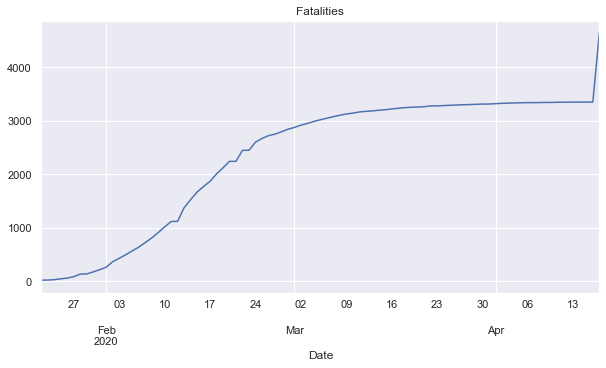

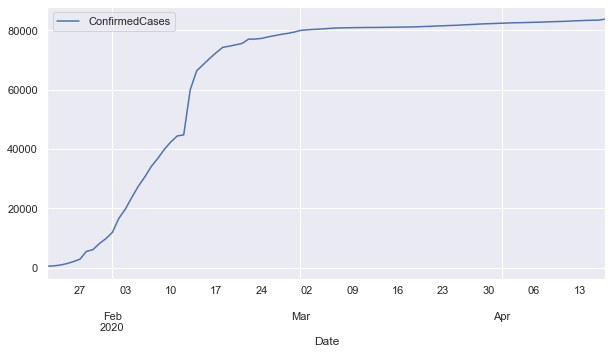

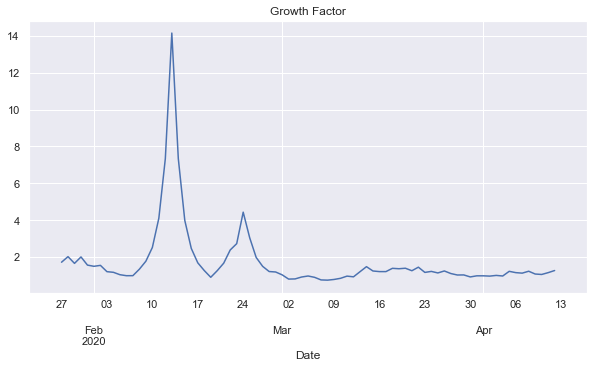

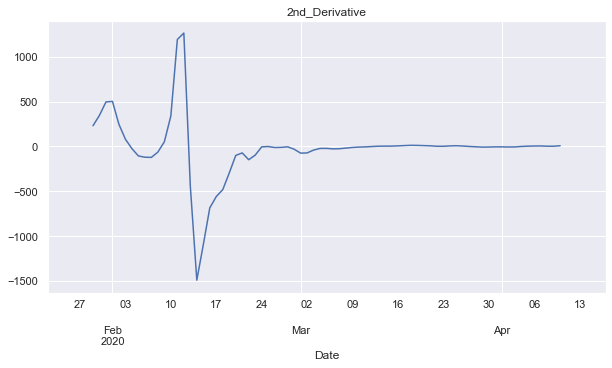

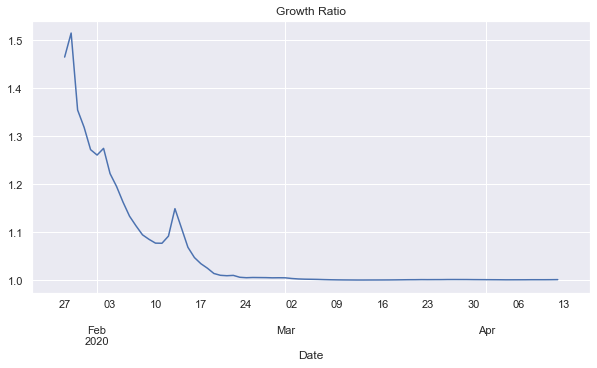

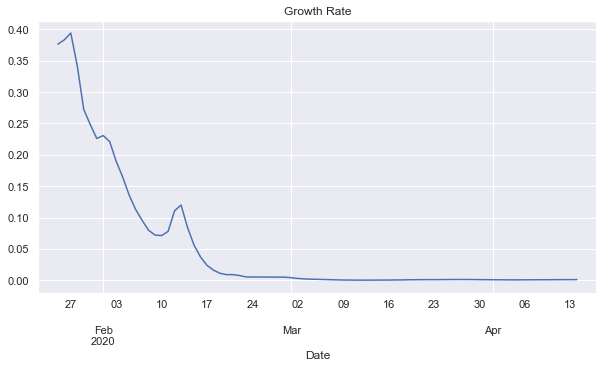

In [89]:
plot_country_active_confirmed_recovered('China')

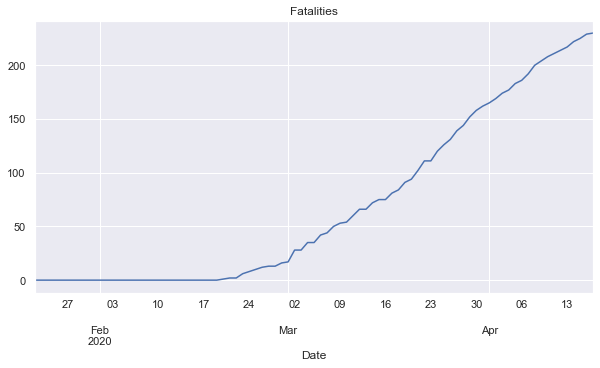

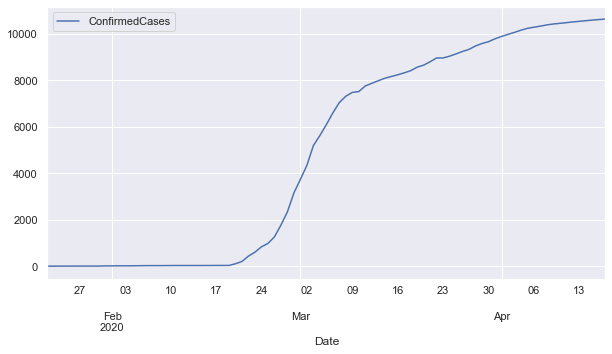

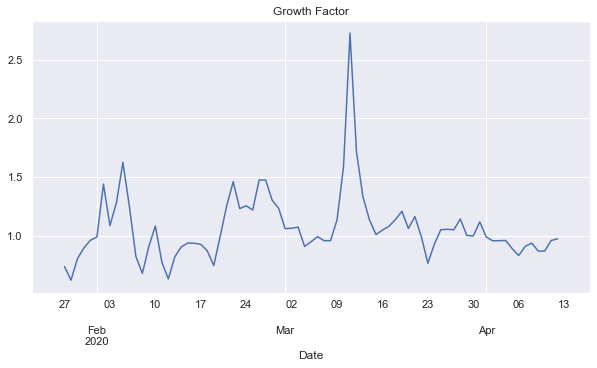

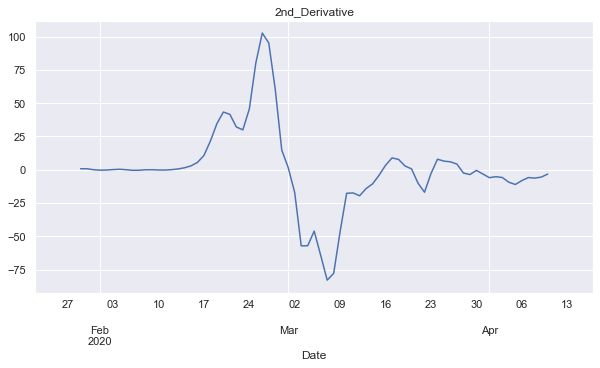

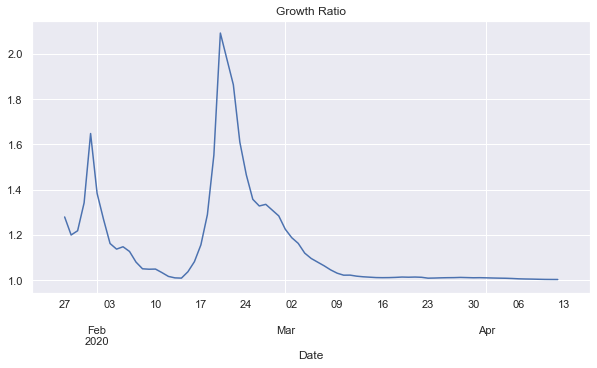

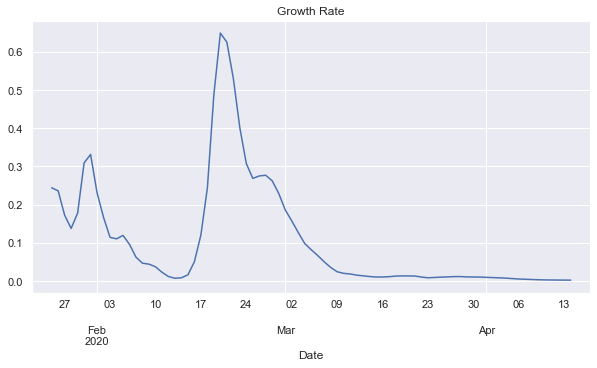

In [90]:
plot_country_active_confirmed_recovered('Korea, South')

/Users/giangnguyen/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:853: RuntimeWarning:

divide by zero encountered in log

/Users/giangnguyen/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1063: RuntimeWarning:

invalid value encountered in subtract

/Users/giangnguyen/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:1084: RuntimeWarning:

invalid value encountered in double_scalars



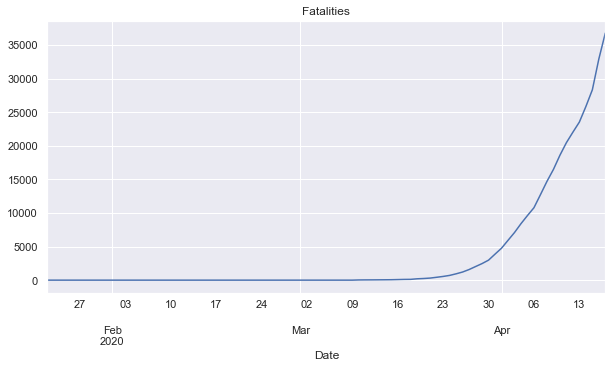

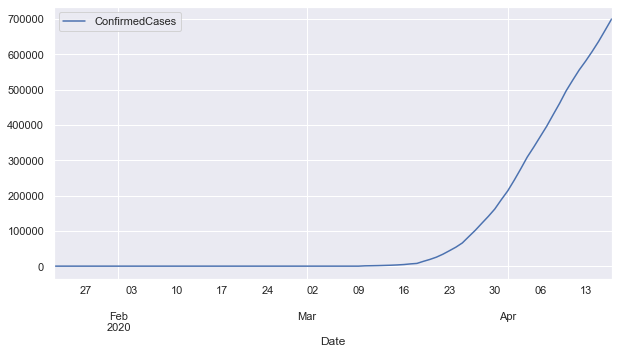

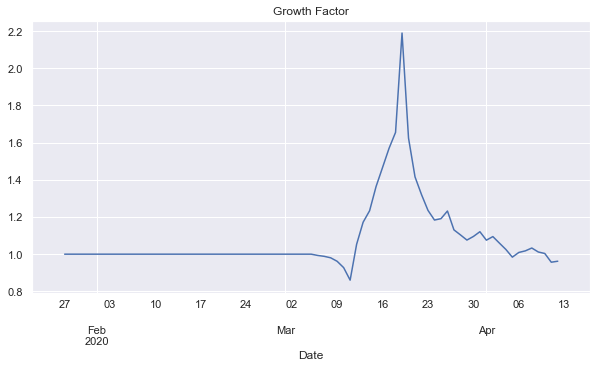

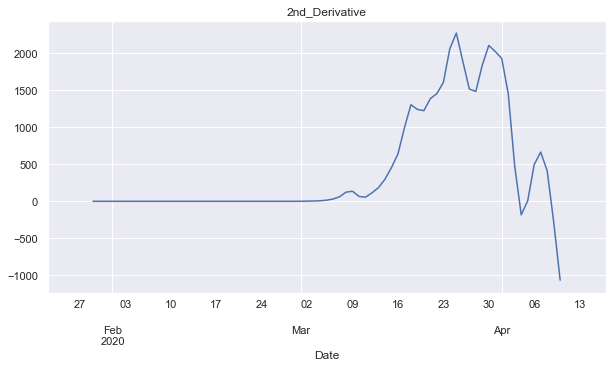

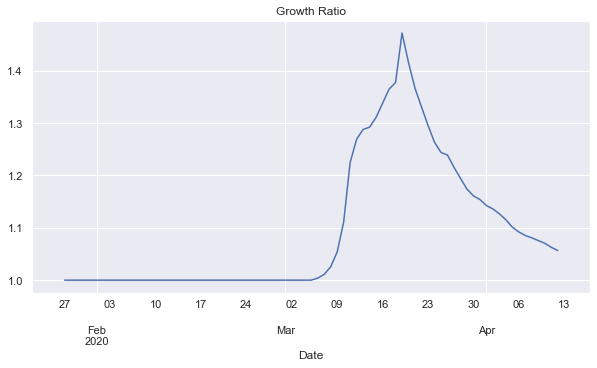

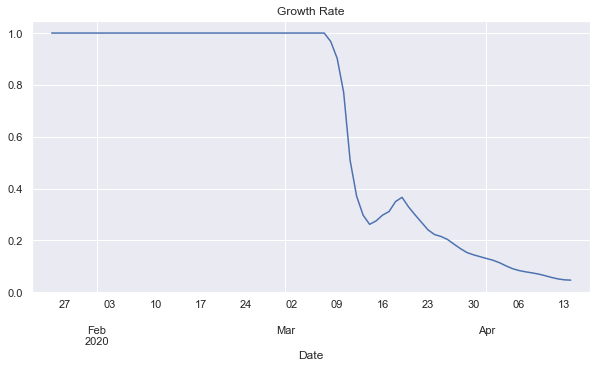

In [91]:
plot_country_active_confirmed_recovered('US')

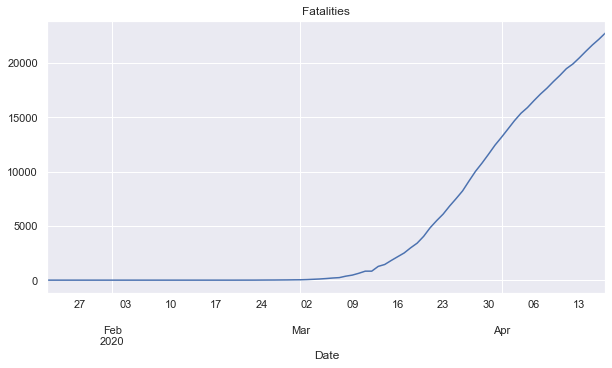

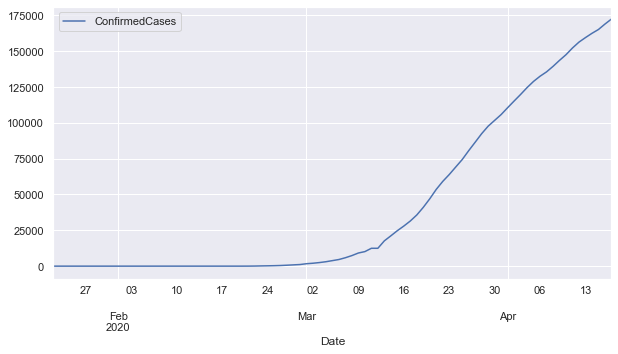

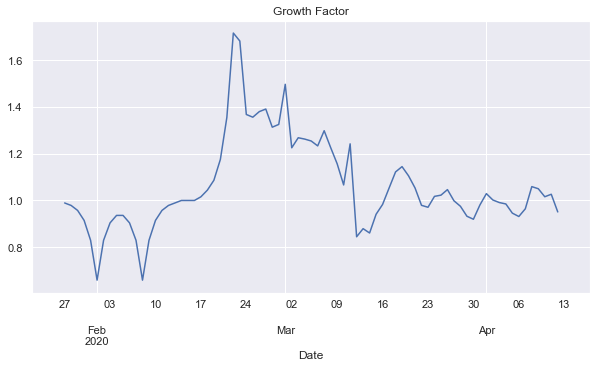

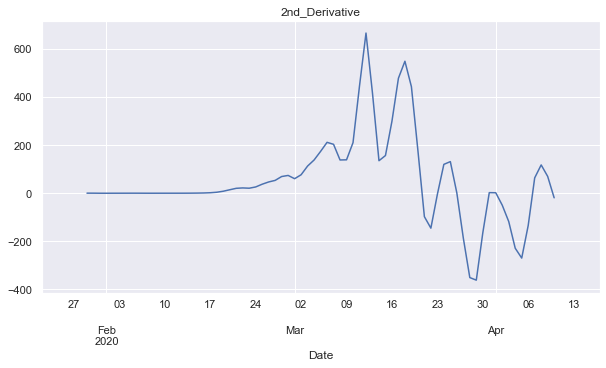

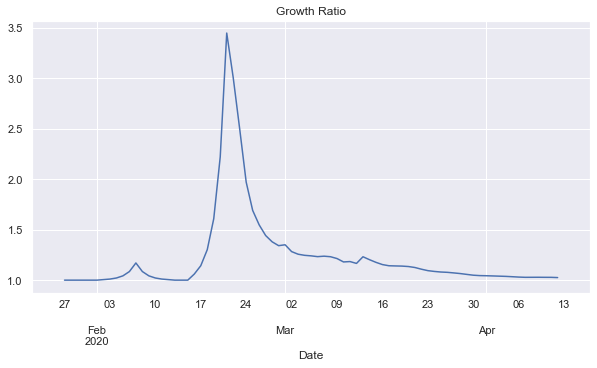

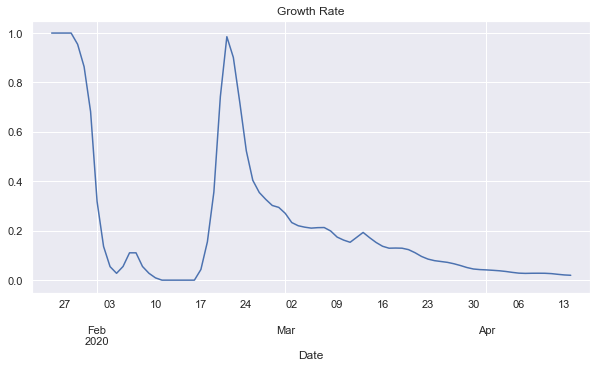

In [92]:
plot_country_active_confirmed_recovered('Italy')

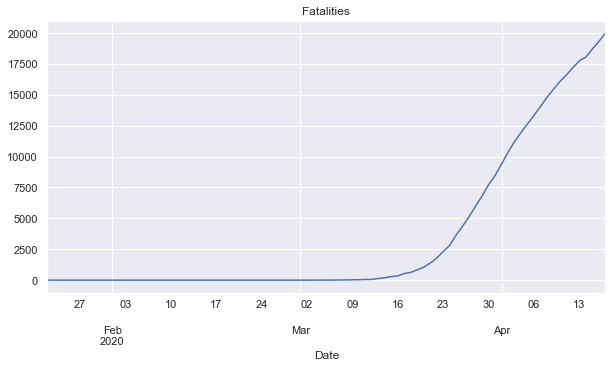

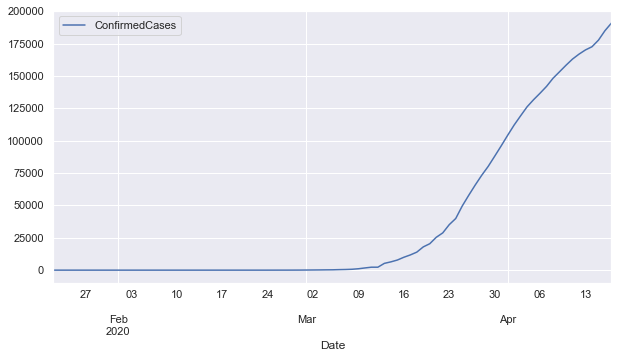

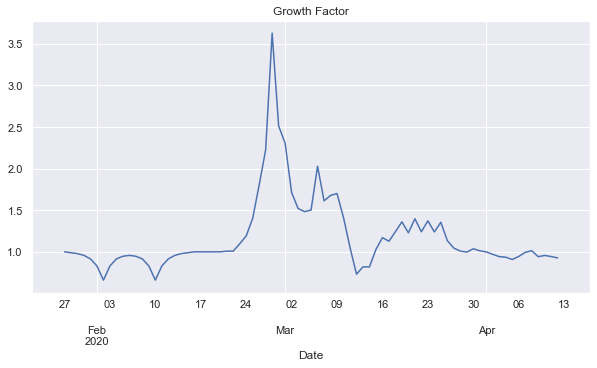

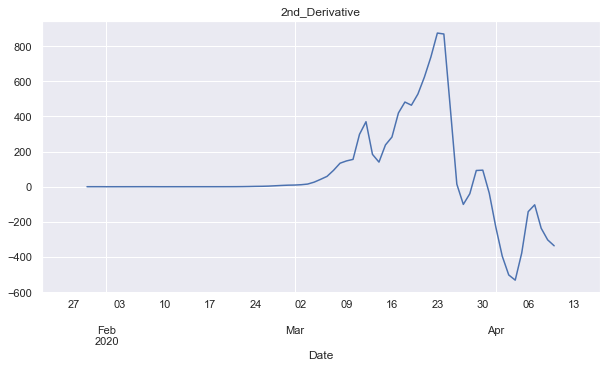

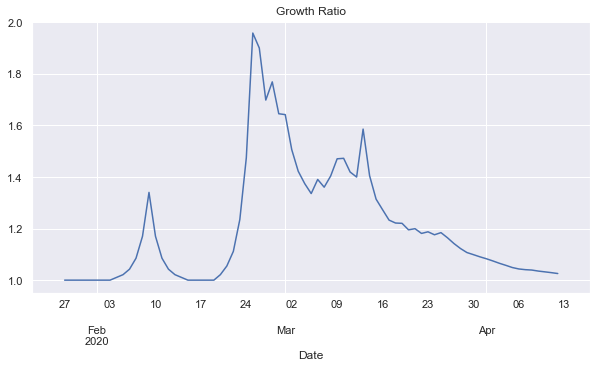

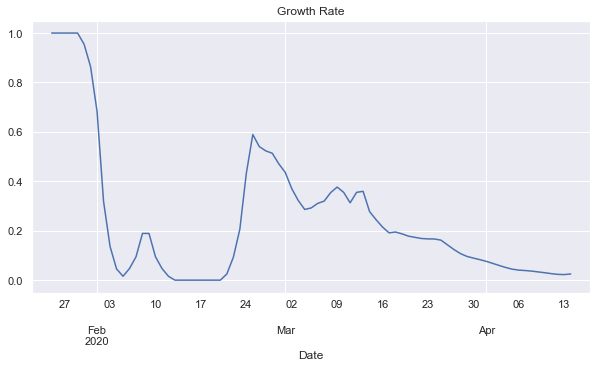

In [93]:
plot_country_active_confirmed_recovered('Spain')

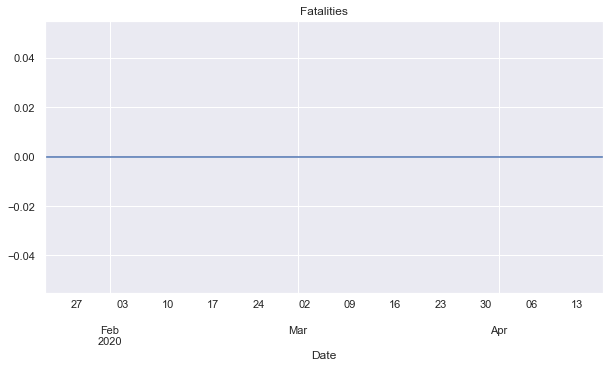

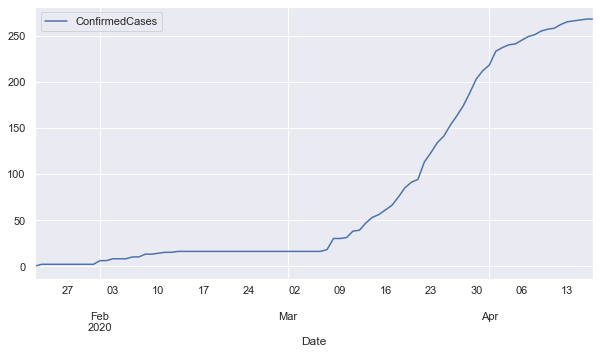

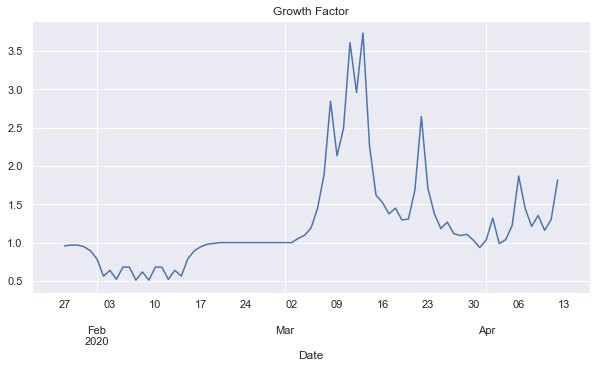

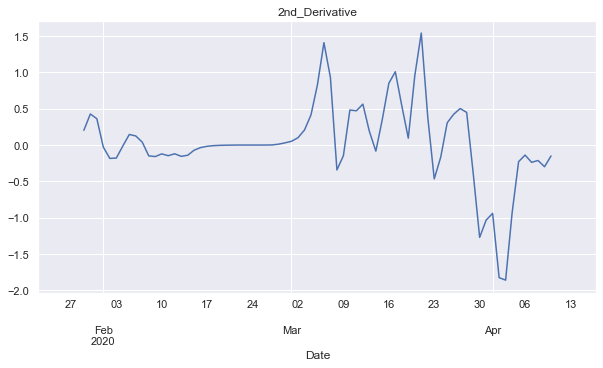

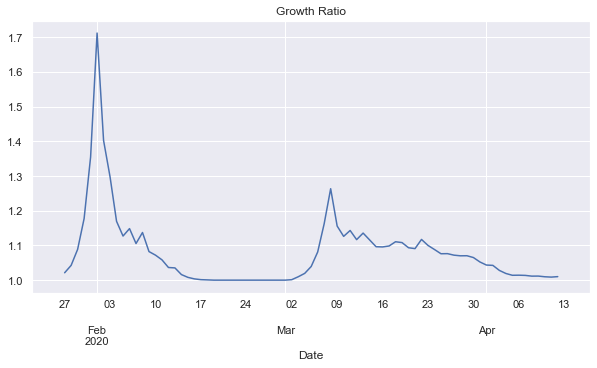

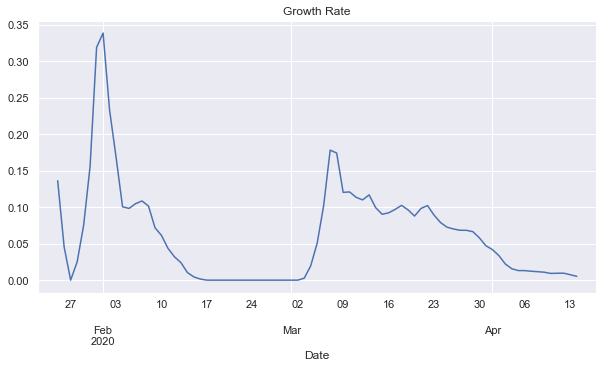

In [94]:
plot_country_active_confirmed_recovered('Vietnam')

#### Even though  China and South Korea Growth Factor has approximated 1.00, U.S., Italy and Spain are growing fast in the number of infected cases (the 2nd Derivative curve is increasing). Vietnam - my country, even though it has no death case so far and still on a very small amount of infected cases, there's potential that it will widespread if we do not act now.


## SEIR Model 

<a id='SEIR_model'></a>

* Function was taken from the [Epidemic Calculator](http://gabgoh.github.io/COVID/index.html)
![image.png](https://upload.wikimedia.org/wikipedia/commons/3/3d/SEIR.PNG)
- **S**usceptible : number of susceptible
- **E**xpose : number of expose
- **I**nfectious : number of infectious
- **R**ecovered or Removed : number recovered (or immune) individuals

### S + E + I + R = N
- N is a country total population

Differential Equations are as below (Source: [Epidemic Calculator](http://gabgoh.github.io/COVID/index.html)): 
![image.png](SEIR-math.png)

We need to solve the Differential equation to find the S,E,I,R, but what is **$R_t$**, **$T_inf$**, **$T_inc$** and how can we define those variable.

* $R_0$: [Reproduction number](https://en.wikipedia.org/wiki/Basic_reproduction_number) is the expected number of cases directly generated by one case in a population where all individuals are susceptible to infection
* $R_t$: The state where no other individuals are infected or immunized (naturally or through vaccination)
* $T_{inf}$: Average duration of the infection, $T_{inf}$ can be treat as individual experiences one recovery in k units of time.
* $T_{inc}$: Average incubation period, according to previous research, they defined is as 5.2 ([reference1](https://www.ncbi.nlm.nih.gov/pubmed/32150748), [reference2](https://www.worldometers.info/coronavirus/coronavirus-incubation-period/))

### Assume there are some intervention will cause reproduction number ($R_0$) reduce (such as more ICU beds, quarantine, widespread testing, contact tracing, government, vaccines ....), have an effectiveness which decays over time 

In [95]:
# Function code refernece from https://www.kaggle.com/anjum48/seir-model-with-intervention

# Susceptible equation
def dS_dt(S, I, R_t, T_inf):
    return -(R_t / T_inf) * I * S

# Exposed equation
def dE_dt(S, E, I, R_t, T_inf, T_inc):
    return (R_t / T_inf) * I * S - (T_inc**-1) * E

# Infected equation
def dI_dt(I, E, T_inc, T_inf):
    return (T_inc**-1) * E - (T_inf**-1) * I

# Recovered/Remove/deceased equation
def dR_dt(I, T_inf):
    return (T_inf**-1) * I

def SEIR_model(t, y, R_t, T_inf, T_inc):
    
    if callable(R_t):
        reproduction = R_t(t)
    else:
        reproduction = R_t
        
    S, E, I, R = y
    
    S_out = dS_dt(S, I, reproduction, T_inf)
    E_out = dE_dt(S, E, I, reproduction, T_inf, T_inc)
    I_out = dI_dt(I, E, T_inc, T_inf)
    R_out = dR_dt(I, T_inf)
    
    return [S_out, E_out, I_out, R_out]

### Plot SEIR model and predict

In [96]:
## Thanks @funkyboy for the plotting function

def plot_model_and_predict(data, pop, solution, title='SEIR model'):
    sus, exp, inf, rec = solution.y
    
    f = plt.figure(figsize=(16,5))
    ax = f.add_subplot(1,2,1)
    #ax.plot(sus, 'b', label='Susceptible');
    ax.plot(exp, 'y', label='Exposed');
    ax.plot(inf, 'r', label='Infected');
    ax.plot(rec, 'c', label='Recovered/deceased');
    plt.title(title)
    plt.xlabel("Days", fontsize=10);
    plt.ylabel("Fraction of population", fontsize=10);
    plt.legend(loc='best');
    
    ax2 = f.add_subplot(1,2,2)
    preds = np.clip((inf + rec) * pop ,0,np.inf)
    ax2.plot(range(len(data)),preds[:len(data)],label = 'Predict ConfirmedCases')
    ax2.plot(range(len(data)),data['ConfirmedCases'])
    plt.title('Model predict and data')
    plt.ylabel("Population", fontsize=10);
    plt.xlabel("Days", fontsize=10);
    plt.legend(loc='best');

### Model without intervention

We will first try the model on New York. 

We can see that without any intervention, the number confirmed cases will continue to increase.


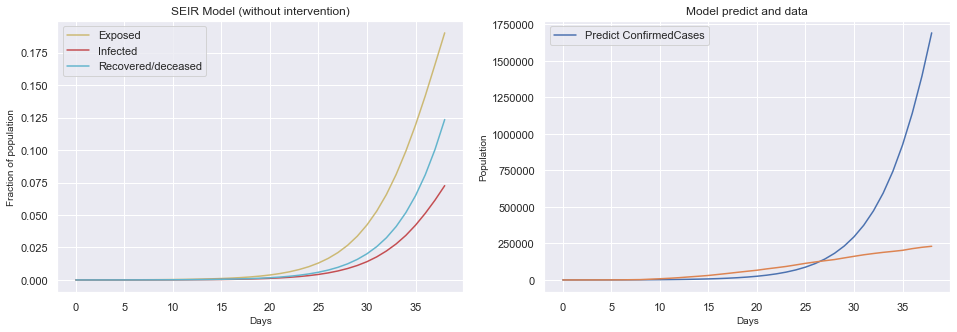

In [97]:
Country = 'New York'
N = pop_info[pop_info['Name']==Country]['Population'].tolist()[0] # Hubei Population 

# Load dataset of Hubei
train_loc = train[train['Country_Region']==Country].query('ConfirmedCases > 0')
if len(train_loc)==0:
    train_loc = train[train['Province_State']==Country].query('ConfirmedCases > 0')

n_infected = train_loc['ConfirmedCases'].iloc[0] # start from first comfirmedcase on dataset first date
max_days = len(train_loc)# how many days want to predict

# Initial stat for SEIR model
s = (N - n_infected)/ N
e = 0.
i = n_infected / N
r = 0.

# Define all variable of SEIR model 
T_inc = 5.2  # average incubation period
T_inf = 2.9 # average infectious period
R_0 = 3.954 # reproduction number

## Solve the SEIR model 
sol = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(R_0, T_inf, T_inc), 
                t_eval=np.arange(max_days))

## Plot result
plot_model_and_predict(train_loc, N, sol, title = 'SEIR Model (without intervention)')

### Model with intervention
* There are different way to reduce $R_t$, [Different decay function](https://github.com/SwissTPH/openmalaria/wiki/ModelDecayFunctions) 

This could be modified to take any function of $R_t(t)$ values to model the reproduction number as a time varying variable

When we introduce intervention, we can curb the spread of the Covid-19 cases.


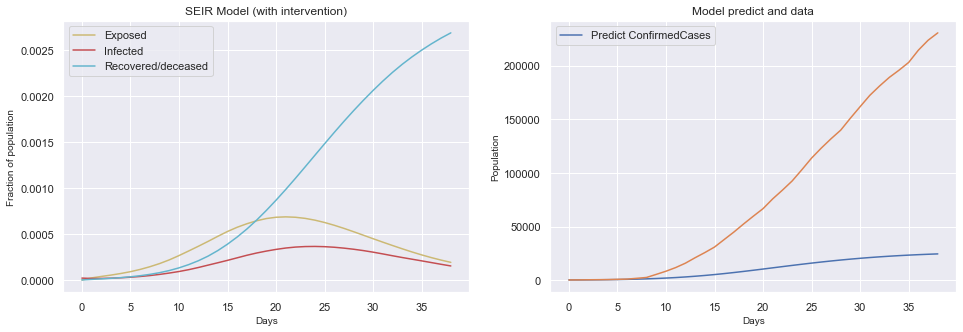

In [98]:
# Define all variable of SEIR model 
T_inc = 5.2  # average incubation period
T_inf = 2.9  # average infectious period

# Define the intervention parameters (fit result, latter will show how to fit)
R_0, cfr, k, L=[ 3.95469597 , 0.04593316 , 3.      ,   15.32328881]

def time_varying_reproduction(t): 
    return R_0 / (1 + (t/L)**k)

sol2 = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(time_varying_reproduction, T_inf, T_inc), 
                t_eval=np.arange(max_days))

plot_model_and_predict(train_loc, N, sol2, title = 'SEIR Model (with intervention)')

## Fit the SEIR model to real data and predict

Find the best variables of SEIR model to fit the real data
* **T_inf** --> Using average value 2.9 
* **T_inc** --> Using average value 5.2
* **R_t** --> find the best reproduction number by fitting the real data (if have decay function, find the paramater of decay function)
* **cfr** --> find the best Case fatality rate, this parater is for predict Fatalities

### Cumsum signal
* to prevent fluctuation

In [99]:
def cumsum_signal(vec):
    temp_val = 0
    vec_new = []
    for i in vec:
        if i > temp_val:
            vec_new.append(i)
            temp_val = i
        else:
            vec_new.append(temp_val)
    return vec_new

### Intervention by after days for SEIR model
* after days, start interverntion, $ R_0 = R_0 * 0.5$

In [100]:
# Use a constant reproduction number
def eval_model_const(params, data, population, return_solution=False, forecast_days=0):
    R_0, cfr = params # Paramaters, R0 and cfr 
    N = population # Population of each country
    n_infected = data['ConfirmedCases'].iloc[0] # start from first comfirmedcase on dataset first date
    max_days = len(data) + forecast_days # How many days want to predict
    s, e, i, r = (N - n_infected)/ N, 0, n_infected / N, 0 #Initial stat for SEIR model
    
    # R0 become half after intervention days
    def time_varying_reproduction(t):
        if t > 60: # we set intervention days = 60
            return R_0 * 0.5
        else:
            return R_0
    
    # Solve the SEIR differential equation.
    sol = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(time_varying_reproduction, T_inf, T_inc),
                    t_eval=np.arange(0, max_days))
    
    sus, exp, inf, rec = sol.y
    # Predict confirmedcase
    y_pred_cases = np.clip((inf + rec) * N ,0,np.inf)
    y_true_cases = data['ConfirmedCases'].values
    
    # Predict Fatalities by remove * fatality rate(cfr)
    y_pred_fat = np.clip(rec*N* cfr, 0, np.inf)
    y_true_fat = data['Fatalities'].values
    
    optim_days = min(20, len(data))  # Days to optimise for
    weights = 1 / np.arange(1, optim_days+1)[::-1]  # Recent data is more heavily weighted
    
    # using mean squre log error to evaluate
    msle_cases = mean_squared_log_error(y_true_cases[-optim_days:], y_pred_cases[-optim_days:], weights)
    msle_fat = mean_squared_log_error(y_true_fat[-optim_days:], y_pred_fat[-optim_days:], weights)
    msle_final = np.mean([msle_cases, msle_fat])
    
    if return_solution:
        return msle_final, sol
    else:
        return msle_final

### Intervention by Hill function for SEIR model
- [Decay Function](https://github.com/SwissTPH/openmalaria/wiki/ModelDecayFunctions)

In [101]:
# Use a Hill decayed reproduction number
def eval_model_decay(params, data, population, return_solution=False, forecast_days=0):
    R_0, cfr, k, L = params # Paramaters, R0 and cfr 
    N = population # Population of each country
    n_infected = data['ConfirmedCases'].iloc[0] # start from first comfirmedcase on dataset first date
    max_days = len(data) + forecast_days # How many days want to predict
    s, e, i, r = (N - n_infected)/ N, 0, n_infected / N, 0 #Initial stat for SEIR model
    
    # https://github.com/SwissTPH/openmalaria/wiki/ModelDecayFunctions   
    # Hill decay. Initial values: R_0=2.2, k=2, L=50
    def time_varying_reproduction(t): 
        return R_0 / (1 + (t/L)**k)
    
    # Solve the SEIR differential equation.
    sol = solve_ivp(SEIR_model, [0, max_days], [s, e, i, r], args=(time_varying_reproduction, T_inf, T_inc),
                    t_eval=np.arange(0, max_days))
    
    sus, exp, inf, rec = sol.y
    # Predict confirmedcase
    y_pred_cases = np.clip((inf + rec) * N ,0,np.inf)
    y_true_cases = data['ConfirmedCases'].values
    
    # Predict Fatalities by remove * fatality rate(cfr)
    y_pred_fat = np.clip(rec*N* cfr, 0, np.inf)
    y_true_fat = data['Fatalities'].values
    
    optim_days = min(20, len(data))  # Days to optimise for
    weights = 1 / np.arange(1, optim_days+1)[::-1]  # Recent data is more heavily weighted
    
    # using mean squre log error to evaluate
    msle_cases = mean_squared_log_error(y_true_cases[-optim_days:], y_pred_cases[-optim_days:], weights)
    msle_fat = mean_squared_log_error(y_true_fat[-optim_days:], y_pred_fat[-optim_days:], weights)
    msle_final = np.mean([msle_cases, msle_fat])
    
    if return_solution:
        return msle_final, sol
    else:
        return msle_final

### Function of Fit the SEIR model to real data
* Auto choose the best decay function of $R_t$ (intervention days decay or Hill decay)
* Total case/country population is below 1, reduce country population
* If datset still no case, return 0 
* Plot the fit result and forecast trends (Infect smooth decrease by what date)
* Function being hide, there are describe in code.

In [102]:
def fit_model_new(data, area_name, initial_guess=[2.2, 0.02, 2, 50], 
              bounds=((1, 20), (0, 0.15), (1, 3), (1, 100)), make_plot=True, decay_mode = None):
    
    if area_name in ['France']:# France last data looks weird, remove it
        train = data.query('ConfirmedCases > 0').copy()[:-1]
    else:
        train = data.query('ConfirmedCases > 0').copy()
    
    ####### Split Train & Valid #######
    valid_data = train[-7:].copy()
    train_data = train[:-7].copy()
    
    ####### If this country have no ConfirmedCase, return 0 #######
    if len(train_data) == 0:
        result_zero = np.zeros((43))
        return pd.DataFrame({'ConfirmedCases':result_zero,'Fatalities':result_zero}), 0 
    
    ####### Load the population of area #######
    try:
        #population = province_lookup[area_name]
        population = pop_info[pop_info['Name']==area_name]['Population'].tolist()[0]
    except IndexError:
        print ('country not in population set, '+str(area_name))
        population = 1000000 
    
    
    if area_name == 'US':
        population = 327200000
        
    if area_name == 'Global':
        population = 7744240900
        
    cases_per_million = train_data['ConfirmedCases'].max() * 10**6 / population
    n_infected = train_data['ConfirmedCases'].iloc[0]
    
    ####### Total case/popuplation below 1, reduce country population #######
    if cases_per_million < 1:
        #print ('reduce pop divide by 100')
        population = population/100
        
    ####### Fit the real data by minimize the MSLE #######
    res_const = minimize(eval_model_const, [2.2, 0.02], bounds=((1, 20), (0, 0.15)),
                         args=(train_data, population, False),
                         method='L-BFGS-B')

    res_decay = minimize(eval_model_decay, initial_guess, bounds=bounds,
                         args=(train_data, population, False),
                         method='L-BFGS-B')
    
    ####### Align the date information #######
    test_end = datetime.strptime('2020-05-14','%Y-%m-%d')
    test_start = datetime.strptime('2020-04-02','%Y-%m-%d')
    test_period = (test_end - test_start).days
    train_max = train_data.Date.max()
    train_all_max = train.Date.max()
    train_min = train_data.Date.min()
    add_date = 0
    delta_days =(test_end - train_max).days
    train_add_time=[]

    if train_min > test_start:
        add_date = (train_min-test_start).days
        last = train_min-pd.Timedelta(days=add_date)
        train_add_time = np.arange(last, train_min, dtype='datetime64[D]').tolist()
        train_add_time = pd.to_datetime(train_add_time)
        dates_all = train_add_time.append(pd.to_datetime(np.arange(train_min, test_end+pd.Timedelta(days=1), dtype='datetime64[D]')))
    else:
        dates_all = pd.to_datetime(np.arange(train_min, test_end+pd.Timedelta(days=1), dtype='datetime64[D]'))


    ####### Auto find the best decay function ####### 
    if decay_mode is None:
        if res_const.fun < res_decay.fun :
            msle, sol = eval_model_const(res_const.x, train_data, population, True, delta_days+add_date)
            res = res_const

        else:
            msle, sol = eval_model_decay(res_decay.x, train_data, population, True, delta_days+add_date)
            res = res_decay
            R_0, cfr, k, L = res.x
    else:
        if decay_mode =='day_decay':
            msle, sol = eval_model_const(res_const.x, train_data, population, True, delta_days+add_date)
            res = res_const
        else:
            msle, sol = eval_model_decay(res_decay.x, train_data, population, True, delta_days+add_date)
            res = res_decay
            R_0, cfr, k, L = res.x

    ####### Predict the result by using best fit paramater of SEIR model ####### 
    sus, exp, inf, rec = sol.y
    
    y_pred = pd.DataFrame({
        'ConfirmedCases': cumsum_signal(np.diff((inf + rec) * population, prepend=n_infected).cumsum()),
       # 'ConfirmedCases': [inf[0]*population for i in range(add_date)]+(np.clip((inf + rec) * population,0,np.inf)).tolist(),
       # 'Fatalities': [rec[0]*population for i in range(add_date)]+(np.clip(rec, 0, np.inf) * population * res.x[1]).tolist()
        'Fatalities': cumsum_signal((np.clip(rec * population * res.x[1], 0, np.inf)).tolist())
    })

    y_pred_valid = y_pred.iloc[len(train_data):len(train_data)+len(valid_data)]
    #y_pred_valid = y_pred.iloc[:len(train_data)]
    y_pred_test = y_pred.iloc[-(test_period+1):]
    #y_true_valid = train_data[['ConfirmedCases', 'Fatalities']]
    y_true_valid = valid_data[['ConfirmedCases', 'Fatalities']]
    #print (len(y_pred),train_min)
    #print (y_true_valid['ConfirmedCases'])
    #print (y_pred_valid['ConfirmedCases'])
    ####### Calculate MSLE ####### 
    valid_msle_cases = mean_squared_log_error(y_true_valid['ConfirmedCases'], y_pred_valid['ConfirmedCases'])
    valid_msle_fat = mean_squared_log_error(y_true_valid['Fatalities'], y_pred_valid['Fatalities'])
    valid_msle = np.mean([valid_msle_cases, valid_msle_fat])
    
    ####### Plot the fit result of train data and forecast after 300 days ####### 
    if make_plot:
        if len(res.x)<=2:
            print(f'Validation MSLE: {valid_msle:0.5f}, using intervention days decay, Reproduction number(R0) : {res.x[0]:0.5f}, Fatal rate : {res.x[1]:0.5f}')
        else:
            print(f'Validation MSLE: {valid_msle:0.5f}, using Hill decay, Reproduction number(R0) : {res.x[0]:0.5f}, Fatal rate : {res.x[1]:0.5f}, K : {res.x[2]:0.5f}, L: {res.x[3]:0.5f}')
        
        ####### Plot the fit result of train data dna SEIR model trends #######

        f = plt.figure(figsize=(16,5))
        ax = f.add_subplot(1,2,1)
        ax.plot(exp, 'y', label='Exposed');
        ax.plot(inf, 'r', label='Infected');
        ax.plot(rec, 'c', label='Recovered/deceased');
        plt.title('SEIR Model Trends')
        plt.xlabel("Days", fontsize=10);
        plt.ylabel("Fraction of population", fontsize=10);
        plt.legend(loc='best');
        #train_date_remove_year = train_data['Date'].apply(lambda date:'{:%m-%d}'.format(date))
        ax2 = f.add_subplot(1,2,2)
        xaxis = train_data['Date'].tolist()
        xaxis = dates.date2num(xaxis)
        hfmt = dates.DateFormatter('%m\n%d')
        ax2.xaxis.set_major_formatter(hfmt)
        ax2.plot(np.array(train_data['Date'], dtype='datetime64[D]'),train_data['ConfirmedCases'],label='Confirmed Cases (train)', c='g')
        ax2.plot(np.array(train_data['Date'], dtype='datetime64[D]'), y_pred['ConfirmedCases'][:len(train_data)],label='Cumulative modeled infections', c='r')
        ax2.plot(np.array(valid_data['Date'], dtype='datetime64[D]'), y_true_valid['ConfirmedCases'],label='Confirmed Cases (valid)', c='b')
        ax2.plot(np.array(valid_data['Date'], dtype='datetime64[D]'),y_pred_valid['ConfirmedCases'],label='Cumulative modeled infections (valid)', c='y')
        plt.title('Real ConfirmedCase and Predict ConfirmedCase')
        plt.legend(loc='best');
        plt.show()
            
        ####### Forecast 300 days after by using the best paramater of train data #######
        if len(res.x)>2:
            msle, sol = eval_model_decay(res.x, train_data, population, True, 300)
        else:
            msle, sol = eval_model_const(res.x, train_data, population, True, 300)
        
        sus, exp, inf, rec = sol.y
        
        y_pred = pd.DataFrame({
            'ConfirmedCases': cumsum_signal(np.diff((inf + rec) * population, prepend=n_infected).cumsum()),
            'Fatalities': cumsum_signal(np.clip(rec, 0, np.inf) * population * res.x[1])
        })
        
        ####### Plot 300 days after of each country #######
        start = train_min
        end = start + pd.Timedelta(days=len(y_pred))
        time_array = np.arange(start, end, dtype='datetime64[D]')

        max_day = numpy.where(inf == numpy.amax(inf))[0][0]
        where_time = time_array[max_day]
        pred_max_day = y_pred['ConfirmedCases'][max_day]
        xy_show_max_estimation = (where_time, max_day)
        
        con = y_pred['ConfirmedCases']
        max_day_con = numpy.where(con == numpy.amax(con))[0][0] # Find the max confimed case of each country
        max_con = numpy.amax(con)
        where_time_con = time_array[len(time_array)-50]
        xy_show_max_estimation_confirmed = (where_time_con, max_con)
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=time_array, y=y_pred['ConfirmedCases'].astype(int),
                            mode='lines',
                            line = dict(color='red'),
                            name='Estimation Confirmed Case Start from '+ str(start.date())+ ' to ' +str(end.date())))
        
        fig.add_trace(go.Scatter(x=time_array[:len(train)], y=train['ConfirmedCases'],
                            mode='lines',
                            name='Confirmed case until '+ str(train_all_max.date()),line = dict(color='green', width=4)))
        fig.add_annotation(
            x=where_time_con,
            y=max_con-(max_con/30),
            showarrow=False,
            text="Estimate Max Case around:" +str(int(max_con)),
            font=dict(
                color="Blue",
                size=15
            ))
        fig.add_annotation(
            x=time_array[len(train)-1],
            y=train['ConfirmedCases'].tolist()[-1],
            showarrow=True,
            text=f"Real Max ConfirmedCase: " +str(int(train['ConfirmedCases'].tolist()[-1]))) 
        
        fig.add_annotation(
            x=where_time,
            y=pred_max_day,
            text='Infect start decrease from: ' + str(where_time))   
        fig.update_layout(title='Estimate Confirmed Case ,'+area_name+' Total population ='+ str(int(population)), legend_orientation="h")
        fig.show()
        
        #df = pd.DataFrame({'Values': train_data['ConfirmedCases'].tolist()+y_pred['ConfirmedCases'].tolist(),'Date_datatime':time_array[:len(train_data)].tolist()+time_array.tolist(),
        #           'Real/Predict': ['ConfirmedCase' for i in range(len(train_data))]+['PredictCase' for i in range(len(y_pred))]})
        #fig = px.line(df, x="Date_datatime", y="Values",color = 'Real/Predict')
        #fig.show()
        #plt.figure(figsize = (16,7))
        #plt.plot(time_array[:len(train_data)],train_data['ConfirmedCases'],label='Confirmed case until '+ str(train_max.date()),color='g', linewidth=3.0)
        #plt.plot(time_array,y_pred['ConfirmedCases'],label='Estimation Confirmed Case Start from '+ str(start.date())+ ' to ' +str(end.date()),color='r', linewidth=1.0)
        #plt.annotate('Infect start decrease from: ' + str(where_time), xy=xy_show_max_estimation, size=15, color="black")
        #plt.annotate('max Confirmedcase: ' + str(int(max_con)), xy=xy_show_max_estimation_confirmed, size=15, color="black")
        #plt.title('Estimate Confirmed Case '+area_name+' Total population ='+ str(int(population)))
        #plt.legend(loc='lower right')
        #plt.show()


    return y_pred_test, valid_msle

## Let's fit SEIR model on each country and region

- I want to examine on U.S., New York, California (where I'm based), Italy and Spain.


Validation MSLE: 0.02353, using Hill decay, Reproduction number(R0) : 4.65101, Fatal rate : 0.03931, K : 3.00000, L: 19.21128


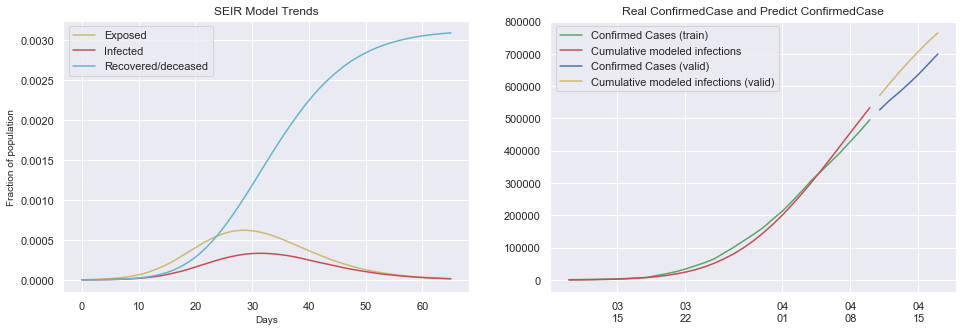

In [103]:
country = 'US'
country_pd_train = train[train['Country_Region']==country]
country_pd_train2 = country_pd_train.groupby(['Date']).sum().reset_index()
country_pd_train2['Date'] = pd.to_datetime(country_pd_train2['Date'], format='%Y-%m-%d')
a,b = fit_model_new(country_pd_train2,country,make_plot=True)


Validation MSLE: 0.05615, using Hill decay, Reproduction number(R0) : 5.73057, Fatal rate : 0.04303, K : 3.00000, L: 16.54629


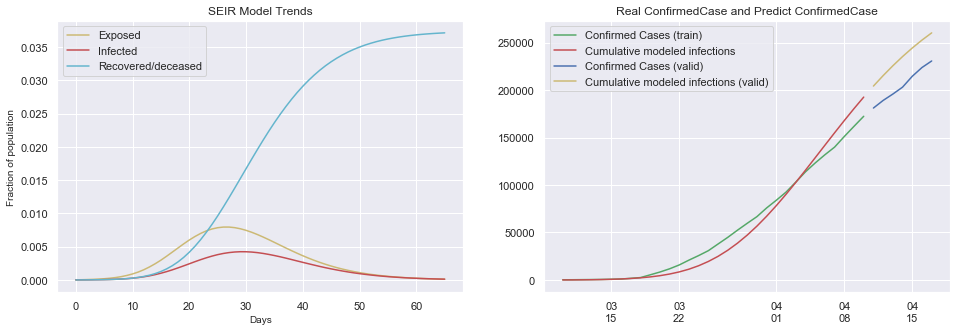

In [104]:
country = 'New York'
if country not in train['Country_Region'].unique():
    country_pd_train = train[train['Province_State']==country]
else:
    country_pd_train = train[train['Country_Region']==country]

a,b = fit_model_new(country_pd_train,country,make_plot=True)

Validation MSLE: 0.35864, using intervention days decay, Reproduction number(R0) : 2.82338, Fatal rate : 0.15000


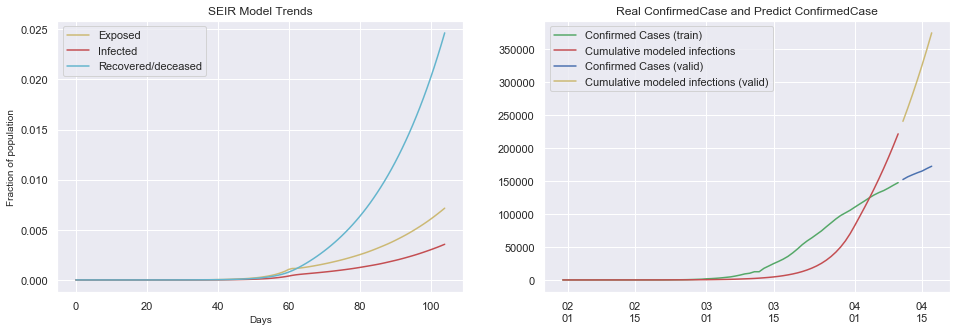

In [105]:
country = 'Italy'
if country not in train['Country_Region'].unique():
    country_pd_train = train[train['Province_State']==country]
else:
    country_pd_train = train[train['Country_Region']==country]

a,b = fit_model_new(country_pd_train,country,make_plot=True)

Validation MSLE: 0.03045, using Hill decay, Reproduction number(R0) : 4.21996, Fatal rate : 0.10967, K : 2.16500, L: 44.48562


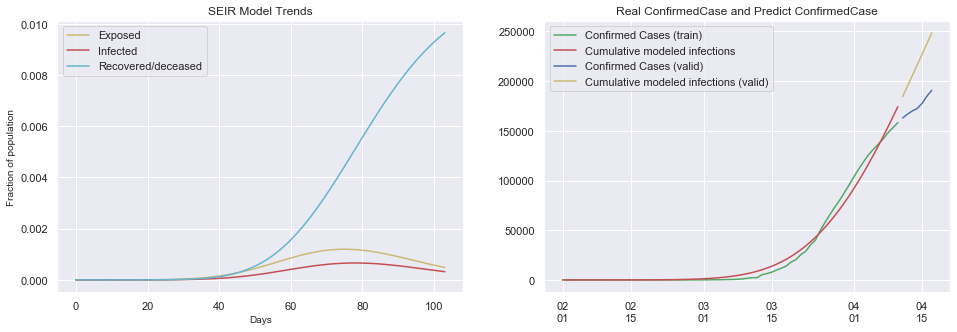

In [106]:
country = 'Spain'
if country not in train['Country_Region'].unique():
    country_pd_train = train[train['Province_State']==country]
else:
    country_pd_train = train[train['Country_Region']==country]

a,b = fit_model_new(country_pd_train,country,make_plot=True)

**Disclaimer:** The model is currently based on the current data that we have, the prediction will be more accurate as new data coming in and with further tuning.

## Predict all Country/Region and Province/States
* Counting all Country/Region MSLE & predict
* If MSLE is lower than 1 , using PR model to retrain and check the performance

In [107]:
validation_scores = []
validation_county = []
validation_country = []

test_seir = test.copy()

for country in tqdm(train['Country_Region'].unique()):
    country_pd_train = train[train['Country_Region']==country]
    #if country_pd_train['Province_State'].isna().unique()==True:
    if len(country_pd_train['Province_State'].unique())<2:
        predict_test, score = fit_model_new(country_pd_train,country,make_plot=False)
        if score ==0:
            print(f'{country} no case')
        validation_scores.append(score)
        validation_county.append(country)
        validation_country.append(country)
        test_seir.loc[test_seir['Country_Region']==country,'ConfirmedCases'] = predict_test['ConfirmedCases'].tolist()
        test_seir.loc[test_seir['Country_Region']==country,'Fatalities'] = predict_test['Fatalities'].tolist()
    else:
        for state in country_pd_train['Province_State'].unique():
            if state != state: # check nan
                state_pd = country_pd_train[country_pd_train['Province_State'].isna()]
                predict_test, score = fit_model_new(state_pd,state,make_plot=False)
                if score ==0:
                    print(f'{country} / {state} no case')
                validation_scores.append(score)
                validation_county.append(state)
                validation_country.append(country)
                test_seir.loc[(test_seir['Country_Region']==country)&(test_seir['Province_State'].isna()),'ConfirmedCases'] = predict_test['ConfirmedCases'].tolist()
                test_seir.loc[(test_seir['Country_Region']==country)&(test_seir['Province_State'].isna()),'Fatalities'] = predict_test['Fatalities'].tolist()
            else:
                state_pd = country_pd_train[country_pd_train['Province_State']==state]
                predict_test, score = fit_model_new(state_pd,state,make_plot=False)
                if score ==0:
                    print(f'{country} / {state} no case')
                validation_scores.append(score)
                validation_county.append(state)
                validation_country.append(country)
                test_seir.loc[(test_seir['Country_Region']==country)&(test_seir['Province_State']==state),'ConfirmedCases'] = predict_test['ConfirmedCases'].tolist()
                test_seir.loc[(test_seir['Country_Region']==country)&(test_seir['Province_State']==state),'Fatalities'] = predict_test['Fatalities'].tolist()
         #   print(f'{country} {state} {score:0.5f}')
            
print(f'Mean validation score: {np.average(validation_scores):0.5f}')

country not in population set, nan
country not in population set, Saint Pierre and Miquelon
country not in population set, nan
country not in population set, Malawi
country not in population set, Bonaire, Sint Eustatius and Saba
country not in population set, nan
country not in population set, Sao Tome and Principe
country not in population set, South Sudan
country not in population set, Falkland Islands (Malvinas)
country not in population set, nan
country not in population set, Western Sahara

Mean validation score: 0.08906


In [108]:
validation_scores = pd.DataFrame({'country/state':validation_country,'country':validation_county,'MSLE':validation_scores})
validation_scores.sort_values(by=['MSLE'], ascending=False).head(20)

,country/state,country,MSLE
232,Timor-Leste,Timor-Leste,1.686297
36,Cabo Verde,Cabo Verde,0.955329
219,Somalia,Somalia,0.773478
310,Western Sahara,Western Sahara,0.742323
35,Burundi,Burundi,0.656233
204,Russia,Russia,0.624201
177,Montenegro,Montenegro,0.600404
266,US,Nevada,0.556473
221,South Sudan,South Sudan,0.556332
187,New Zealand,New Zealand,0.491787


In [109]:
large_msle = validation_scores[validation_scores['MSLE']>1]

## Retrain PR model for MSLE>1 countries
* If MSLE of PR model lower than SEIR model, than use PR model as predict result

In [110]:
for country in large_msle['country'].unique():
    if (country!= country)==False: # check None
        #print ('training model for country ==>'+country)
        country_pd_train = train[train['Country_Region']==country]
        country_pd_test = test[test['Country_Region']==country]
        if len(country_pd_train)==0:
            country_pd_train = train[train['Province_State']==country]
            country_pd_test = test[test['Province_State']==country]

            x = np.array(range(len(country_pd_train))).reshape((-1,1))[:-7]
            valid_x = np.array(range(len(country_pd_train))).reshape((-1,1))[-7:]
            y = country_pd_train['ConfirmedCases'][:-7]
            valid_y = country_pd_train['ConfirmedCases'][-7:]
            y_fat = country_pd_train['Fatalities'][:-7]
            valid_y_fat = country_pd_train['Fatalities'][-7:]
            
            model = Pipeline([('poly', PolynomialFeatures(degree=2)),
                             ('linear', LinearRegression(fit_intercept=False))])
            model = model.fit(x, y)

            model_fat = Pipeline([('poly', PolynomialFeatures(degree=2)),
                             ('linear', LinearRegression(fit_intercept=False))])
            model_fat = model_fat.fit(x, y_fat)
            
            predict_y = model.predict(valid_x)
            predict_yfat = model_fat.predict(valid_x)
            score = mean_squared_log_error(np.clip(valid_y,0,np.inf), np.clip(predict_y,0,np.inf))
            score_fat = mean_squared_log_error(np.clip(valid_y_fat,0,np.inf), np.clip(predict_yfat,0,np.inf))
            score = (score+score_fat)/2

            print(f'{country} {score:0.5f}')
            if score < large_msle[large_msle['country']==country]['MSLE'].tolist()[0]:
                validation_scores.loc[validation_scores['country']==country,'MSLE'] = score
                predict_x = (np.array(range(len(country_pd_test)))+50).reshape((-1,1))
                test_seir.loc[test_seir['Province_State']==country,'ConfirmedCases'] = model.predict(predict_x)
                test_seir.loc[test_seir['Province_State']==country,'Fatalities'] = model_fat.predict(predict_x)
        else:
            x = np.array(range(len(country_pd_train))).reshape((-1,1))[:-7]
            valid_x = np.array(range(len(country_pd_train))).reshape((-1,1))[-7:]
            y = country_pd_train['ConfirmedCases'][:-7]
            valid_y = country_pd_train['ConfirmedCases'][-7:]
            y_fat = country_pd_train['Fatalities'][:-7]
            valid_y_fat = country_pd_train['Fatalities'][-7:]
            
            model = Pipeline([('poly', PolynomialFeatures(degree=2)),
                             ('linear', LinearRegression(fit_intercept=False))])
            model = model.fit(x, y)

            model_fat = Pipeline([('poly', PolynomialFeatures(degree=2)),
                             ('linear', LinearRegression(fit_intercept=False))])
            model_fat = model_fat.fit(x, y_fat)
            
            predict_y = model.predict(valid_x)
            predict_yfat = model_fat.predict(valid_x)
            score = mean_squared_log_error(np.clip(valid_y,0,np.inf), np.clip(predict_y,0,np.inf))
            score_fat = mean_squared_log_error(np.clip(valid_y_fat,0,np.inf), np.clip(predict_yfat,0,np.inf))
            score = (score+score_fat)/2

            print(f'{country} {score:0.5f}')
            if score < large_msle[large_msle['country']==country]['MSLE'].tolist()[0]:
                validation_scores.loc[validation_scores['country']==country,'MSLE'] = score
                predict_x = (np.array(range(len(country_pd_test)))+50).reshape((-1,1))
                test_seir.loc[test_seir['Country_Region']==country,'ConfirmedCases'] = model.predict(predict_x)
                test_seir.loc[test_seir['Country_Region']==country,'Fatalities'] = model_fat.predict(predict_x)
                

Timor-Leste 0.75289


#### Results

In [111]:
val_soces = validation_scores['MSLE'].tolist()
print(f'Mean validation score: {np.average(val_soces):0.5f}')

Mean validation score: 0.08608


In [112]:
submit1 = submit.copy()

submit1['Fatalities'] = round(test_seir['Fatalities'].astype('float'),0)
submit1['ConfirmedCases'] = round(test_seir['ConfirmedCases'].astype('float'),0)
submit1.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,13.0,2.0
13455,13456,13.0,2.0
13456,13457,13.0,2.0
13457,13458,13.0,2.0
13458,13459,13.0,2.0


In [113]:
submit1.to_csv('submission.csv',index=False)


## 3) Prediction

<a id='prediction'></a>

- For prediciton purpose, I will try mainly 3 predictive models (Random Forest, Multilinear Regression and Bayesian Ridge Regression) for each type of data, which I eventually assembled all different variables together to feed in the prediction models as well. 

- So far, the Random Forest Model with Weather Variables is having the best Public Score on Kaggle. However, I will continue to improve on the model performance in the next couple of days.

### Forecast with Original Data

<a id='original'></a>


- Extract month and dates

In [114]:
train_rfm = train.copy()

# Add additional variables
#month
train_rfm['month'] = train_rfm['Date'].dt.month

#date
train_rfm['dates'] = train_rfm['Date'].dt.day


### do the same for test data
test_rfm = test.copy()

# Add additional variables

#month
test_rfm['month'] = test_rfm['Date'].dt.month

#date
test_rfm['dates'] = test_rfm['Date'].dt.day


train_rfm.tail()


,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,month,dates
27226,35651,NaN,Zimbabwe,2020-04-13,17.0,3.0,4,13
27227,35652,NaN,Zimbabwe,2020-04-14,17.0,3.0,4,14
27228,35653,NaN,Zimbabwe,2020-04-15,23.0,3.0,4,15
27229,35654,NaN,Zimbabwe,2020-04-16,23.0,3.0,4,16
27230,35655,NaN,Zimbabwe,2020-04-17,24.0,3.0,4,17


- Calculate days from first outbreak 

In [115]:
countries_array = train['Country_Region'].unique()

train_first_result = pd.DataFrame()

for i in countries_array:
    # get relevant data 
    day_first_outbreak = train_rfm.loc[train_rfm['Country_Region']==i]
    
    date_outbreak = day_first_outbreak.loc[day_first_outbreak['ConfirmedCases']>0]['Date'].min()
    
    #Calculate days since first outbreak happened
    day_first_outbreak['days_since_first_outbreak'] = (day_first_outbreak['Date'] - date_outbreak).astype('timedelta64[D]')

    
    #impute the negative days with 0
    day_first_outbreak['days_since_first_outbreak'][day_first_outbreak['days_since_first_outbreak']<0] = 0 
   
    train_first_result = train_first_result.append(day_first_outbreak,ignore_index=True)


### do the same for test data

test_first_result = pd.DataFrame()

for i in countries_array:
    # get relevant data 
    day_first_outbreak = test_rfm.loc[test_rfm['Country_Region']==i]
    
    day_first_outbreak_train = train_rfm.loc[train_rfm['Country_Region']==i]
    
    date_outbreak = day_first_outbreak_train.loc[day_first_outbreak_train['ConfirmedCases']>0]['Date'].min()
    
    #Calculate days since first outbreak happened
    day_first_outbreak['days_since_first_outbreak'] = (day_first_outbreak['Date'] - date_outbreak).astype('timedelta64[D]')

    
    #impute the negative days with 0
    day_first_outbreak['days_since_first_outbreak'][day_first_outbreak['days_since_first_outbreak']<0] = 0 
   
    test_first_result = test_first_result.append(day_first_outbreak,ignore_index=True)


test_first_result.tail()


,ForecastId,Province_State,Country_Region,Date,month,dates,days_since_first_outbreak
13454,13455,NaN,Zimbabwe,2020-05-10,5,10,51.0
13455,13456,NaN,Zimbabwe,2020-05-11,5,11,52.0
13456,13457,NaN,Zimbabwe,2020-05-12,5,12,53.0
13457,13458,NaN,Zimbabwe,2020-05-13,5,13,54.0
13458,13459,NaN,Zimbabwe,2020-05-14,5,14,55.0


- Encode countries

In [116]:
#ecoding countries data

#train
labels, values = pd.factorize(train_first_result['Country_Region'])

train_first_result['country_id'] = labels

train_first_result.head()

#test

labels, values = pd.factorize(test_first_result['Country_Region'])

test_first_result['country_id'] = labels

test_first_result.head()

,ForecastId,Province_State,Country_Region,Date,month,dates,days_since_first_outbreak,country_id
0,1,NaN,Afghanistan,2020-04-02,4,2,38.0,0
1,2,NaN,Afghanistan,2020-04-03,4,3,39.0,0
2,3,NaN,Afghanistan,2020-04-04,4,4,40.0,0
3,4,NaN,Afghanistan,2020-04-05,4,5,41.0,0
4,5,NaN,Afghanistan,2020-04-06,4,6,42.0,0


### Random Forest Model

<a id='original_rf'></a>


In [117]:
random.seed(123)

X = train_first_result[['country_id','month','dates','days_since_first_outbreak']]

y_confirm = train_first_result['ConfirmedCases']
y_fatal = train_first_result['Fatalities']

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_confirm, test_size=0.3, random_state=0)


#RF model
rf = RandomForestClassifier()

predict_labels = X.columns

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")

# Print the name and gini importance of each feature
for feature in zip(predict_labels, rf.feature_importances_):
    print(feature)
    

Mean Absolute Error: 1470.37
Mean Squared Error: 105941962.78
Root Mean Squared Error: 10292.81 

('country_id', 0.3075913427579785)
('month', 0.07965147108632134)
('dates', 0.1656748713164441)
('days_since_first_outbreak', 0.4470823148392562)


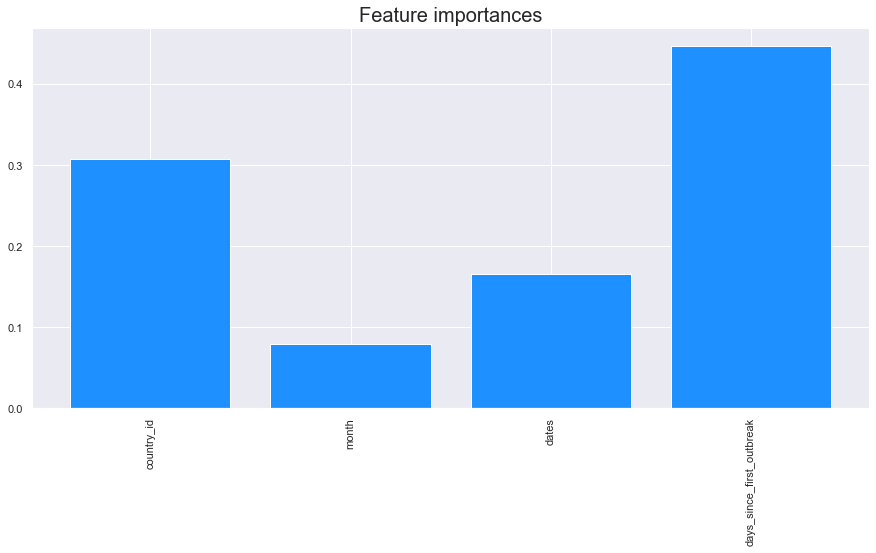

In [118]:
sns.set(rc={'figure.figsize':(15, 7)})

plt.figure()

plt.title("Feature importances",fontsize=20)

plt.bar(predict_labels,rf.feature_importances_, align="center", color='dodgerblue')

plt.xticks(predict_labels)

plt.xticks(rotation=90)

plt.show()

In [119]:

## predict on test set

confirm_case = rf.predict(test_first_result[['country_id','month','dates','days_since_first_outbreak']])


In [120]:

random.seed(123)

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_fatal, test_size=0.3, random_state=0)

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")

## predict on test set

fatal_case = rf.predict(test_first_result[['country_id','month','dates','days_since_first_outbreak']])


Mean Absolute Error: 53.35
Mean Squared Error: 430981.23
Root Mean Squared Error: 656.49 



In [121]:

forecaseId = pd.DataFrame(test[['ForecastId']])
confirm_case = pd.DataFrame(confirm_case)
fatal_case = pd.DataFrame(fatal_case)


final_result_rf = pd.concat([forecaseId,confirm_case,fatal_case],axis=1)
final_result_rf.columns = ['ForecastId','ConfirmedCases','Fatalities']

final_result_rf.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,11.0,2.0
13455,13456,374.0,2.0
13456,13457,17.0,2.0
13457,13458,17.0,2.0
13458,13459,17.0,2.0


In [122]:
final_result_rf.to_csv('results_rfm.csv', index = False)

### Let's try to run for each country

In [123]:
# function that apply Random Forest for each country in the data

def rf_each_country(seed, original_df, train_df, test_df, confirm , 
                    fatal, xlabels, test_size = 0.3):

    random.seed(seed)

    countries_array = original_df['Country_Region'].unique()

    final_result = pd.DataFrame()
    
    confirm_test_case = pd.DataFrame()
    fatal_test_case = pd.DataFrame()
    
    confirm_val = pd.DataFrame()
    fatal_val = pd.DataFrame()

    ##predict confirmed cases
    for i in countries_array:
        # get relevant data 
        train_set = train_df.loc[train_df['Country_Region']==i]
        test_set = test_df.loc[test_df['Country_Region']==i]


        #Confirm case
        X1 = train_set[xlabels]
        y1 = train_set[confirm]

        #train test split
        X_train_rf1, X_test_rf1, y_train_rf1, y_test_rf1 = train_test_split(X1, y1, test_size=0.3, random_state=0)

        #RF model
        rf1 = RandomForestClassifier()

        # Train the classifier
        rf1.fit(X_train_rf1, y_train_rf1)
        
        test_confirm = rf1.predict(X_test_rf1)

        ## predict on test set

        confirm_case = rf1.predict(test_set[xlabels])


        #Fatal case
        X2 = train_set[xlabels]
        y2 = train_set[fatal]

        #train test split
        X_train_rf2, X_test_rf2, y_train_rf2, y_test_rf2 = train_test_split(X2, y2, test_size=0.3, random_state=0)

        #RF model
        rf2 = RandomForestClassifier()

        # Train the classifier
        rf2.fit(X_train_rf2, y_train_rf2)
        
        test_fatal = rf2.predict(X_test_rf2)

        ## predict on test set

        fatal_case = rf2.predict(test_set[xlabels])
        
        
        ## combine them together and meausre RMSE
        test_confirm = pd.DataFrame(test_confirm)
        test_fatal = pd.DataFrame(test_fatal)
        
        y_test_rf1 = pd.DataFrame(y_test_rf1)
        y_test_rf2 = pd.DataFrame(y_test_rf2)
        
        
        confirm_test_case = confirm_test_case.append(test_confirm)
        fatal_test_case = fatal_test_case.append(test_fatal)
        
        confirm_val = confirm_val.append(y_test_rf1)
        fatal_val = fatal_val.append(y_test_rf2)
        
        
        ### Combine results
        
        confirm_case = pd.DataFrame(confirm_case)
        fatal_case = pd.DataFrame(fatal_case)

        final_result_pred = pd.concat([confirm_case,fatal_case],axis=1)

        final_result_pred.columns = ['ConfirmedCases','Fatalities']
        
        final_result = final_result.append(final_result_pred, ignore_index=True)
    
    
    ##Print out validation metrics
    
    confirm_test_case = np.array(confirm_test_case)
    fatal_test_case = np.array(fatal_test_case)
    
    
    confirm_va1 = np.array(confirm_val)
    fatal_val1 = np.array(fatal_val)
    

    print('Mean Absolute Error for Confirmed Case Prediction:', round(metrics.mean_absolute_error(confirm_va1, confirm_test_case),2))  
    print('Mean Squared Error for Confirmed Case Prediction:', round(metrics.mean_squared_error(confirm_va1, confirm_test_case),2))  
    print('Root Mean Squared Error for Confirmed Case Prediction:', round(np.sqrt(metrics.mean_squared_error(confirm_va1, confirm_test_case)),2), "\n")


    print('Mean Absolute Error for Fatal Case Prediction:', round(metrics.mean_absolute_error(fatal_val1, fatal_test_case),2))  
    print('Mean Squared Error for Fatal Case Prediction:', round(metrics.mean_squared_error(fatal_val1, fatal_test_case),2))  
    print('Root Mean Squared Error for Fatal Case Prediction:', round(np.sqrt(metrics.mean_squared_error(fatal_val1, fatal_test_case)),2), "\n")

    
    #compile with prediction IDs
    
    forecaseId = pd.DataFrame(test[['ForecastId']])

    final_result = pd.concat([forecaseId,final_result],axis=1)

    return final_result


In [124]:

x_pred_lab = ['month','dates','days_since_first_outbreak']

final_result_rf_each = rf_each_country(seed=123, original_df=train, train_df=train_first_result, 
                                       test_df=test_first_result, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)



Mean Absolute Error for Confirmed Case Prediction: 976.82
Mean Squared Error for Confirmed Case Prediction: 56973639.2
Root Mean Squared Error for Confirmed Case Prediction: 7548.09 

Mean Absolute Error for Fatal Case Prediction: 39.58
Mean Squared Error for Fatal Case Prediction: 224413.77
Root Mean Squared Error for Fatal Case Prediction: 473.72 



In [125]:
final_result_rf_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,17.0,3.0
13455,13456,14.0,3.0
13456,13457,14.0,3.0
13457,13458,17.0,3.0
13458,13459,17.0,3.0


In [126]:
final_result_rf_each.to_csv('result_rf_each.csv',index=False)

### Multilinear Regression

<a id='original_lin'></a>


In [127]:
#construct the OLS model
X = train_first_result[['country_id','month','dates','days_since_first_outbreak']]
y_confirm = train_first_result['ConfirmedCases']
y_fatal = train_first_result['Fatalities']

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train, X_test, y_train, y_test = train_test_split(X, y_confirm, test_size=0.3, random_state=0)

X_train  = np.array(X_train)
X_test = np.array(X_test)
y_train  = np.array(y_train)
y_test  = np.array(y_test)

# Note the difference in argument order
model = LinearRegression()

model.fit(X_train,y_train)

predictions = model.predict(X_test) # make the predictions by the model

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test, predictions),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test, predictions),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test, predictions)),2))
    

Mean Absolute Error: 2452.06
Mean Squared Error: 90344927.74
Root Mean Squared Error: 9504.99


In [128]:

confirm_case = model.predict(
    test_first_result[['country_id','month','dates','days_since_first_outbreak']]) # make the predictions by the model


In [129]:
#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_fatal, test_size=0.3, random_state=0)

X_train  = np.array(X_train)
X_test = np.array(X_test)
y_train  = np.array(y_train)
y_test  = np.array(y_test)

# Note the difference in argument order
model = LinearRegression()

model.fit(X_train,y_train)

predictions = model.predict(X_test) # make the predictions by the model

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test, predictions),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test, predictions),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test, predictions)),2))
   

Mean Absolute Error: 2452.06
Mean Squared Error: 90344927.74
Root Mean Squared Error: 9504.99


In [130]:

fatal_case = model.predict(
    test_first_result[['country_id','month','dates','days_since_first_outbreak']]) # make the predictions by the model


In [131]:
forecaseId = pd.DataFrame(test[['ForecastId']])
confirm_case = round(pd.DataFrame(confirm_case),0)
fatal_case = round(pd.DataFrame(fatal_case),0)


final_result_lin = pd.concat([forecaseId,confirm_case,fatal_case],axis=1)
final_result_lin.columns = ['ForecastId','ConfirmedCases','Fatalities']

final_result_lin.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,5879.0,5879.0
13455,13456,5964.0,5964.0
13456,13457,6049.0,6049.0
13457,13458,6134.0,6134.0
13458,13459,6219.0,6219.0


In [132]:
final_result_lin.to_csv('results_lin.csv',index=False)

### Let's try to run for each country

In [133]:
# function that apply Linear Regression for each country in the data

def lin_each_country(seed, original_df, train_df, test_df, confirm , 
                    fatal, xlabels, test_size = 0.3):

    random.seed(seed)

    countries_array = original_df['Country_Region'].unique()

    final_result = pd.DataFrame()
    
    confirm_test_case = pd.DataFrame()
    fatal_test_case = pd.DataFrame()
    
    confirm_val = pd.DataFrame()
    fatal_val = pd.DataFrame()

    ##predict confirmed cases
    for i in countries_array:
        # get relevant data 
        train_set = train_df.loc[train_df['Country_Region']==i]
        test_set = test_df.loc[test_df['Country_Region']==i]


        #Confirm case
        X1 = train_set[xlabels]
        y1 = train_set[confirm]

        #train test split
        X_train_rf1, X_test_rf1, y_train_rf1, y_test_rf1 = train_test_split(X1, y1, test_size=0.3, random_state=0)

        X_train_rf1  = np.array(X_train_rf1)
        X_test_rf1 = np.array(X_test_rf1)
        y_train_rf1  = np.array(y_train_rf1)
        y_test_rf1  = np.array(y_test_rf1)

        # Note the difference in argument order
        model = LinearRegression()

        model.fit(X_train_rf1,y_train_rf1)

        test_confirm = model.predict(X_test_rf1) # make the predictions by the model

        
        ## predict on test set

        confirm_case = model.predict(test_set[xlabels])


        #Fatal case
        X2 = train_set[xlabels]
        y2 = train_set[fatal]

        #train test split
        X_train_rf2, X_test_rf2, y_train_rf2, y_test_rf2 = train_test_split(X2, y2, test_size=0.3, random_state=0)

        X_train_rf2  = np.array(X_train_rf2)
        X_test_rf2 = np.array(X_test_rf2)
        y_train_rf2  = np.array(y_train_rf2)
        y_test_rf2  = np.array(y_test_rf2)

        # Note the difference in argument order
        model = LinearRegression()

        model.fit(X_train_rf2,y_train_rf2)

        test_fatal = model.predict(X_test_rf2) # make the predictions by the model

        
        ## predict on test set

        fatal_case = model.predict(test_set[xlabels])
        
        
        ## combine them together and meausre RMSE
        test_confirm = pd.DataFrame(test_confirm)
        test_fatal = pd.DataFrame(test_fatal)
        
        y_test_rf1 = pd.DataFrame(y_test_rf1)
        y_test_rf2 = pd.DataFrame(y_test_rf2)
        
        
        confirm_test_case = confirm_test_case.append(test_confirm)
        fatal_test_case = fatal_test_case.append(test_fatal)
        
        confirm_val = confirm_val.append(y_test_rf1)
        fatal_val = fatal_val.append(y_test_rf2)
        
        
        ### Combine results
        
        confirm_case = round(pd.DataFrame(confirm_case),0)
        fatal_case = round(pd.DataFrame(fatal_case),0)

        final_result_pred = pd.concat([confirm_case,fatal_case],axis=1)

        final_result_pred.columns = ['ConfirmedCases','Fatalities']
        
        final_result = final_result.append(final_result_pred, ignore_index=True)
    
    
    ##Print out validation metrics
    
    confirm_test_case = np.array(confirm_test_case)
    fatal_test_case = np.array(fatal_test_case)
    
    
    confirm_va1 = np.array(confirm_val)
    fatal_val1 = np.array(fatal_val)
    

    print('Mean Absolute Error for Confirmed Case Prediction:', round(metrics.mean_absolute_error(confirm_va1, confirm_test_case),2))  
    print('Mean Squared Error for Confirmed Case Prediction:', round(metrics.mean_squared_error(confirm_va1, confirm_test_case),2))  
    print('Root Mean Squared Error for Confirmed Case Prediction:', round(np.sqrt(metrics.mean_squared_error(confirm_va1, confirm_test_case)),2), "\n")


    print('Mean Absolute Error for Fatal Case Prediction:', round(metrics.mean_absolute_error(fatal_val1, fatal_test_case),2))  
    print('Mean Squared Error for Fatal Case Prediction:', round(metrics.mean_squared_error(fatal_val1, fatal_test_case),2))  
    print('Root Mean Squared Error for Fatal Case Prediction:', round(np.sqrt(metrics.mean_squared_error(fatal_val1, fatal_test_case)),2), "\n")

    
    #compile with prediction IDs
    
    forecaseId = pd.DataFrame(test[['ForecastId']])

    final_result = pd.concat([forecaseId,final_result],axis=1)

    return final_result


In [134]:
x_pred_lab = ['month','dates','days_since_first_outbreak']

final_result_lin_each = lin_each_country(seed=123, original_df=train, train_df=train_first_result, 
                                       test_df=test_first_result, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)




Mean Absolute Error for Confirmed Case Prediction: 1486.19
Mean Squared Error for Confirmed Case Prediction: 44641781.23
Root Mean Squared Error for Confirmed Case Prediction: 6681.45 

Mean Absolute Error for Fatal Case Prediction: 96.77
Mean Squared Error for Fatal Case Prediction: 282905.74
Root Mean Squared Error for Fatal Case Prediction: 531.89 



In [135]:
final_result_lin_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,35.0,6.0
13455,13456,36.0,6.0
13456,13457,37.0,6.0
13457,13458,37.0,7.0
13458,13459,38.0,7.0


In [136]:
final_result_lin_each.to_csv("result_lin_each.csv",index=False)

### Baysian Ridge Model

<a id='original_br'></a>


In [137]:

X = train_first_result[['country_id','month','dates','days_since_first_outbreak']]
y_confirm = train_first_result['ConfirmedCases']
y_fatal = train_first_result['Fatalities']


#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_br, X_test_br, y_train_br, y_test_br = train_test_split(X, y_confirm, test_size=0.3, random_state=0)

predict_labels = X.columns

clf = BayesianRidge(compute_score=True)
clf.fit(X_train_br, y_train_br)

y_pred_br = clf.predict(X_test_br)


print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_br, y_pred_br),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_br, y_pred_br),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_br, y_pred_br)),2))


Mean Absolute Error: 2444.37
Mean Squared Error: 90395613.52
Root Mean Squared Error: 9507.66


In [138]:
## predict on test set

confirm_case = clf.predict(test_first_result[['country_id','month','dates','days_since_first_outbreak']])



In [139]:

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_br, X_test_br, y_train_br, y_test_br = train_test_split(X, y_fatal, test_size=0.3, random_state=0)

predict_labels = X.columns

clf = BayesianRidge(compute_score=True)
clf.fit(X_train_br, y_train_br)

y_pred_br = clf.predict(X_test_br)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_br, y_pred_br),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_br, y_pred_br),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_br, y_pred_br)),2))



Mean Absolute Error: 161.43
Mean Squared Error: 616357.15
Root Mean Squared Error: 785.08


In [140]:
## predict on test set

fatal_case = clf.predict(test_first_result[['country_id','month','dates','days_since_first_outbreak']])



In [141]:
forecaseId = pd.DataFrame(test[['ForecastId']])
confirm_case = round(pd.DataFrame(confirm_case),0)
fatal_case = round(pd.DataFrame(fatal_case),0)


final_result_br = pd.concat([forecaseId,confirm_case,fatal_case],axis=1)
final_result_br.columns = ['ForecastId','ConfirmedCases','Fatalities']

final_result_br.tail()


,ForecastId,ConfirmedCases,Fatalities
13454,13455,5660.0,353.0
13455,13456,5742.0,358.0
13456,13457,5824.0,364.0
13457,13458,5906.0,369.0
13458,13459,5989.0,375.0


In [142]:
final_result_br.to_csv('results_br.csv', index = False)

### Let's try for each country

In [143]:
# function that apply Bayesian Regression for each country in the data

def br_each_country(seed, original_df, train_df, test_df, confirm , 
                    fatal, xlabels, test_size = 0.3):

    random.seed(seed)

    countries_array = original_df['Country_Region'].unique()

    final_result = pd.DataFrame()
    
    confirm_test_case = pd.DataFrame()
    fatal_test_case = pd.DataFrame()
    
    confirm_val = pd.DataFrame()
    fatal_val = pd.DataFrame()

    ##predict confirmed cases
    for i in countries_array:
        # get relevant data 
        train_set = train_df.loc[train_df['Country_Region']==i]
        test_set = test_df.loc[test_df['Country_Region']==i]


        #Confirm case
        X1 = train_set[xlabels]
        y1 = train_set[confirm]

        #train test split
        X_train_rf1, X_test_rf1, y_train_rf1, y_test_rf1 = train_test_split(X1, y1, test_size=0.3, random_state=0)

        #Bayesian Ridge Model
        clf = BayesianRidge(compute_score=True)
        
        ##train
        clf.fit(X_train_rf1, y_train_rf1)

        test_confirm = clf.predict(X_test_rf1)
  
        ## predict on test set

        confirm_case = clf.predict(test_set[xlabels])


        #Fatal case
        X2 = train_set[xlabels]
        y2 = train_set[fatal]

        #train test split
        X_train_rf2, X_test_rf2, y_train_rf2, y_test_rf2 = train_test_split(X2, y2, test_size=0.3, random_state=0)
        
        #Bayesian Ridge Model
        clf = BayesianRidge(compute_score=True)
        
        ##train
        clf.fit(X_train_rf2, y_train_rf2)

        test_fatal = clf.predict(X_test_rf2)

        ## predict on test set

        fatal_case = clf.predict(test_set[xlabels])
        
        
        ## combine them together and meausre RMSE
        test_confirm = pd.DataFrame(test_confirm)
        test_fatal = pd.DataFrame(test_fatal)
        
        y_test_rf1 = pd.DataFrame(y_test_rf1)
        y_test_rf2 = pd.DataFrame(y_test_rf2)
        
        
        confirm_test_case = confirm_test_case.append(test_confirm)
        fatal_test_case = fatal_test_case.append(test_fatal)
        
        confirm_val = confirm_val.append(y_test_rf1)
        fatal_val = fatal_val.append(y_test_rf2)
        
        
        ### Combine results
        
        confirm_case = round(pd.DataFrame(confirm_case),0)
        fatal_case = round(pd.DataFrame(fatal_case),0)

        final_result_pred = pd.concat([confirm_case,fatal_case],axis=1)

        final_result_pred.columns = ['ConfirmedCases','Fatalities']
        
        final_result = final_result.append(final_result_pred, ignore_index=True)
    
    
    ##Print out validation metrics
    
    confirm_test_case = np.array(confirm_test_case)
    fatal_test_case = np.array(fatal_test_case)
    
    
    confirm_va1 = np.array(confirm_val)
    fatal_val1 = np.array(fatal_val)
    

    print('Mean Absolute Error for Confirmed Case Prediction:', round(metrics.mean_absolute_error(confirm_va1, confirm_test_case),2))  
    print('Mean Squared Error for Confirmed Case Prediction:', round(metrics.mean_squared_error(confirm_va1, confirm_test_case),2))  
    print('Root Mean Squared Error for Confirmed Case Prediction:', round(np.sqrt(metrics.mean_squared_error(confirm_va1, confirm_test_case)),2), "\n")


    print('Mean Absolute Error for Fatal Case Prediction:', round(metrics.mean_absolute_error(fatal_val1, fatal_test_case),2))  
    print('Mean Squared Error for Fatal Case Prediction:', round(metrics.mean_squared_error(fatal_val1, fatal_test_case),2))  
    print('Root Mean Squared Error for Fatal Case Prediction:', round(np.sqrt(metrics.mean_squared_error(fatal_val1, fatal_test_case)),2), "\n")

    
    #compile with prediction IDs
    
    forecaseId = pd.DataFrame(test[['ForecastId']])

    final_result = pd.concat([forecaseId,final_result],axis=1)

    return final_result


In [144]:
x_pred_lab = ['month','dates','days_since_first_outbreak']

final_result_br_each = br_each_country(seed=123, original_df=train, train_df=train_first_result, 
                                       test_df=test_first_result, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)




Mean Absolute Error for Confirmed Case Prediction: 1529.71
Mean Squared Error for Confirmed Case Prediction: 46821073.74
Root Mean Squared Error for Confirmed Case Prediction: 6842.59 

Mean Absolute Error for Fatal Case Prediction: 99.62
Mean Squared Error for Fatal Case Prediction: 308472.11
Root Mean Squared Error for Fatal Case Prediction: 555.4 



In [145]:
final_result_br_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,35.0,6.0
13455,13456,36.0,6.0
13456,13457,37.0,6.0
13457,13458,37.0,7.0
13458,13459,38.0,7.0


In [146]:
final_result_br_each.to_csv("result_br_each.csv",index=False)

## Weather Data

<a id='weather_predict'></a>


In [147]:
weather_train = weather_data.copy()

# Add additional variables
#month
weather_train['month'] = weather_train['Date'].dt.month

#date
weather_train['dates'] = weather_train['Date'].dt.day


### do the same for test data
weather_test1 = weather_test.copy()

# Add additional variables

#month
weather_test1['month'] = weather_test1['Date'].dt.month

#date
weather_test1['dates'] = weather_test1['Date'].dt.day


weather_test1.tail()

,ForecastId,ForecastId.1,Province_State,Country_Region,Date,country+province,Lat,Long,day_from_jan_first,temp,min,max,stp,wdsp,prcp,fog,month,dates
13454,13454,13455,NaN,Zimbabwe,2020-05-10,Zimbabwe-,-17.829167,31.052222,10,74.4,64.4,82.4,999.9,6.2,0.00,1,5,10
13455,13455,13456,NaN,Zimbabwe,2020-05-11,Zimbabwe-,-17.829167,31.052222,11,68.5,62.6,75.2,999.9,5.4,0.00,0,5,11
13456,13456,13457,NaN,Zimbabwe,2020-05-12,Zimbabwe-,-17.829167,31.052222,12,67.2,62.6,80.1,999.9,4.1,99.99,1,5,12
13457,13457,13458,NaN,Zimbabwe,2020-05-13,Zimbabwe-,-17.829167,31.052222,13,69.1,60.6,80.6,999.9,5.8,99.99,1,5,13
13458,13458,13459,NaN,Zimbabwe,2020-05-14,Zimbabwe-,-17.829167,31.052222,14,69.9,64.0,76.8,999.9,6.6,0.00,0,5,14


In [148]:
#ecoding countries data

#train
labels, values = pd.factorize(weather_train['Country_Region'])

weather_train['country_id'] = labels

weather_train.head()

#test

labels, values = pd.factorize(weather_test1['Country_Region'])

weather_test1['country_id'] = labels

weather_test1.head()

,ForecastId,ForecastId.1,Province_State,Country_Region,Date,country+province,Lat,Long,day_from_jan_first,temp,min,max,stp,wdsp,prcp,fog,month,dates,country_id
0,0,1,NaN,Afghanistan,2020-04-02,Afghanistan-,33.0,65.0,93,47.6,30.9,57.6,776.8,4.3,0.04,1,4,2,0
1,1,2,NaN,Afghanistan,2020-04-03,Afghanistan-,33.0,65.0,94,48.7,37.8,59.9,777.7,4.9,0.08,0,4,3,0
2,2,3,NaN,Afghanistan,2020-04-04,Afghanistan-,33.0,65.0,95,44.7,37.2,57.2,777.4,5.8,0.00,1,4,4,0
3,3,4,NaN,Afghanistan,2020-04-05,Afghanistan-,33.0,65.0,96,45.5,34.3,58.8,777.5,5.7,0.16,1,4,5,0
4,4,5,NaN,Afghanistan,2020-04-06,Afghanistan-,33.0,65.0,97,40.4,31.5,52.9,776.5,5.8,0.94,1,4,6,0


### Random Forest Model

<a id='weather_rf'></a>


In [149]:
random.seed(123)

X = weather_train[['country_id','Lat', 'Long','day_from_jan_first', 'temp', 'stp', 'wdsp', 'prcp','fog', 'month', 'dates']]

y_confirm = weather_train['ConfirmedCases']

y_fatal = weather_train['Fatalities']


#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_confirm, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)


print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")


# Print the name and gini importance of each feature
for feature in zip(predict_labels, rf.feature_importances_):
    print(feature)
    

Mean Absolute Error: 561.17
Mean Squared Error: 42748256.21
Root Mean Squared Error: 6538.22 

('country_id', 0.07520873378211504)
('Lat', 0.10039452014829747)
('Long', 0.12946857303594728)
('day_from_jan_first', 0.1821235865642325)
('temp', 0.10487396575546121)
('stp', 0.11730049164423711)
('wdsp', 0.09173787664581612)
('prcp', 0.02873678262226075)
('fog', 0.017067613648671917)
('month', 0.07497969165060717)
('dates', 0.07810816450235349)


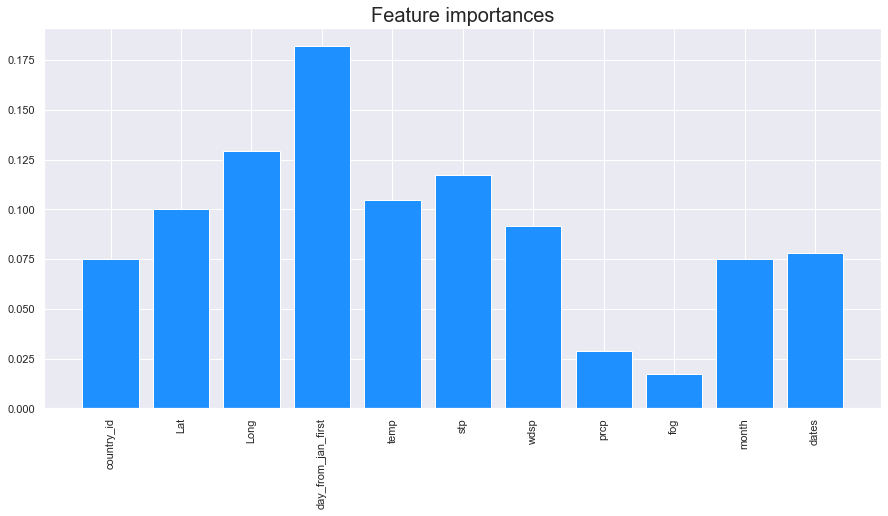

In [150]:
plt.figure()

plt.title("Feature importances",fontsize=20)

plt.bar(predict_labels,rf.feature_importances_, align="center", color='dodgerblue')

plt.xticks(predict_labels)

plt.xticks(rotation=90)

plt.show()

In [151]:

## predict on test set

confirm_case = rf.predict(weather_test1[['country_id','Lat', 'Long','day_from_jan_first', 'temp',
                                         'stp', 'wdsp', 'prcp','fog','month', 'dates']])


In [152]:
random.seed(123)

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_fatal, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")

## predict on test set

fatal_case = rf.predict(weather_test1[['country_id','Lat', 'Long','day_from_jan_first', 'temp',
                                         'stp', 'wdsp', 'prcp','fog', 'month', 'dates']])


Mean Absolute Error: 19.36
Mean Squared Error: 88774.82
Root Mean Squared Error: 297.95 



In [153]:

forecaseId = pd.DataFrame(test[['ForecastId']])
confirm_case = pd.DataFrame(confirm_case)
fatal_case = pd.DataFrame(fatal_case)


final_result_rf = pd.concat([forecaseId,confirm_case,fatal_case],axis=1)
final_result_rf.columns = ['ForecastId','ConfirmedCases','Fatalities']

final_result_rf.tail()


,ForecastId,ConfirmedCases,Fatalities
13454,13455,0.0,0.0
13455,13456,0.0,0.0
13456,13457,0.0,0.0
13457,13458,0.0,0.0
13458,13459,0.0,0.0


In [154]:
final_result_rf.to_csv('results_rf_weather.csv', index = False)

### Let's try to apply the model for each countries and then append them together

In [155]:
x_pred_lab = ['Lat', 'Long','day_from_jan_first', 'temp', 'stp', 'wdsp', 'prcp','fog','month', 'dates']

final_result_rf_weather_each = rf_each_country(seed=123, original_df=weather_train, train_df=weather_train, test_df=weather_test1, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 323.11
Mean Squared Error for Confirmed Case Prediction: 11876763.77
Root Mean Squared Error for Confirmed Case Prediction: 3446.27 

Mean Absolute Error for Fatal Case Prediction: 16.66
Mean Squared Error for Fatal Case Prediction: 54964.64
Root Mean Squared Error for Fatal Case Prediction: 234.45 



In [156]:
final_result_rf_weather_each.to_csv('submission.csv',index=False)

### Multilinear Regression

<a id='weather_lin'></a>


In [157]:
#run for each country
x_pred_lab = ['Lat', 'Long','day_from_jan_first', 'temp', 'stp', 'wdsp', 'prcp','fog','month', 'dates']

final_result_lin_weather_each = lin_each_country(seed=123, original_df=weather_train, train_df=weather_train, test_df=weather_test1, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1748.3
Mean Squared Error for Confirmed Case Prediction: 44815028.06
Root Mean Squared Error for Confirmed Case Prediction: 6694.4 

Mean Absolute Error for Fatal Case Prediction: 110.82
Mean Squared Error for Fatal Case Prediction: 274758.77
Root Mean Squared Error for Fatal Case Prediction: 524.17 



In [158]:
final_result_lin_weather_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,-438.0,-73.0
13455,13456,-439.0,-73.0
13456,13457,-438.0,-73.0
13457,13458,-438.0,-73.0
13458,13459,-439.0,-73.0


In [159]:
final_result_lin_weather_each.to_csv('final_result_lin_weather_each.csv',index=False)

### Baysian Ridge Regression Model

<a id='weather_br'></a>


In [160]:
#run for each country
x_pred_lab = ['Lat', 'Long','day_from_jan_first', 'temp', 'stp', 'wdsp', 
                   'prcp','fog', 'month', 'dates']

final_result_br_weather_each = br_each_country(seed=123, original_df=weather_train, train_df=weather_train, test_df=weather_test1, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1750.1
Mean Squared Error for Confirmed Case Prediction: 44910323.12
Root Mean Squared Error for Confirmed Case Prediction: 6701.52 

Mean Absolute Error for Fatal Case Prediction: 108.98
Mean Squared Error for Fatal Case Prediction: 275469.31
Root Mean Squared Error for Fatal Case Prediction: 524.85 



In [161]:
final_result_br_weather_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,17.0,3.0
13455,13456,17.0,3.0
13456,13457,18.0,3.0
13457,13458,18.0,3.0
13458,13459,18.0,3.0


In [162]:
final_result_br_weather_each.to_csv('final_result_br_weather_each.csv',index=False)

## Distance to the first case

<a id='distance'></a>


### Calculate the distance from Data center to each ip_address

*Refer to this math guide:*

*https://janakiev.com/blog/gps-points-distance-python/*

*https://kanoki.org/2019/02/14/how-to-find-distance-between-two-points-based-on-latitude-and-longitude-using-python-and-sql/*

In [163]:
import math
from math import radians, cos, sin, asin, sqrt

In [164]:
def distance(org_lat,org_lon, dest_lat, dest_lon):
    
    r = 3959 # miles
    # for km, we use r = 6371
    
    org_lat, org_lon, dest_lat, dest_lon = map(radians,[org_lat, org_lon, dest_lat, dest_lon])
    dlon = dest_lon - org_lon 
    dlat = dest_lat - org_lat 
    
    a = sin(dlat/2)**2 + cos(org_lat) * cos(dest_lat) * sin(dlon/2)**2
    
    c = 2 * asin(sqrt(a)) 
    
    return c * r


- In Europe: France (46.2276,2.2137)
- In America: US (37.0902,-95.7129)
- In Asia: China, Wuhan (30.5928,114.3055)

In [165]:

complete_distance = complete_data.copy()

complete_distance['france_lat'] = 46.2276
complete_distance['france_long'] = 2.2137
complete_distance['us_lat'] = 37.0902
complete_distance['us_long'] = -95.7129
complete_distance['china_lat'] = 30.5928
complete_distance['china_long'] = 114.3055


complete_distance.head()


,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,france_lat,france_long,us_lat,us_long,china_lat,china_long
0,,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055
1,,Albania,41.1533,20.1683,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055
2,,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055
3,,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055
4,,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055


In [166]:
complete_distance = complete_distance.reset_index()

europe = ['Austria','Italy','Belgium','Latvia','Bulgaria','Lithuania','Croatia','Luxembourg',
          'Cyprus','Malta','Czechia','Netherlands','Denmark','Poland','Estonia','Portugal',
          'Finland','Romania','France','Slovakia','Germany','Slovenia','Greece','Spain',
          'Hungary','Sweden','Ireland','Switzerland','United Kingdom']

europe_dis = complete_distance.loc[complete_distance['Country_Region'].isin(europe)==True]

north_america = ['Antigua and Barbuda','Bahamas','Barbados','Belize','Canada','Costa Rica','Cuba','El Salvador',
                 'Grenada','Guatemala','Haití','Honduras','Jamaica','Mexico','Nicaragua','Panama',
                 'Saint Kitts and Nevis','Saint Lucia','Saint Vincent and the Grenadines','Trinidad and Tobago','US']


america_dis = complete_distance.loc[complete_distance['Country_Region'].isin(north_america)==True]

asia_dis = complete_distance.loc[complete_distance['Country_Region'].isin(europe)==False]
asia_dis = asia_dis.loc[asia_dis['Country_Region'].isin(north_america)==False]


In [167]:
#Calculate distance to Europe areas

europe_dis['distance_to_first_outbreak'] = europe_dis.apply(lambda x: distance(x['Lat'],x['Long'],x['france_lat'],
                                                                 x['france_long']), axis=1)

europe_dis.head()


,index,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,france_lat,france_long,us_lat,us_long,china_lat,china_long,distance_to_first_outbreak
16,16,,Austria,47.5162,14.5501,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,588.853939
23,23,,Belgium,50.8333,4.0000,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,328.544856
30,30,,Bulgaria,42.7339,25.4858,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,1167.944439
87,87,,Croatia,45.1000,15.2000,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,631.206083
90,90,,Cyprus,35.1264,33.4299,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,1791.332698


In [168]:
#Calculate distance to America areas

america_dis['distance_to_first_outbreak'] = america_dis.apply(lambda x: distance(x['Lat'],x['Long'],x['us_lat'],
                                                                 x['us_long']), axis=1)

america_dis.head()


,index,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,france_lat,france_long,us_lat,us_long,china_lat,china_long,distance_to_first_outbreak
5,5,,Antigua and Barbuda,17.0608,-61.7964,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,2482.473410
18,18,,Bahamas,25.0343,-77.3963,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,1362.920519
21,21,,Barbados,13.1939,-59.5432,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,2772.775449
35,35,Alberta,Canada,53.9333,-116.5765,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,1529.363219
36,36,British Columbia,Canada,49.2827,-123.1207,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,1604.068671


In [169]:
#Calculate distance to China for the rest of the countries

asia_dis['distance_to_first_outbreak'] = asia_dis.apply(lambda x: distance(x['Lat'],x['Long'],x['china_lat'],
                                                                 x['china_long']), axis=1)

asia_dis.head()


,index,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,france_lat,france_long,us_lat,us_long,china_lat,china_long,distance_to_first_outbreak
0,0,,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,2873.830935
1,1,,Albania,41.1533,20.1683,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,5061.563405
2,2,,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,6430.122349
3,3,,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,5829.679810
4,4,,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,6989.564688


In [170]:

complete_distance1 = pd.DataFrame()

complete_distance1 = complete_distance1.append(europe_dis)
complete_distance1 = complete_distance1.append(america_dis)
complete_distance1 = complete_distance1.append(asia_dis)

complete_distance1 = complete_distance1.sort_values('index')

complete_distance1 = complete_distance1.set_index('index')

complete_distance1.head()


,Province_State,Country_Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,france_lat,france_long,us_lat,us_long,china_lat,china_long,distance_to_first_outbreak
index,,,,,,,,,,,,,,,,
0,,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,2873.830935
1,,Albania,41.1533,20.1683,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,5061.563405
2,,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,6430.122349
3,,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,5829.679810
4,,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0,46.2276,2.2137,37.0902,-95.7129,30.5928,114.3055,6989.564688


#### Merge with the training and testing dataset

In [171]:
train_dis = pd.merge(train_rfm,
                 complete_distance1[['Country_Region','distance_to_first_outbreak']],
                 on=['Country_Region'], 
                 how='left')

train_dis['distance_to_first_outbreak'] = train_dis['distance_to_first_outbreak'].interpolate(
    method ='linear', limit_direction ='both') 

train_dis = train_dis.drop_duplicates(['Id'],keep='first')


test_dis = pd.merge(test_rfm,
                 complete_distance1[['Country_Region','distance_to_first_outbreak']],
                 on=['Country_Region'], 
                 how='left')


test_dis['distance_to_first_outbreak'] = test_dis['distance_to_first_outbreak'].interpolate(
    method ='linear', limit_direction ='both') 

test_dis = test_dis.drop_duplicates(['ForecastId'],keep='first')


- Encoding the countries

In [172]:
#ecoding countries data
labels, values = pd.factorize(train_dis['Country_Region'])

train_dis['country_id'] = labels

train_dis.head()

labels, values = pd.factorize(test_dis['Country_Region'])

test_dis['country_id'] = labels

test_dis.head()


,ForecastId,Province_State,Country_Region,Date,month,dates,distance_to_first_outbreak,country_id
0,1,NaN,Afghanistan,2020-04-02,4,2,2873.830935,0
87,2,NaN,Afghanistan,2020-04-03,4,3,2873.830935,0
174,3,NaN,Afghanistan,2020-04-04,4,4,2873.830935,0
261,4,NaN,Afghanistan,2020-04-05,4,5,2873.830935,0
348,5,NaN,Afghanistan,2020-04-06,4,6,2873.830935,0


### Random Forest Model

<a id='distance_rf'></a>


In [173]:
random.seed(123)

X = train_dis[['country_id','month','dates','distance_to_first_outbreak']]
y_confirm = train_dis['ConfirmedCases']
y_fatal = train_dis['Fatalities']

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_confirm, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")


# Print the name and gini importance of each feature
for feature in zip(predict_labels, rf.feature_importances_):
    print(feature)


Mean Absolute Error: 1425.11
Mean Squared Error: 101255820.71
Root Mean Squared Error: 10062.6 

('country_id', 0.23213571631448365)
('month', 0.22818788625962974)
('dates', 0.2958221429372343)
('distance_to_first_outbreak', 0.2438542544886523)


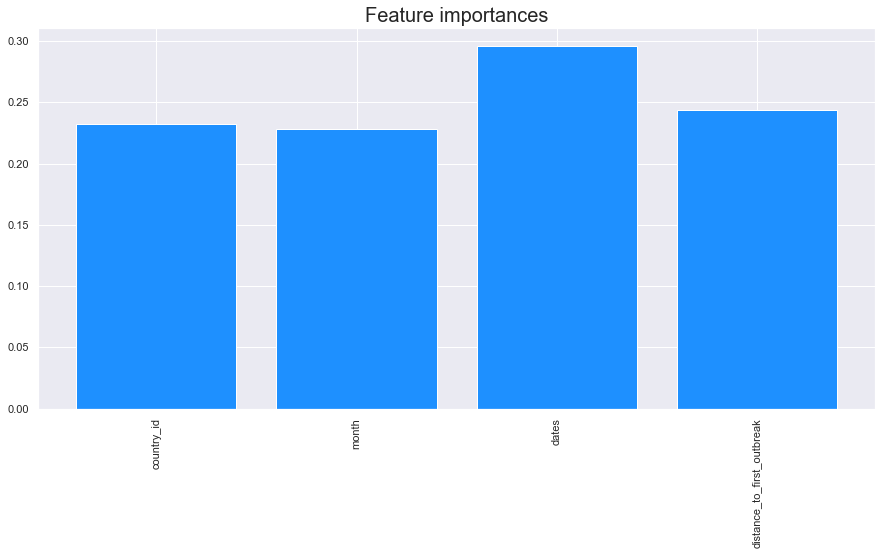

In [174]:
plt.figure()

plt.title("Feature importances",fontsize=20)

plt.bar(predict_labels,rf.feature_importances_, align="center", color='dodgerblue')

plt.xticks(predict_labels)

plt.xticks(rotation=90)

plt.show()

In [175]:
## predict on test set

confirm_case = rf.predict(test_dis[['country_id','month','dates','distance_to_first_outbreak']])

In [176]:
#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_fatal, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")


Mean Absolute Error: 37.16
Mean Squared Error: 224504.77
Root Mean Squared Error: 473.82 



In [177]:
## predict on test set

fatal_case = rf.predict(test_dis[['country_id','month','dates','distance_to_first_outbreak']])


In [178]:

forecaseId = pd.DataFrame(test[['ForecastId']])
confirm_case = round(pd.DataFrame(confirm_case),0)
fatal_case = round(pd.DataFrame(fatal_case),0)


final_result_rf_id = pd.concat([forecaseId,confirm_case,fatal_case],axis=1)
final_result_rf_id.columns = ['ForecastId','ConfirmedCases','Fatalities']

final_result_rf_id.tail()


,ForecastId,ConfirmedCases,Fatalities
13454,13455,11.0,3.0
13455,13456,14.0,3.0
13456,13457,14.0,3.0
13457,13458,17.0,3.0
13458,13459,17.0,3.0


In [179]:
final_result_rf_id.to_csv('results_rf_dis_id.csv',index=False)

### Try to apply for each countries

In [180]:
#run for each country
x_pred_lab = ['month','dates','distance_to_first_outbreak']

final_result_rf_dis_each = rf_each_country(seed=123, original_df=train, train_df=train_dis, test_df=test_dis, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1190.33
Mean Squared Error for Confirmed Case Prediction: 66202027.31
Root Mean Squared Error for Confirmed Case Prediction: 8136.46 

Mean Absolute Error for Fatal Case Prediction: 38.57
Mean Squared Error for Fatal Case Prediction: 223348.97
Root Mean Squared Error for Fatal Case Prediction: 472.6 



In [181]:
final_result_rf_dis_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,13.0,3.0
13455,13456,14.0,3.0
13456,13457,14.0,3.0
13457,13458,17.0,3.0
13458,13459,17.0,3.0


In [182]:
final_result_rf_dis_each.to_csv('submission.csv',index=False)

### Multilinear Regression

<a id='distance_lin'></a>


In [183]:
#run for each country
x_pred_lab = ['month','dates','distance_to_first_outbreak']

final_result_lin_dis_each = lin_each_country(seed=123, original_df=train, train_df=train_dis, test_df=test_dis, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1743.06
Mean Squared Error for Confirmed Case Prediction: 49550116.15
Root Mean Squared Error for Confirmed Case Prediction: 7039.18 

Mean Absolute Error for Fatal Case Prediction: 107.21
Mean Squared Error for Fatal Case Prediction: 320582.45
Root Mean Squared Error for Fatal Case Prediction: 566.2 



In [184]:
final_result_lin_dis_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,15.0,3.0
13455,13456,16.0,3.0
13456,13457,16.0,3.0
13457,13458,16.0,3.0
13458,13459,16.0,3.0


In [185]:
final_result_lin_dis_each.to_csv('final_result_lin_dis_each.csv',index=False)

### Bayesian Ridge Regression

<a id='distance_br'></a>


In [186]:
#run for each country
x_pred_lab = ['month','dates','distance_to_first_outbreak']

final_result_br_dis_each = br_each_country(seed=123, original_df=train, train_df=train_dis, test_df=test_dis, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1754.75
Mean Squared Error for Confirmed Case Prediction: 56170148.65
Root Mean Squared Error for Confirmed Case Prediction: 7494.67 

Mean Absolute Error for Fatal Case Prediction: 100.33
Mean Squared Error for Fatal Case Prediction: 325627.77
Root Mean Squared Error for Fatal Case Prediction: 570.64 



In [187]:
final_result_br_dis_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,15.0,3.0
13455,13456,15.0,3.0
13456,13457,15.0,3.0
13457,13458,16.0,3.0
13458,13459,16.0,3.0


In [188]:
final_result_br_dis_each.to_csv('final_result_br_dis_each.csv',index=False)

## Demographic Data

<a id='demo_predict'></a>


#### Merge dataframe

In [189]:
demo_data = demo_data.rename(columns={'country':'Country_Region'})

demo_data_join = demo_data.copy()

demo_data_join = demo_data_join.drop_duplicates(['Country_Region'],keep='first')

train_demo = pd.merge(train, demo_data_join[['Country_Region', 'pop', 'tests',
       'testpop', 'density', 'medianage', 'urbanpop', 
       'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54', 'sex64',
       'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility']], on=['Country_Region'], how='left')

test_demo = pd.merge(test, demo_data_join[['Country_Region', 'pop', 'tests',
       'testpop', 'density', 'medianage', 'urbanpop', 
       'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54', 'sex64',
       'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility']], on=['Country_Region'], how='left')

train_demo.head()


,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,pop,tests,testpop,density,...,sex54,sex64,sex65plus,sexratio,lung,femalelung,malelung,healthexp,healthperpop,fertility
0,1,NaN,Afghanistan,2020-01-22,0.0,0.0,38928346.0,NaN,NaN,60.0,...,1.03,0.97,0.85,1.03,37.62,36.31,39.33,184.0,4.726633,5.12
1,2,NaN,Afghanistan,2020-01-23,0.0,0.0,38928346.0,NaN,NaN,60.0,...,1.03,0.97,0.85,1.03,37.62,36.31,39.33,184.0,4.726633,5.12
2,3,NaN,Afghanistan,2020-01-24,0.0,0.0,38928346.0,NaN,NaN,60.0,...,1.03,0.97,0.85,1.03,37.62,36.31,39.33,184.0,4.726633,5.12
3,4,NaN,Afghanistan,2020-01-25,0.0,0.0,38928346.0,NaN,NaN,60.0,...,1.03,0.97,0.85,1.03,37.62,36.31,39.33,184.0,4.726633,5.12
4,5,NaN,Afghanistan,2020-01-26,0.0,0.0,38928346.0,NaN,NaN,60.0,...,1.03,0.97,0.85,1.03,37.62,36.31,39.33,184.0,4.726633,5.12


In [190]:
train_demo1 = train_demo.copy()

# Add additional variables
#month
train_demo1['month'] = train_demo1['Date'].dt.month

#date
train_demo1['dates'] = train_demo1['Date'].dt.day


### do the same for test data
test_demo1 = test_demo.copy()

# Add additional variables

#month
test_demo1['month'] = test_demo1['Date'].dt.month

#date
test_demo1['dates'] = test_demo1['Date'].dt.day


test_demo1.tail()

,ForecastId,Province_State,Country_Region,Date,pop,tests,testpop,density,medianage,urbanpop,...,sex65plus,sexratio,lung,femalelung,malelung,healthexp,healthperpop,fertility,month,dates
13454,13455,NaN,Zimbabwe,2020-05-10,14862924.0,NaN,NaN,38.0,18.7,38.4,...,0.64,1.01,22.53,19.31,26.47,182.0,12.245235,3.63,5,10
13455,13456,NaN,Zimbabwe,2020-05-11,14862924.0,NaN,NaN,38.0,18.7,38.4,...,0.64,1.01,22.53,19.31,26.47,182.0,12.245235,3.63,5,11
13456,13457,NaN,Zimbabwe,2020-05-12,14862924.0,NaN,NaN,38.0,18.7,38.4,...,0.64,1.01,22.53,19.31,26.47,182.0,12.245235,3.63,5,12
13457,13458,NaN,Zimbabwe,2020-05-13,14862924.0,NaN,NaN,38.0,18.7,38.4,...,0.64,1.01,22.53,19.31,26.47,182.0,12.245235,3.63,5,13
13458,13459,NaN,Zimbabwe,2020-05-14,14862924.0,NaN,NaN,38.0,18.7,38.4,...,0.64,1.01,22.53,19.31,26.47,182.0,12.245235,3.63,5,14


#### Interpolate missing values

In [191]:
### Interpolate missing values

train_demo1 = train_demo1.interpolate(method ='linear', limit_direction ='both')
test_demo1 = test_demo1.interpolate(method ='linear', limit_direction ='both')


#### Encoding country data

In [192]:
#ecoding countries data
labels, values = pd.factorize(train_demo1['Country_Region'])

train_demo1['country_id'] = labels

labels, values = pd.factorize(test_demo1['Country_Region'])

test_demo1['country_id'] = labels

test_demo1.head()


,ForecastId,Province_State,Country_Region,Date,pop,tests,testpop,density,medianage,urbanpop,...,sexratio,lung,femalelung,malelung,healthexp,healthperpop,fertility,month,dates,country_id
0,1,NaN,Afghanistan,2020-04-02,38928346.0,694.0,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,184.0,4.726633,5.12,4,2,0
1,2,NaN,Afghanistan,2020-04-03,38928346.0,694.0,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,184.0,4.726633,5.12,4,3,0
2,3,NaN,Afghanistan,2020-04-04,38928346.0,694.0,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,184.0,4.726633,5.12,4,4,0
3,4,NaN,Afghanistan,2020-04-05,38928346.0,694.0,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,184.0,4.726633,5.12,4,5,0
4,5,NaN,Afghanistan,2020-04-06,38928346.0,694.0,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,184.0,4.726633,5.12,4,6,0


#### Normalize data

In [193]:
### Train dataset

# Create x, where x the 'scores' column's values as floats
pop = train_demo1[['pop']].values.astype(float)
tests = train_demo1[['tests']].values.astype(float)
healthexp = train_demo1[['healthexp']].values.astype(float)

# Create a minimum and maximum processor object
min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
pop_scaled = min_max_scaler.fit_transform(pop)
test_scaled = min_max_scaler.fit_transform(tests)
healthexp_scaled = min_max_scaler.fit_transform(healthexp)

# Run the normalizer on the dataframe
train_demo1[['pop']] = pd.DataFrame(pop_scaled)
train_demo1[['tests']] = pd.DataFrame(test_scaled)
train_demo1[['healthexp']] = pd.DataFrame(healthexp_scaled)

train_demo1.head()

### Test dataset

# Create x, where x the 'scores' column's values as floats
pop = test_demo1[['pop']].values.astype(float)
tests = test_demo1[['tests']].values.astype(float)
healthexp = test_demo1[['healthexp']].values.astype(float)

# Create a minimum and maximum processor object
min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
pop_scaled = min_max_scaler.fit_transform(pop)
test_scaled = min_max_scaler.fit_transform(tests)
healthexp_scaled = min_max_scaler.fit_transform(healthexp)

# Run the normalizer on the dataframe
test_demo1[['pop']] = pd.DataFrame(pop_scaled)
test_demo1[['tests']] = pd.DataFrame(test_scaled)
test_demo1[['healthexp']] = pd.DataFrame(healthexp_scaled)

test_demo1.head()

,ForecastId,Province_State,Country_Region,Date,pop,tests,testpop,density,medianage,urbanpop,...,sexratio,lung,femalelung,malelung,healthexp,healthperpop,fertility,month,dates,country_id
0,1,NaN,Afghanistan,2020-04-02,0.028208,0.000678,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,0.02013,4.726633,5.12,4,2,0
1,2,NaN,Afghanistan,2020-04-03,0.028208,0.000678,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,0.02013,4.726633,5.12,4,3,0
2,3,NaN,Afghanistan,2020-04-04,0.028208,0.000678,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,0.02013,4.726633,5.12,4,4,0
3,4,NaN,Afghanistan,2020-04-05,0.028208,0.000678,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,0.02013,4.726633,5.12,4,5,0
4,5,NaN,Afghanistan,2020-04-06,0.028208,0.000678,4269.802594,60.0,18.0,25.0,...,1.03,37.62,36.31,39.33,0.02013,4.726633,5.12,4,6,0


### Random Forest Model

<a id='demo_rf'></a>


In [194]:
random.seed(123)

X = train_demo1[['country_id','pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates']]

y_confirm = train_demo1['ConfirmedCases']
y_fatal = train_demo1['Fatalities']

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_confirm, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)


print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")


# Print the name and gini importance of each feature
for feature in zip(predict_labels, rf.feature_importances_):
    print(feature)
    

Mean Absolute Error: 259.87
Mean Squared Error: 12176734.84
Root Mean Squared Error: 3489.52 

('country_id', 0.007634604807417281)
('pop', 0.01179911876296421)
('tests', 0.08051430281023972)
('testpop', 0.080180630716173)
('density', 0.016069750915749036)
('medianage', 0.012384958793477084)
('urbanpop', 0.013424508432203658)
('hospibed', 0.009604335502767175)
('smokers', 0.07330217319204166)
('sex0', 0.008196579157071018)
('sex14', 0.009695945264987517)
('sex25', 0.007992293640329013)
('sex54', 0.012958050480552324)
('sex64', 0.0075622646686529585)
('sex65plus', 0.009093604400591322)
('sexratio', 0.010487373825730189)
('lung', 0.05699619900690065)
('femalelung', 0.05840383984870256)
('malelung', 0.05770247418175942)
('healthexp', 0.010856258085340355)
('healthperpop', 0.010753891390140094)
('fertility', 0.01629170907638378)
('month', 0.19848607618192143)
('dates', 0.2196090568579046)


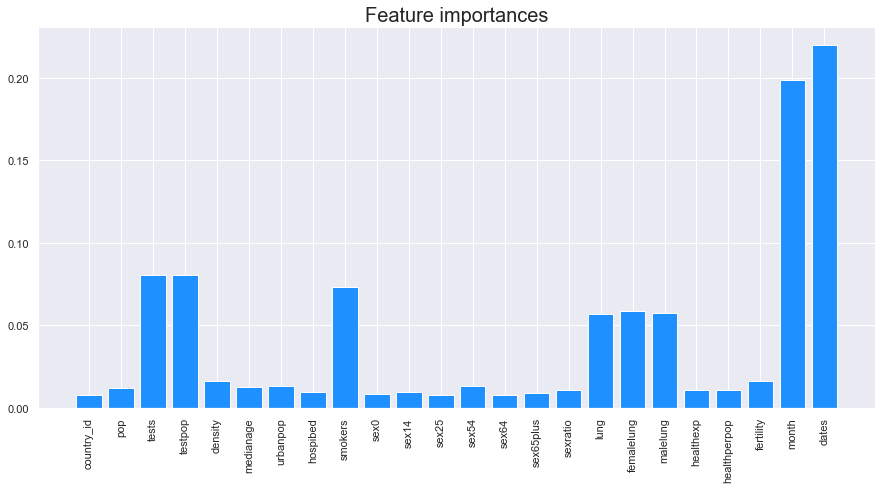

In [195]:
plt.figure()

plt.title("Feature importances",fontsize=20)

plt.bar(predict_labels,rf.feature_importances_, align="center", color='dodgerblue')

plt.xticks(predict_labels)

plt.xticks(rotation=90)

plt.show()

In [196]:
## predict on test set

confirm_case = rf.predict(test_demo1[['country_id','pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates']])


In [197]:
random.seed(123)

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_fatal, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")
    

Mean Absolute Error: 16.4
Mean Squared Error: 118612.52
Root Mean Squared Error: 344.4 



In [198]:
## predict on test set

fatal_case = rf.predict(test_demo1[['country_id','pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates']])

In [199]:
forecaseId = pd.DataFrame(test[['ForecastId']])
confirm_case = pd.DataFrame(confirm_case)
fatal_case = pd.DataFrame(fatal_case)


final_result_rf_demo = pd.concat([forecaseId,confirm_case,fatal_case],axis=1)
final_result_rf_demo.columns = ['ForecastId','ConfirmedCases','Fatalities']

final_result_rf_demo.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,11.0,3.0
13455,13456,14.0,3.0
13456,13457,14.0,3.0
13457,13458,17.0,3.0
13458,13459,17.0,3.0


In [200]:
final_result_rf_demo.to_csv('result_rf_demo.csv',index=False)

In [201]:
#run for each country
x_pred_lab = ['pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates']

final_result_rf_demo_each = rf_each_country(seed=123, original_df=train, train_df=train_demo1, test_df=test_demo1, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 356.13
Mean Squared Error for Confirmed Case Prediction: 25337921.62
Root Mean Squared Error for Confirmed Case Prediction: 5033.68 

Mean Absolute Error for Fatal Case Prediction: 20.51
Mean Squared Error for Fatal Case Prediction: 167684.9
Root Mean Squared Error for Fatal Case Prediction: 409.49 



In [202]:
final_result_rf_demo_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,13.0,3.0
13455,13456,14.0,3.0
13456,13457,14.0,3.0
13457,13458,17.0,3.0
13458,13459,17.0,3.0


In [203]:
final_result_rf_demo_each.to_csv('final_result_rf_demo_each.csv',index=False)

### Multilinear Regression

<a id='demo_lin'></a>


In [204]:
#run for each country
x_pred_lab = ['pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates']

final_result_lin_demo_each = lin_each_country(seed=123, original_df=train, train_df=train_demo1, test_df=test_demo1, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1694.07
Mean Squared Error for Confirmed Case Prediction: 47080906.61
Root Mean Squared Error for Confirmed Case Prediction: 6861.55 

Mean Absolute Error for Fatal Case Prediction: 104.14
Mean Squared Error for Fatal Case Prediction: 303262.09
Root Mean Squared Error for Fatal Case Prediction: 550.69 



In [205]:
final_result_lin_demo_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,15.0,3.0
13455,13456,16.0,3.0
13456,13457,16.0,3.0
13457,13458,16.0,3.0
13458,13459,16.0,3.0


In [206]:
final_result_lin_demo_each.to_csv('final_result_lin_demo_each.csv',index=False)

### Bayesian Ridge Regression

<a id='demo_br'></a>


In [207]:
#run for each country
x_pred_lab = ['pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates']

final_result_br_demo_each = br_each_country(seed=123, original_df=train, train_df=train_demo1, test_df=test_demo1, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1755.91
Mean Squared Error for Confirmed Case Prediction: 56809360.01
Root Mean Squared Error for Confirmed Case Prediction: 7537.2 

Mean Absolute Error for Fatal Case Prediction: 100.43
Mean Squared Error for Fatal Case Prediction: 320873.04
Root Mean Squared Error for Fatal Case Prediction: 566.46 



In [208]:
final_result_br_demo_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,15.0,3.0
13455,13456,15.0,3.0
13456,13457,15.0,3.0
13457,13458,16.0,3.0
13458,13459,16.0,3.0


In [209]:
final_result_br_demo_each.to_csv('final_result_br_demo_each.csv',index=False)

### Understand the effect of each demographic variables on the transmission of the virus via multilinear regression model

<a id='demo_understand'></a>


### Confirm Cases

In [238]:
#construct the OLS model
X = train_demo1[[ 'testpop', 'density','urbanpop']]
y = train_demo1['ConfirmedCases']

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y, test_size=0.3, random_state=0)


# Note the difference in argument order
model = sm.OLS(y_train_rf, X_train_rf).fit()
predictions = model.predict(X_test_rf) # make the predictions by the model

model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:         ConfirmedCases   R-squared (uncentered):                   0.025
Model:                            OLS   Adj. R-squared (uncentered):              0.025
Method:                 Least Squares   F-statistic:                              164.5
Date:                Sun, 19 Apr 2020   Prob (F-statistic):                   2.92e-105
Time:                        17:24:41   Log-Likelihood:                     -2.0136e+05
No. Observations:               19061   AIC:                                  4.027e+05
Df Residuals:                   19058   BIC:                                  4.028e+05
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
testpop        0.0060      0.002      3.340      0.001       0.002       0.009
density        0.0010      0.027      0.035      0.972      -0.053       0.055
urbanpop      17.7089      1.112     15.923      0.000      15.529      19.889
==============================================================================
Omnibus:                    32960.939   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         27436023.864
Skew:                          12.328   Prob(JB):                         0.00
Kurtosis:                     187.220   Cond. No.                         706.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### We can see that density of the population, and the number of people who smoke have significantly effects on the increase of the confirmed case. While having more ICU beds would decrease the number of transmission by a significant amount.

#### We can also see if the country have higher median age, the more infected cases they will have.


### Fatal Cases

In [211]:
#construct the OLS model
X = train_demo1[[ 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'lung', 'femalelung', 'malelung','fertility']]
y = train_demo1['Fatalities']

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y, test_size=0.3, random_state=0)


# Note the difference in argument order
model = sm.OLS(y_train_rf, X_train_rf).fit()
predictions = model.predict(X_test_rf) # make the predictions by the model

model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             Fatalities   R-squared (uncentered):                   0.018
Model:                            OLS   Adj. R-squared (uncentered):              0.018
Method:                 Least Squares   F-statistic:                              35.87
Date:                Sun, 19 Apr 2020   Prob (F-statistic):                    2.84e-70
Time:                        15:52:46   Log-Likelihood:                     -1.5470e+05
No. Observations:               19061   AIC:                                  3.094e+05
Df Residuals:                   19051   BIC:                                  3.095e+05
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
testpop        0.0007      0.000      3.955      0.000       0.000       0.001
density       -0.0057      0.003     -2.190      0.029      -0.011      -0.001
medianage     10.6592      1.042     10.233      0.000       8.618      12.701
urbanpop      -1.4144      0.340     -4.164      0.000      -2.080      -0.749
hospibed     -23.7496      4.008     -5.926      0.000     -31.605     -15.894
smokers       -0.2933      0.848     -0.346      0.729      -1.955       1.368
lung         -19.1991     10.369     -1.852      0.064     -39.524       1.126
femalelung     7.8378      6.288      1.247      0.213      -4.487      20.162
malelung       7.8896      4.191      1.883      0.060      -0.325      16.104
fertility    -13.3233      5.256     -2.535      0.011     -23.625      -3.022
==============================================================================
Omnibus:                    38924.019   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         96540125.529
Skew:                          17.363   Prob(JB):                         0.00
Kurtosis:                     349.914   Cond. No.                     9.42e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.42e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Similarly, when we increase the number of ICU beds by 1 unit, we can save 8 more people given all the variables in the model. Country with higher medium age also have the tendency to witness more fatal cases.


## Combine all original, weather, distance and demographic data together

<a id='all_predict'></a>


In [212]:
weather_train = weather_train.drop(['Id'],axis=1)

weather_train = weather_train.rename(columns={'Id.1':'Id'})


In [213]:
weather_test1 = weather_test1.drop(['ForecastId'],axis=1)

weather_test1 = weather_test1.rename(columns={'ForecastId.1':'ForecastId'})


In [214]:
##combine dataframe

#train

train_all = pd.merge(train_first_result,train_demo1[['Id','Country_Region', 'Date', 
                                                     'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates',
       'country_id']], on=['Id','Country_Region','Date','country_id','month', 'dates'], how='left')

train_all = pd.merge(train_all,weather_train[['Id','Country_Region', 'Date', 'Lat', 'Long',
       'day_from_jan_first', 'temp', 'stp', 'wdsp', 'prcp',
       'fog','month','dates']], on=['Id','Country_Region','Date','month','dates'], how='left')

train_all = pd.merge(train_all,train_dis[['Id','Country_Region', 'Date', 'month', 'dates', 'distance_to_first_outbreak',
       'country_id']], on=['Id','Country_Region','Date','country_id','month', 'dates'], how='left')

train_all = train_all.dropna(subset=['day_from_jan_first'])


In [215]:
#test

test_all = pd.merge(test_first_result,test_demo1[['ForecastId','Country_Region', 'Date', 
                                                     'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'month', 'dates',
       'country_id']], on=['ForecastId','Country_Region','Date','country_id','month', 'dates'], how='left')

test_all = pd.merge(test_all,weather_test1[['ForecastId','Country_Region', 'Date',
       'Lat', 'Long',
       'day_from_jan_first', 'temp', 'stp', 'wdsp', 'prcp',
       'fog', 'month', 'dates', 'country_id']], on=['ForecastId','Country_Region',
                                                    'Date','country_id','month', 'dates'], how='left')

test_all = pd.merge(test_all,test_dis[['ForecastId','Country_Region', 'Date', 'month', 
                                          'dates', 'distance_to_first_outbreak',
       'country_id']], on=['ForecastId','Country_Region','Date','country_id','month', 'dates'], how='left')


### Random Forest Model

<a id='all_rf'></a>


In [216]:
random.seed(123)

X = train_all[['month', 'dates', 'days_since_first_outbreak',
       'country_id', 'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'Lat',
       'Long', 'day_from_jan_first', 'temp','stp', 'wdsp',
       'prcp', 'fog', 'distance_to_first_outbreak']]
y_confirm = train_all['ConfirmedCases']
y_fatal = train_all['Fatalities']

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_confirm, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")


# Print the name and gini importance of each feature
for feature in zip(predict_labels, rf.feature_importances_):
    print(feature)

Mean Absolute Error: 168.33
Mean Squared Error: 4218522.33
Root Mean Squared Error: 2053.9 

('month', 0.05937331849351626)
('dates', 0.053922914698161704)
('days_since_first_outbreak', 0.1765865539330708)
('country_id', 0.006855564687757549)
('pop', 0.008874069998816073)
('tests', 0.03259705419814974)
('testpop', 0.030998374341252247)
('density', 0.010980102229291466)
('medianage', 0.009870035841034847)
('urbanpop', 0.009387207543820109)
('hospibed', 0.006882641199042885)
('smokers', 0.03384642388532005)
('sex0', 0.005990720656682583)
('sex14', 0.006609782404004964)
('sex25', 0.005656628461055616)
('sex54', 0.009310173646320342)
('sex64', 0.006004241961744896)
('sex65plus', 0.006047650316479858)
('sexratio', 0.007444256026962566)
('lung', 0.02818182896570691)
('femalelung', 0.028754112980403427)
('malelung', 0.028855719460990695)
('healthexp', 0.011361124718040296)
('healthperpop', 0.007879303898001996)
('fertility', 0.010835952163734447)
('Lat', 0.03129900226756956)
('Long', 0.039223

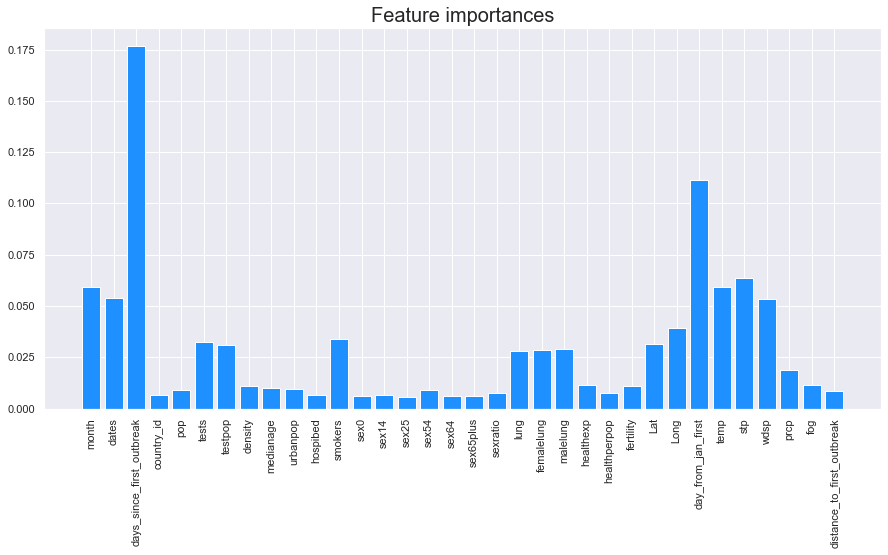

In [217]:
plt.figure()

plt.title("Feature importances",fontsize=20)

plt.bar(predict_labels,rf.feature_importances_, align="center", color='dodgerblue')

plt.xticks(predict_labels)

plt.xticks(rotation=90)

plt.show()

In [218]:
## predict on test set

confirm_case = rf.predict(test_all[['month', 'dates', 'days_since_first_outbreak',
       'country_id', 'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'Lat',
       'Long', 'day_from_jan_first', 'temp', 'stp', 'wdsp',
       'prcp', 'fog', 'distance_to_first_outbreak']])


In [219]:
random.seed(123)

#Now we find the best parameters to fit in the Random Forest model, we will use it to measure the feature important in the data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y_fatal, test_size=0.3, random_state=0)

predict_labels = X.columns

#RF model
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train_rf, y_train_rf)

y_pred_rf = rf.predict(X_test_rf)

print('Mean Absolute Error:', round(metrics.mean_absolute_error(y_test_rf, y_pred_rf),2))  
print('Mean Squared Error:', round(metrics.mean_squared_error(y_test_rf, y_pred_rf),2))  
print('Root Mean Squared Error:', round(np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)),2), "\n")
    
fatal_case = rf.predict(test_all[['month', 'dates', 'days_since_first_outbreak',
       'country_id', 'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'Lat',
       'Long', 'day_from_jan_first', 'temp', 'stp', 'wdsp',
       'prcp', 'fog', 'distance_to_first_outbreak']])


Mean Absolute Error: 11.88
Mean Squared Error: 48438.39
Root Mean Squared Error: 220.09 



In [220]:
forecaseId = pd.DataFrame(test[['ForecastId']])
confirm_case = pd.DataFrame(confirm_case)
fatal_case = pd.DataFrame(fatal_case)


final_result_all = pd.concat([forecaseId,confirm_case,fatal_case],axis=1)
final_result_all.columns = ['ForecastId','ConfirmedCases','Fatalities']

final_result_all.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,0.0,0.0
13455,13456,0.0,0.0
13456,13457,0.0,0.0
13457,13458,0.0,0.0
13458,13459,0.0,0.0


In [221]:
final_result_all.to_csv('result_all_rf.csv',index=False)

### Try to apply for each country

In [222]:
#run for each country
x_pred_lab = ['month', 'dates', 'days_since_first_outbreak',
       'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'Lat',
       'Long', 'day_from_jan_first', 'temp','stp', 'wdsp',
       'prcp', 'fog', 'distance_to_first_outbreak']

final_result_rf_all_each = rf_each_country(seed=123, original_df=train, train_df=train_all, test_df=test_all, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 219.12
Mean Squared Error for Confirmed Case Prediction: 7008522.19
Root Mean Squared Error for Confirmed Case Prediction: 2647.36 

Mean Absolute Error for Fatal Case Prediction: 16.55
Mean Squared Error for Fatal Case Prediction: 79415.11
Root Mean Squared Error for Fatal Case Prediction: 281.81 



In [223]:
final_result_rf_all_each.tail()


,ForecastId,ConfirmedCases,Fatalities
13454,13455,0.0,0.0
13455,13456,0.0,3.0
13456,13457,0.0,3.0
13457,13458,0.0,3.0
13458,13459,0.0,0.0


In [224]:
final_result_rf_all_each.to_csv('final_result_rf_all_each.csv',index=False)

### Multilinear Regression Model

<a id='all_lin'></a>


In [225]:
#run for each country
x_pred_lab = ['month', 'dates', 'days_since_first_outbreak',
       'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'Lat',
       'Long', 'day_from_jan_first', 'temp', 'stp', 'wdsp',
       'prcp', 'fog', 'distance_to_first_outbreak']

final_result_lin_all_each = lin_each_country(seed=123, original_df=train, train_df=train_all, test_df=test_all, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1572.39
Mean Squared Error for Confirmed Case Prediction: 44463395.31
Root Mean Squared Error for Confirmed Case Prediction: 6668.09 

Mean Absolute Error for Fatal Case Prediction: 99.81
Mean Squared Error for Fatal Case Prediction: 242668.53
Root Mean Squared Error for Fatal Case Prediction: 492.61 



In [226]:
final_result_lin_all_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,123.0,30.0
13455,13456,123.0,30.0
13456,13457,124.0,30.0
13457,13458,125.0,31.0
13458,13459,125.0,31.0


In [227]:
final_result_lin_all_each.to_csv('final_result_lin_all_each.csv',index=False)

### Bayesian Ridge Regression 

<a id='all_br'></a>


In [228]:
#run for each country
x_pred_lab = ['month', 'dates', 'days_since_first_outbreak',
       'pop', 'tests', 'testpop', 'density', 'medianage',
       'urbanpop', 'hospibed', 'smokers', 'sex0', 'sex14', 'sex25', 'sex54',
       'sex64', 'sex65plus', 'sexratio', 'lung', 'femalelung', 'malelung',
       'healthexp', 'healthperpop', 'fertility', 'Lat',
       'Long', 'day_from_jan_first', 'temp', 'stp', 'wdsp',
       'prcp', 'fog', 'distance_to_first_outbreak']

final_result_br_all_each = br_each_country(seed=123, original_df=train, train_df=train_all, test_df=test_all, 
                        confirm ='ConfirmedCases', fatal='Fatalities', xlabels = x_pred_lab, test_size = 0.3)


Mean Absolute Error for Confirmed Case Prediction: 1626.37
Mean Squared Error for Confirmed Case Prediction: 43672925.04
Root Mean Squared Error for Confirmed Case Prediction: 6608.55 

Mean Absolute Error for Fatal Case Prediction: 105.66
Mean Squared Error for Fatal Case Prediction: 271713.82
Root Mean Squared Error for Fatal Case Prediction: 521.26 



In [229]:
final_result_br_all_each.tail()

,ForecastId,ConfirmedCases,Fatalities
13454,13455,22.0,6.0
13455,13456,22.0,6.0
13456,13457,23.0,6.0
13457,13458,23.0,6.0
13458,13459,24.0,6.0


In [230]:
final_result_br_all_each.to_csv('final_result_br_all_each.csv',index=False)

## Closing Remarks

<a id='conclusion'></a>

- The goal of this analysis is to provide some data-informed insights about the COVID-19 transmission. Recommendations are based on my data exploration and personal perspectives. Therefore, the prediction results are solely served as reference and should not act as any concrete statement for actual future events. 

- More tuning, improvement and up-to-date data will be needed for future analysis and iteration. However, it's also fundamental to research more about the pandemic itself and learn from epidemiology experts.

- It is a very rewarding experience during the #HappyAtHome self-quarantine time to learn something new, perform analysis on completely different field from what I have done before and (hopefully) provide some meaningful insights to help us combat the pandemic together.

### All in all, I hope you stay safe and healthy, wash your hands, and #StayHome to help our healthcare workers who are working insanely hard in the front line!


#### Further Readings:
- [The Impact of Coronavirus (COVID-19) on Foot Traffic
](https://www.safegraph.com/dashboard/covid19-commerce-patterns?is=5e7a66538dd3816c985d8fc7)

- [Coronavirus: Why You Must Act Now](https://medium.com/@tomaspueyo/coronavirus-act-today-or-people-will-die-f4d3d9cd99ca)

- [Coronavirus: The Hammer and the Dance](https://medium.com/@tomaspueyo/coronavirus-the-hammer-and-the-dance-be9337092b56)

- [Flatten the curve with South Korea](https://www.nytimes.com/2020/03/23/world/asia/coronavirus-south-korea-flatten-curve.html)